## Notebook for the integration and pathway analysis of the VAE


## Make the sample groups that we're interested in

In [26]:
import pandas as pd
import pandas as pd
from collections import defaultdict
import seaborn as sns
import numpy as np
from scivae import VAE
import warnings
warnings.filterwarnings("ignore")
case_rand_dict = None

base_dir = '../data/S050_CCRCC_Clark_Cell2019/sircle/'
stats_base_dir = f'{base_dir}integration/'
stats_stats_dir = f'{stats_base_dir}output_data/stats_files/'
stats_output_dir = f'{stats_base_dir}output_data/comparisons/'
stats_fig_dir = f'{stats_base_dir}output_data/figures/'
stats_vae_dir = f'{stats_base_dir}output_data/vae/'

# Read in the data
stats_data_dir =  f'{stats_base_dir}input_data/'

In [27]:
rna_sample_file = f'../data/S050_CCRCC_Clark_Cell2019/sircle/rna_sample_df_sircle_ccRCC.csv'
prot_sample_file = f'../data/S050_CCRCC_Clark_Cell2019/sircle/prot_sample_data_sircle_ccRCC.csv'
# Now we want to merge the clinical info with the cases from the sample df
meth_sample_file = f'../data/S050_CCRCC_Clark_Cell2019/sircle/meth_sample_df_CPTAC-TCGA.csv'


In [28]:
cptac_clin_df = pd.read_csv(f'../data/S050_CCRCC_Clark_Cell2019/sircle/clinical_sircle_13052022.csv')
tcga_clin_df = pd.read_csv(f'../data/S050_CCRCC_Clark_Cell2019/sircle/clinical_TCGA_13052022.csv')
# Save to csv file
tcga_cptac_clin = cptac_clin_df.append(tcga_clin_df)


In [29]:
tcga_cptac_clin

,SafeCases,case_id,gender,TumorStage,AgeGrouped,BMIGrouped,RaceGrouped,MTOR_mutation,VHL_mutation,SETD2_mutation,...,TTN_mutation,BAP1_mutation,CIMPStatus,GenomeInstability,case,SampleId,CondId,CondName,FullLabel,tcga_case_id
0,C3L.00004,C3L-00004,Male,Stage III,old,normal,White,0,1,1,...,0,0,1.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
1,C3L.00010,C3L-00010,Male,Stage I,young,between,White,0,1,0,...,0,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
2,C3L.00011,C3L-00011,Female,Stage IV,old,between,White,0,1,0,...,1,0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
3,C3L.00026,C3L-00026,Female,Stage I,old,between,White,0,1,0,...,1,0,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN
4,C3L.00079,C3L-00079,Male,Stage III,middle,obese,White,0,1,0,...,0,0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
146,f29b6c8c.d713.42ad.9b90.e556df9b05cd,NaN,Male,Stage III,middle,NaN,White,0,1,0,...,0,0,NaN,NaN,f29b6c8c-d713-42ad-9b90-e556df9b05cd,f29b6c8c-d713-42ad-9b90-e556df9b05cd_Normal,0.0,Normal,CpG_Normal_f29b6c8c.d713.42ad.9b90.e556df9b05cd_1,TCGA-CZ-5458
147,cb371398.ee48.4665.8089.26229c5b2cf0,NaN,Male,Stage IV,old,NaN,White,0,0,0,...,0,0,NaN,NaN,cb371398-ee48-4665-8089-26229c5b2cf0,cb371398-ee48-4665-8089-26229c5b2cf0_Normal,0.0,Normal,CpG_Normal_cb371398.ee48.4665.8089.26229c5b2cf0_1,TCGA-CZ-5464
148,ac092a8e.80af.4589.8bb8.d86427b398ca,NaN,Male,Stage I,middle,NaN,Blackorafricanamerican,0,0,0,...,0,0,NaN,NaN,ac092a8e-80af-4589-8bb8-d86427b398ca,ac092a8e-80af-4589-8bb8-d86427b398ca_Normal,0.0,Normal,CpG_Normal_ac092a8e.80af.4589.8bb8.d86427b398ca_1,TCGA-A3-3376
149,318f6ffb.1fdf.4f74.90db.21e337503aae,NaN,Male,Stage III,middle,NaN,White,0,0,0,...,0,0,NaN,NaN,318f6ffb-1fdf-4f74-90db-21e337503aae,318f6ffb-1fdf-4f74-90db-21e337503aae_Normal,0.0,Normal,CpG_Normal_318f6ffb.1fdf.4f74.90db.21e337503aae_1,TCGA-B0-4810


In [5]:
stages = []
for stage in tcga_cptac_clin['TumorStage'].values:
    if stage == 'Stage I' or stage == 'Stage II':
        stages.append('Early')
    elif stage == 'Stage III' or stage == 'Stage IV':
        stages.append('Late')
    else:
        stages.append(None)
tcga_cptac_clin['Stage'] = stages

In [6]:
# Make a new column which is comparing BAP1 vs PBRM1 mutations
mutation_combined = []
bap1 = tcga_cptac_clin['BAP1_mutation'].values
for i, pbrm1 in enumerate(tcga_cptac_clin['PBRM1_mutation'].values):
    if bap1[i] == 1 and pbrm1 == 0:
        mutation_combined.append('BAP1')
    elif  bap1[i] == 0 and pbrm1 == 1:
        mutation_combined.append('PBRM1')
    else:
        mutation_combined.append(None)
        

In [7]:
tcga_cptac_clin['BAP1&PBRM1'] = mutation_combined
print(len(tcga_cptac_clin[tcga_cptac_clin['BAP1&PBRM1'] == 'PBRM1']), len(tcga_cptac_clin[tcga_cptac_clin['BAP1&PBRM1'] == 'BAP1']))

88 23


In [8]:
tcga_cptac_clin.to_csv(f'{stats_data_dir}clinical_CPTAC_TCGA.csv', index=False)


## Save data to csv files

In [9]:
rcm_df = pd.read_csv(f'../data/S050_CCRCC_Clark_Cell2019/sircle/all_patients/RCM_all_patients_ccRCC_P0.5-R1.0-M0.1-GENES.csv')
# First filter out any NA values (we're not interested in non SiRCle genes)
rcm_df = rcm_df[rcm_df['Regulation_Grouping_2'] != 'None']
gene_id = 'ensembl_gene_id'
meta_cols = [gene_id, 'external_gene_name', 'entrezgene_id', 'Locus', 'hgnc_symbol', "logFC_rna", "padj_rna", "CpG_Beta_diff", "padj_meth", "logFC_protein", "padj_protein", "Regulation_Grouping_2"]

cpg_data_df = rcm_df[[gene_id] + [c for c in rcm_df.columns if 'CpG' in c and c != 'CpG_Beta_diff']]
rna_data_df = rcm_df[[gene_id] + [c for c in rcm_df.columns if 'RNA' in c]]
protein_data_df = rcm_df[[gene_id] + [c for c in rcm_df.columns if 'Protein' in c]]

# Save to input dir
save_input_data = False

meta_rcm_df = rcm_df[meta_cols].copy()
meta_rcm_df.set_index('ensembl_gene_id', inplace=True)
# Save to the input data dir folder.
if save_input_data:
    protein_data_df.to_csv(f'{stats_data_dir}CPTAC_protein.csv', index=False)
    rna_data_df.to_csv(f'{stats_data_dir}CPTAC_rna.csv', index=False)
    cpg_data_df.to_csv(f'{stats_data_dir}CPTAC_cpg.csv', index=False)
    meta_rcm_df.to_csv(f'{stats_data_dir}RCM.csv')

## Run Integration

In [15]:
#! pip install /Users/ariane/Documents/code/scircm/dist/scircm-1.0.1.tar.gz

In [10]:
from scircm import RCMStats
missing_method='mean'
label=missing_method
sv = RCMStats(rcm_file=f'{stats_data_dir}RCM.csv', 
              patient_sample_file=f'{stats_data_dir}clinical_CPTAC_TCGA.csv',
              meth_file=f'{stats_data_dir}CPTAC_cpg.csv', 
              meth_sample_file=meth_sample_file, 
              rna_file=f'{stats_data_dir}CPTAC_rna.csv', 
              rna_sample_file=rna_sample_file,
              protein_file=f'{stats_data_dir}CPTAC_protein.csv', 
              protein_sample_file=prot_sample_file,
              output_folder=stats_vae_dir, 
              column_id='FullLabel',
              condition_column='CondId',
              patient_id_column='SafeCases',
              run_name=label,
              normalise='rows', 
              verbose=True,
             missing_method=missing_method)


--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Overlap between SiRCLe gene clusters and protein, RNA, and CpG: 	6718	
	If you used SiRCLe, this should be the total number of genes in your SiRCLe dataset. 6718	
 First 5 gene IDs in RCM: 	['ENSG00000101188', 'ENSG00000150556', 'ENSG00000036828', 'ENSG00000196376', 'ENSG00000198435']	
 First 5 gene IDs in Protein: 	['ENSG00000101188', 'ENSG00000150556', 'ENSG00000036828', 'ENSG00000196376', 'ENSG00000198435']	
 First 5 gene IDs in RNA: 	['ENSG00000101188', 'ENSG00000150556', 'ENSG00000036828', 'ENSG00000196376', 'ENSG00000198435']	
 First 5 gene IDs in Methylation: 	['ENSG00000101188', 'ENSG00000150556', 'ENSG00000036828', 'ENSG00000196376', 'ENSG00000198435']	
--------------------------------------------------------------------------------
-----

--------------------------------------------------------------------------------
Had multiple samples for: 	C3N.00494	just took the first one.	['RNA_Tumor_C3N.00494_1' 'RNA_Tumor_C3N.00494_2' 'RNA_Tumor_C3N.00494_3']	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Had multiple samples for: 	C3N.00573	just took the first one.	['RNA_Tumor_C3N.00573_1' 'RNA_Tumor_C3N.00573_2' 'RNA_Tumor_C3N.00573_3'
 'RNA_Tumor_C3N.00573_4']	
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Had multiple samples for: 	C3N.00577	just took the first one.	['RNA_Tumor_C3N.00577_1' 'RNA_Tumor_C3N.00577_2' 'RNA_Tumor_C3N.00577_3']	
--------------------------------------------------------------------------------
------------------------------------------------------------------------------

In [11]:
# Get the patient info that has been compiled from the provided sample files
patient_info = sv.patient_clinical_df
# Select the cases with 5 samples 
matching_patient_info = patient_info[patient_info['Sample counts'] == 5]
matching_cases = matching_patient_info['SafeCases'].values
print("total number of patients: ", len(patient_info), " vs number with matching data: ", len(matching_patient_info))
matching_cases

total number of patients:  261  vs number with matching data:  59


array(['C3L.00004', 'C3L.00010', 'C3L.00011', 'C3L.00026', 'C3L.00079',
       'C3L.00088', 'C3L.00096', 'C3L.00097', 'C3L.00103', 'C3L.00360',
       'C3L.00369', 'C3L.00416', 'C3L.00418', 'C3L.00447', 'C3L.00581',
       'C3L.00606', 'C3L.00814', 'C3L.00902', 'C3L.00907', 'C3L.00908',
       'C3L.00910', 'C3L.00917', 'C3L.01286', 'C3L.01287', 'C3L.01313',
       'C3L.01603', 'C3L.01607', 'C3L.01836', 'C3N.00148', 'C3N.00149',
       'C3N.00150', 'C3N.00177', 'C3N.00194', 'C3N.00244', 'C3N.00310',
       'C3N.00314', 'C3N.00390', 'C3N.00494', 'C3N.00495', 'C3N.00573',
       'C3N.00577', 'C3N.00646', 'C3N.00733', 'C3N.00831', 'C3N.00834',
       'C3N.00852', 'C3N.01176', 'C3N.01178', 'C3N.01179', 'C3N.01200',
       'C3N.01214', 'C3N.01220', 'C3N.01261', 'C3N.01361', 'C3N.01522',
       'C3N.01646', 'C3N.01649', 'C3N.01651', 'C3N.01808'], dtype=object)

In [20]:
cptac = patient_info[~patient_info['case_id'].isnull()]
old = cptac[cptac['AgeGrouped'] == 'old']
young = cptac[cptac['AgeGrouped'] == 'young']


In [24]:
# Now do the number / percent stage 1 and stage 4
s4 = old[old['TumorStage'] == 'Stage IV']
s2 = old[old['TumorStage'] == 'Stage II']
s3 = old[old['TumorStage'] == 'Stage III']
s1 = old[old['TumorStage'] == 'Stage I']
print(len(s1), len(s2), len(s3), len(s4))
print(len(s1)/len(old), len(s2)/len(old), len(s3)/len(old), len(s4)/len(old))

27 9 24 6
0.4090909090909091 0.13636363636363635 0.36363636363636365 0.09090909090909091


In [25]:
# Now do the number / percent stage 1 and stage 4
s4 = young[young['TumorStage'] == 'Stage IV']
s2 = young[young['TumorStage'] == 'Stage II']
s3 = young[young['TumorStage'] == 'Stage III']
s1 = young[young['TumorStage'] == 'Stage I']
print(len(s1), len(s2), len(s3), len(s4))
print(len(s1)/len(young), len(s2)/len(young), len(s3)/len(young), len(s4)/len(young))

7 1 1 0
0.7777777777777778 0.1111111111111111 0.1111111111111111 0.0


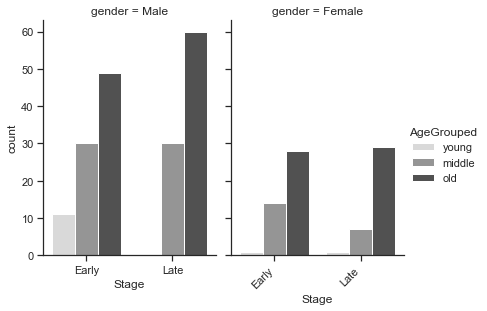

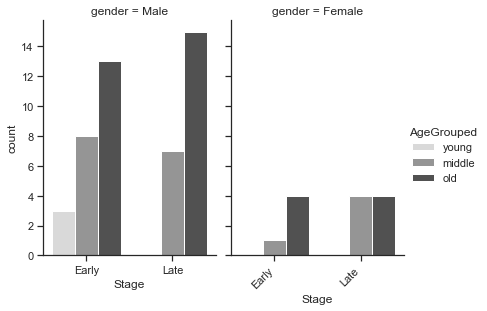

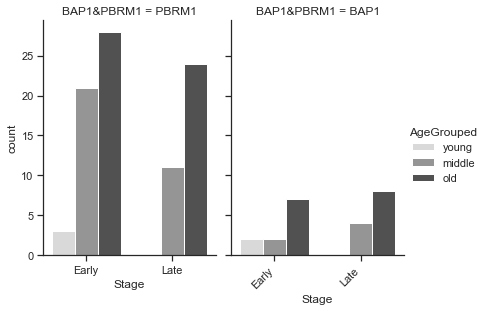

(array([0, 1]), [Text(0, 0, 'Early'), Text(1, 0, 'Late')])

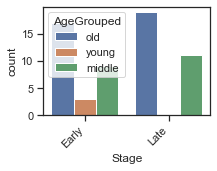

In [62]:
import matplotlib.pyplot as plt

palette = ['#483873', '#1BD8A6', '#B117B7', '#AAC7E2', '#FFC107', '#016957', '#9785C0',
     '#D09139', '#338A03', '#FF69A1', '#5930B1', '#FFE884', '#35B567', '#1E88E5',
     '#ACAD60', '#A2FFB4', '#B618F5', '#854A9C']
plt.rcParams['svg.fonttype'] = 'none'  # Ensure text is saved as text
plt.rcParams['figure.figsize'] = (3, 2)
sns.set(rc={'figure.figsize': (3, 2), 'font.family': 'sans-serif',
            'font.sans-serif': 'Arial', 'font.size': 9}, style='ticks')

g = sns.catplot(x="Stage", hue="AgeGrouped", col="gender",
                order=['Early', 'Late'],
                data=patient_info, kind="count", palette='Greys', hue_order=['young', 'middle', 'old'],
                height=4, aspect=.7)
plt.xticks(rotation=45, ha='right')
plt.savefig(f'{stats_fig_dir}patient_demographics_all.svg')
plt.show()

g = sns.catplot(x="Stage", hue="AgeGrouped", col="gender",
                order=['Early', 'Late'],
                data=matching_patient_info, kind="count", palette='Greys', hue_order=['young', 'middle', 'old'],
                height=4, aspect=.7)
plt.xticks(rotation=45, ha='right')
plt.savefig(f'{stats_fig_dir}patient_demographics_matched.svg')
plt.show()

g = sns.catplot(x="Stage", hue="AgeGrouped", col="BAP1&PBRM1",
                order=['Early', 'Late'],
                data=patient_info, kind="count", palette='Greys', hue_order=['young', 'middle', 'old'],
                height=4, aspect=.7)
plt.xticks(rotation=45, ha='right')
plt.savefig(f'{stats_fig_dir}patient_demographics_BAP1&PBRM1_all.svg')
plt.show()

g = sns.countplot(x="Stage", hue="AgeGrouped",
                order=['Early', 'Late'],
                data=matching_patient_info)
plt.xticks(rotation=45, ha='right')


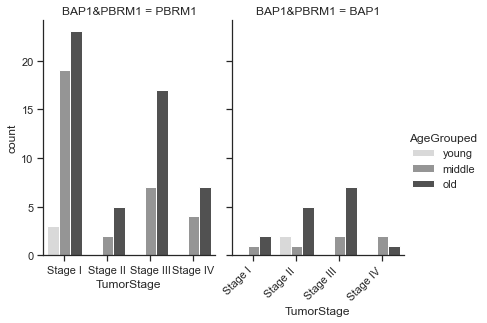

In [63]:
g = sns.catplot(x="TumorStage", hue="AgeGrouped", col="BAP1&PBRM1", hue_order=['young', 'middle', 'old'],
                data=patient_info, kind="count", palette='Greys', order=['Stage I', 'Stage II', 'Stage III', 'Stage IV'],
                height=4, aspect=.7)
plt.xticks(rotation=45, ha='right')
plt.savefig(f'{stats_fig_dir}patient_demographics_BAP1&PBRM1.svg')
plt.show()

## Train integration model (VAE)

In [65]:
train = False
if train:
    epochs = 100 
    batch_size = 16
    num_nodes = 5
    mmd_weight = 0.25
    loss = {'loss_type': 'mse', 'distance_metric': 'mmd', 'mmd_weight': mmd_weight}
    config = {"loss": loss,
              "encoding": {"layers": [{"num_nodes": num_nodes, "activation_fn": "relu"}]},
              "decoding": {"layers": [{"num_nodes": num_nodes, "activation_fn": "relu"}]},
              "latent": {"num_nodes": 1},
              "optimiser": {"params": {'learning_rate': 0.01}, "name": "adam"},
              "epochs": epochs,
              "batch_size": batch_size,
              "scale_data": False
              }
    training_cases = matching_cases # Use matching cases for training
    sv.train_vae(cases=matching_cases, config=config)
    sv.save()  # Save the information we have generated.
else:
    sv.load_saved_vaes()
    sv.load_saved_encodings(f'{sv.output_folder}encoded_df_{label}.csv')
    sv.load_saved_inputs(f'{sv.output_folder}vae_input_df_{label}.csv')
    sv.load_saved_raws(f'{sv.output_folder}raw_input_df_{label}.csv')

7
--------------------------------------------------------------------------------
                               Encoder summary:	                                
--------------------------------------------------------------------------------
Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
default_input (InputLayer)      [(None, 7)]          0                                            
__________________________________________________________________________________________________
dense (Dense)                   (None, 5)            40          default_input[0][0]              
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 1)            6           dense[0][0]                      
_____________________________________________

7
--------------------------------------------------------------------------------
                               Encoder summary:	                                
--------------------------------------------------------------------------------
Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
default_input (InputLayer)      [(None, 7)]          0                                            
__________________________________________________________________________________________________
dense_9 (Dense)                 (None, 5)            40          default_input[0][0]              
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 1)            6           dense_9[0][0]                    
_____________________________________________

7
--------------------------------------------------------------------------------
                               Encoder summary:	                                
--------------------------------------------------------------------------------
Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
default_input (InputLayer)      [(None, 7)]          0                                            
__________________________________________________________________________________________________
dense_18 (Dense)                (None, 5)            40          default_input[0][0]              
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 1)            6           dense_18[0][0]                   
_____________________________________________

7
--------------------------------------------------------------------------------
                               Encoder summary:	                                
--------------------------------------------------------------------------------
Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
default_input (InputLayer)      [(None, 7)]          0                                            
__________________________________________________________________________________________________
dense_27 (Dense)                (None, 5)            40          default_input[0][0]              
__________________________________________________________________________________________________
z_mean (Dense)                  (None, 1)            6           dense_27[0][0]                   
_____________________________________________

## Run stats on different comparisons!

In [17]:
# testing_patient_info = patient_info[patient_info['Sample counts'] > 3]
# testing_cases = testing_patient_info['SafeCases'].values

# sv.run_vae_stats(cond_label='gender', cond0='Male', cond1='Female', selected_cases=testing_cases)
# sv.run_vae_stats(cond_label='AgeGrouped', cond0='young', cond1='old', selected_cases=testing_cases)
# sv.run_vae_stats(cond_label='Stage', cond0='Early', cond1='Late', selected_cases=testing_cases)
# sv.run_vae_stats(cond_label='BAP1&PBRM1', cond0='BAP1', cond1='PBRM1', selected_cases=testing_cases)
# sv.run_vae_stats(cond_label='TumorStage', cond0='Stage I', cond1='Stage IV', selected_cases=testing_cases)
# sv.run_vae_stats(cond_label='TumorStage', cond0='Stage I', cond1='Stage III', selected_cases=testing_cases)
# sv.run_vae_stats(cond_label='TumorStage', cond0='Stage I', cond1='Stage II', selected_cases=testing_cases)
# sv.run_vae_stats(cond_label='AgeGrouped', cond0='middle', cond1='old', selected_cases=testing_cases)


In [66]:
from sciutil import SciUtil
u = SciUtil()
u.warn_p(['Gender'])
sv.run_vae_stats(cond_label='gender', cond0='Male', cond1='Female')

u.warn_p(['AgeGrouped'])
sv.run_vae_stats(cond_label='AgeGrouped', cond0='young', cond1='old')

u.warn_p(['Stage'])
sv.run_vae_stats(cond_label='Stage', cond0='Early', cond1='Late')

u.warn_p(['Mutation'])
sv.run_vae_stats(cond_label='BAP1&PBRM1', cond0='BAP1', cond1='PBRM1')

u.warn_p(['S4 vs S1'])
sv.run_vae_stats(cond_label='TumorStage', cond0='Stage I', cond1='Stage IV')

u.warn_p(['S3 vs S1'])
sv.run_vae_stats(cond_label='TumorStage', cond0='Stage I', cond1='Stage III')

u.warn_p(['S2 vs S1'])
sv.run_vae_stats(cond_label='TumorStage', cond0='Stage I', cond1='Stage II')

u.warn_p(['Age '])
sv.run_vae_stats(cond_label='AgeGrouped', cond0='middle', cond1='old')


--------------------------------------------------------------------------------
                                    Gender	                                     
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Summary
	Cond1: 24 vs Cond0: 70
	       mannwhitneyu stat (Female-Male)  Integrated padj (Female-Male)  \
count                      1420.000000                    1420.000000   
mean                        726.914085                       0.375831   
std                          83.472063                       0.099728   
min                         372.000000                       0.022324   
25%                         675.750000                       0.309319   
50%                         740.500000                       0.389280   
75%                         795.000000                       0.463720   
max                         840.000000                     

--------------------------------------------------------------------------------
Summary
	Cond1: 24 vs Cond0: 70
	       mannwhitneyu stat (Female-Male)  Integrated padj (Female-Male)  \
count                       539.000000                     539.000000   
mean                        711.068646                       0.308111   
std                          86.926736                       0.114637   
min                         355.000000                       0.007157   
25%                         653.000000                       0.209742   
50%                         721.000000                       0.302490   
75%                         784.000000                       0.419450   
max                         839.000000                       0.498270   

       Integrated pval (Female-Male)  Integrated diff (Female-Male)  \
count                     539.000000                     539.000000   
mean                        0.187784                       0.183694   
std            

--------------------------------------------------------------------------------
Summary
	Cond1: 24 vs Cond0: 70
	       mannwhitneyu stat (Female-Male)  Integrated padj (Female-Male)  \
count                       131.000000                     131.000000   
mean                        710.541985                       0.310068   
std                          96.741945                       0.125594   
min                         291.000000                       0.000129   
25%                         660.500000                       0.227701   
50%                         726.000000                       0.315852   
75%                         782.000000                       0.410999   
max                         839.000000                       0.498270   

       Integrated pval (Female-Male)  Integrated diff (Female-Male)  \
count                   1.310000e+02                     131.000000   
mean                    1.936676e-01                       0.037442   
std            

--------------------------------------------------------------------------------
Summary
	Cond1: 56 vs Cond0: 8
	       mannwhitneyu stat (old-young)  Integrated padj (old-young)  \
count                     313.000000                   313.000000   
mean                      171.856230                     0.332618   
std                        34.246773                     0.095348   
min                        69.000000                     0.098297   
25%                       149.000000                     0.252798   
50%                       175.000000                     0.319739   
75%                       199.000000                     0.411269   
max                       224.000000                     0.495951   

       Integrated pval (old-young)  Integrated diff (old-young)  \
count                   313.000000                   313.000000   
mean                      0.195799                    -0.091849   
std                       0.144950                     0.292004 

--------------------------------------------------------------------------------
Summary
	Cond1: 56 vs Cond0: 8
	       mannwhitneyu stat (old-young)  Integrated padj (old-young)  \
count                     257.000000                   257.000000   
mean                      159.821012                     0.242738   
std                        41.931667                     0.151467   
min                        30.000000                     0.011005   
25%                       128.000000                     0.099294   
50%                       164.000000                     0.222772   
75%                       196.000000                     0.383952   
max                       224.000000                     0.495951   

       Integrated pval (old-young)  Integrated diff (old-young)  \
count                   257.000000                   257.000000   
mean                      0.165637                    -0.243507   
std                       0.159168                     0.346243 

--------------------------------------------------------------------------------
                                     Stage	                                     
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
Summary
	Cond1: 39 vs Cond0: 55
	       mannwhitneyu stat (Late-Early)  Integrated padj (Late-Early)  \
count                     1420.000000                   1420.000000   
mean                       927.302113                      0.315636   
std                        106.387578                      0.134389   
min                        565.000000                      0.024050   
25%                        861.750000                      0.212405   
50%                        949.000000                      0.344742   
75%                       1012.000000                      0.429733   
max                       1072.000000                      0.500000   

   

--------------------------------------------------------------------------------
Summary
	Cond1: 39 vs Cond0: 55
	       mannwhitneyu stat (Late-Early)  Integrated padj (Late-Early)  \
count                      539.000000                    539.000000   
mean                       911.000000                      0.259424   
std                        102.710225                      0.128769   
min                        597.000000                      0.045647   
25%                        838.500000                      0.143390   
50%                        923.000000                      0.252401   
75%                        997.500000                      0.378115   
max                       1072.000000                      0.500000   

       Integrated pval (Late-Early)  Integrated diff (Late-Early)  \
count                    539.000000                    539.000000   
mean                       0.167407                      0.062869   
std                        0.146774    

--------------------------------------------------------------------------------
Summary
	Cond1: 39 vs Cond0: 55
	       mannwhitneyu stat (Late-Early)  Integrated padj (Late-Early)  \
count                      463.000000                    463.000000   
mean                       889.740821                      0.222959   
std                        124.825358                      0.155355   
min                        374.000000                      0.000020   
25%                        803.500000                      0.077773   
50%                        904.000000                      0.196899   
75%                        993.000000                      0.361367   
max                       1072.000000                      0.500000   

       Integrated pval (Late-Early)  Integrated diff (Late-Early)  \
count                  4.630000e+02                    463.000000   
mean                   1.565413e-01                      0.140145   
std                    1.535464e-01    

--------------------------------------------------------------------------------
Summary
	Cond1: 33 vs Cond0: 13
	       mannwhitneyu stat (PBRM1-BAP1)  Integrated padj (PBRM1-BAP1)  \
count                      803.000000                    803.000000   
mean                       160.826899                      0.254021   
std                         38.631208                      0.155458   
min                         12.000000                      0.000334   
25%                        137.000000                      0.118713   
50%                        167.000000                      0.248760   
75%                        193.000000                      0.403779   
max                        214.000000                      0.500000   

       Integrated pval (PBRM1-BAP1)  Integrated diff (PBRM1-BAP1)  \
count                  8.030000e+02                    803.000000   
mean                   1.731887e-01                     -0.035353   
std                    1.567256e-01    

--------------------------------------------------------------------------------
Summary
	Cond1: 33 vs Cond0: 13
	       mannwhitneyu stat (PBRM1-BAP1)  Integrated padj (PBRM1-BAP1)  \
count                     1308.000000                   1308.000000   
mean                       158.271407                      0.233805   
std                         39.121167                      0.153039   
min                         12.000000                      0.000308   
25%                        134.000000                      0.099227   
50%                        163.000000                      0.210854   
75%                        190.000000                      0.371764   
max                        214.000000                      0.500000   

       Integrated pval (PBRM1-BAP1)  Integrated diff (PBRM1-BAP1)  \
count                  1.308000e+03                   1308.000000   
mean                   1.620324e-01                      0.029891   
std                    1.543821e-01    

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage IV-Stage I)  \
count                           1069.000000   
mean                             161.478952   
std                               43.231551   
min                               16.000000   
25%                              131.000000   
50%                              167.000000   
75%                              198.000000   
max                              225.000000   

       Integrated padj (Stage IV-Stage I)  Integrated pval (Stage IV-Stage I)  \
count                         1069.000000                         1069.000000   
mean                             0.228404                            0.159681   
std                              0.154831                            0.153837   
min                              0.002870                            0.000003   
25%                              0.082402                

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage IV-Stage I)  \
count                            415.000000   
mean                             168.640964   
std                               42.000216   
min                               48.000000   
25%                              140.000000   
50%                              177.000000   
75%                              205.000000   
max                              225.000000   

       Integrated padj (Stage IV-Stage I)  Integrated pval (Stage IV-Stage I)  \
count                          415.000000                          415.000000   
mean                             0.278629                            0.187733   
std                              0.163505                            0.164290   
min                              0.016537                            0.000059   
25%                              0.125253                

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage IV-Stage I)  \
count                            463.000000   
mean                             159.103672   
std                               44.245014   
min                                9.000000   
25%                              129.500000   
50%                              165.000000   
75%                              196.500000   
max                              225.000000   

       Integrated padj (Stage IV-Stage I)  Integrated pval (Stage IV-Stage I)  \
count                          463.000000                          463.000000   
mean                             0.215650                            0.153330   
std                              0.155370                            0.151744   
min                              0.000595                            0.000001   
25%                              0.074267                

--------------------------------------------------------------------------------
Summary
	Cond1: 29 vs Cond0: 45
	       mannwhitneyu stat (Stage III-Stage I)  \
count                             803.000000   
mean                              508.204234   
std                                79.062765   
min                               299.000000   
25%                               451.000000   
50%                               507.000000   
75%                               570.500000   
max                               652.000000   

       Integrated padj (Stage III-Stage I)  \
count                           803.000000   
mean                              0.160431   
std                               0.136336   
min                               0.020417   
25%                               0.051502   
50%                               0.107437   
75%                               0.244251   
max                               0.500000   

       Integrated pval (Stage III-Stag

--------------------------------------------------------------------------------
Summary
	Cond1: 29 vs Cond0: 45
	       mannwhitneyu stat (Stage III-Stage I)  \
count                            1308.000000   
mean                              567.494648   
std                                59.719460   
min                               303.000000   
25%                               531.000000   
50%                               577.000000   
75%                               616.000000   
max                               652.000000   

       Integrated padj (Stage III-Stage I)  \
count                          1308.000000   
mean                              0.398440   
std                               0.067667   
min                               0.072836   
25%                               0.351741   
50%                               0.403199   
75%                               0.458248   
max                               0.500000   

       Integrated pval (Stage III-Stag

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage II-Stage I)  \
count                           1069.000000   
mean                             173.620206   
std                               37.273458   
min                               46.000000   
25%                              150.000000   
50%                              180.000000   
75%                              205.000000   
max                              225.000000   

       Integrated padj (Stage II-Stage I)  Integrated pval (Stage II-Stage I)  \
count                         1069.000000                         1069.000000   
mean                             0.311524                            0.197550   
std                              0.139155                            0.159443   
min                              0.037455                            0.000049   
25%                              0.202155                

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage II-Stage I)  \
count                            415.000000   
mean                             175.831325   
std                               32.654841   
min                               77.000000   
25%                              154.000000   
50%                              179.000000   
75%                              203.000000   
max                              225.000000   

       Integrated padj (Stage II-Stage I)  Integrated pval (Stage II-Stage I)  \
count                          415.000000                          415.000000   
mean                             0.326673                            0.195702   
std                              0.104914                            0.150617   
min                              0.130127                            0.000644   
25%                              0.242205                

--------------------------------------------------------------------------------
Summary
	Cond1: 10 vs Cond0: 45
	       mannwhitneyu stat (Stage II-Stage I)  \
count                            463.000000   
mean                             171.967603   
std                               36.342423   
min                               50.000000   
25%                              148.500000   
50%                              177.000000   
75%                              201.000000   
max                              225.000000   

       Integrated padj (Stage II-Stage I)  Integrated pval (Stage II-Stage I)  \
count                          463.000000                          463.000000   
mean                             0.294263                            0.186417   
std                              0.130793                            0.151176   
min                              0.021095                            0.000070   
25%                              0.191570                

TMDE Integrated mean (middle): NOT normally distributed
TMDE Integrated mean (old): NOT normally distributed
--------------------------------------------------------------------------------
Summary
	Cond1: 56 vs Cond0: 30
	       mannwhitneyu stat (old-middle)  Integrated padj (old-middle)  \
count                      803.000000                    803.000000   
mean                       702.066002                      0.256211   
std                         86.868315                      0.123899   
min                        375.000000                      0.010306   
25%                        646.500000                      0.158209   
50%                        712.000000                      0.246442   
75%                        770.000000                      0.352138   
max                        840.000000                      0.498193   

       Integrated pval (old-middle)  Integrated diff (old-middle)  \
count                    803.000000                    803.000000   

TPDE Integrated mean (middle): NOT normally distributed
TPDE Integrated mean (old): NOT normally distributed
--------------------------------------------------------------------------------
Summary
	Cond1: 56 vs Cond0: 30
	       mannwhitneyu stat (old-middle)  Integrated padj (old-middle)  \
count                     1308.000000                   1308.000000   
mean                       740.048165                      0.419464   
std                         76.546529                      0.084122   
min                        389.000000                      0.029203   
25%                        697.750000                      0.397099   
50%                        757.000000                      0.451978   
75%                        800.000000                      0.474297   
max                        840.000000                      0.498193   

       Integrated pval (old-middle)  Integrated diff (old-middle)  \
count                   1308.000000                   1308.000000   

,id,mannwhitneyu stat (old-middle),Integrated padj (old-middle),Integrated pval (old-middle),Integrated diff (old-middle),Integrated mean (middle),Integrated mean (old),middle_C3L.00790,middle_C3N.00733,middle_C3L.00103,...,Regulation_Grouping_2,Protein-LogFC mean (old),Protein-LogFC mean (middle),Protein-LogFC mean (old-middle),RNA-LogFC mean (old),RNA-LogFC mean (middle),RNA-LogFC mean (old-middle),CpG-LogFC mean (old),CpG-LogFC mean (middle),CpG-LogFC mean (old-middle)
0,ENSG00000000005,772.0,0.427567,0.270395,0.007894,0.001428,0.009322,0.302566,0.333803,-0.345140,...,TPDS_TMDE,0.000000,0.000000,0.000000,-0.759820,-0.793956,0.034136,-0.336597,-0.323300,-0.013297
1,ENSG00000003096,682.0,0.370815,0.076774,-0.045007,1.362675,1.317668,1.464998,1.251081,1.318728,...,TPDS_TMDE,-0.343430,-0.345070,0.001639,-2.093992,-1.909235,-0.184757,-0.062010,-0.097813,0.035803
2,ENSG00000004939,688.0,0.377071,0.084916,-0.053039,1.213639,1.160600,1.283818,1.353314,0.098223,...,TPDS_TMDE,1.311530,1.436957,-0.125427,-5.752558,-5.245426,-0.507132,-0.126500,-0.138298,0.011797
3,ENSG00000005001,785.0,0.442099,0.310715,-0.033396,-0.706713,-0.740109,-0.836826,-0.788766,-1.150709,...,TPDS_TMDE,0.000000,0.000000,0.000000,-2.123207,-2.086836,-0.036371,-0.170728,-0.155055,-0.015674
4,ENSG00000006071,806.0,0.474252,0.380738,-0.065391,-0.240702,-0.306093,0.420873,-0.465258,-1.193636,...,TPDS_TMDE,0.000000,0.000000,0.000000,-0.538270,-0.499649,-0.038621,-0.134577,-0.140270,0.005693
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
458,ENSG00000273045,748.0,0.422574,0.203529,0.019485,1.241223,1.260708,1.216744,1.962970,1.020671,...,MDS_TMDE,-0.308544,-0.365894,0.057350,-0.965533,-1.046325,0.080791,0.192845,0.193921,-0.001077
459,ENSG00000273274,628.0,0.232821,0.027657,-0.182406,-0.002483,-0.184888,0.358940,0.325995,0.254803,...,MDS_TMDE,0.000000,0.000000,0.000000,-0.483695,-0.332461,-0.151234,0.103155,0.096512,0.006643
460,ENSG00000273328,733.0,0.391956,0.167273,0.104929,-0.253772,-0.148843,-1.381933,-0.245089,-0.957693,...,MDS_TMDE,0.000000,0.000000,0.000000,-0.775324,-0.753631,-0.021693,0.161664,0.203093,-0.041429
461,ENSG00000277893,730.0,0.387171,0.160555,-0.155311,-0.485459,-0.640770,-0.106628,-0.662659,0.262271,...,MDS_TMDE,0.000000,0.000000,0.000000,-0.788934,-0.759306,-0.029628,0.238777,0.208592,0.030185


## Compile statistics information and compute GSEA for each comparison

In [67]:

from statsmodels.stats.multitest import multipletests

def run_gsea(sig_subset, value_label, gene_label, library, protein_lbl, rna_lbl, cpg_lbl):
    # Now test whether or not these were enriched
    # filter library and signature that at least 5% of the genes from the library are present in the signature
    library_meeting_percent_thresh = {}
    percent_thresh = 0.05
    signature_gene_set = set(list(sig_subset[gene_label].values))
    for term_name in library:
        library_gene_set = set(list(library[term_name]))
        percent_overlap = len(library_gene_set & signature_gene_set) / len(library[term_name])
        if percent_overlap > percent_thresh:
            library_meeting_percent_thresh[term_name] = library[term_name]

    # Now see if using a ranksum test we are able to pick it up
    term_pvals = []
    term_overlaps = []
    term_stats = []
    term_genes = []
    term_list = []
    term_signature_percent = []
    term_overlap_percent = []
    term_gene_count = []
    term_overlap_count = []
    all_term_genes = []
    mean_term_value = []
    mean_term_stdev = []
    protein = []
    rna = []
    cpg = []
    for t in library_meeting_percent_thresh:
        term_gene_set = library_meeting_percent_thresh.get(t)
        gene_list = np.array(sig_subset[gene_label].loc[sig_subset[gene_label].isin(term_gene_set)].values)
        gene_values = np.array(sig_subset[value_label].loc[sig_subset[gene_label].isin(term_gene_set)].values)
        rna_values = np.array(sig_subset[rna_lbl].loc[sig_subset[gene_label].isin(term_gene_set)].values)
        cpg_values = np.array(sig_subset[cpg_lbl].loc[sig_subset[gene_label].isin(term_gene_set)].values)
        protein_values = np.array(sig_subset[protein_lbl].loc[sig_subset[gene_label].isin(term_gene_set)].values)
        #z_scores = np.abs(stats.zscore(gene_values))
        # Remove z scores > 3
        #gene_list = gene_list[z_scores < 2] # Filter gene list to be the "robust" ones.
        #gene_values = gene_values[z_scores < 2]
        if len(gene_values) > 3:
            not_gene_list = sig_subset[value_label].loc[~sig_subset[gene_label].isin(term_gene_set)].values
            t_val, p_val = stats.ranksums(gene_values, not_gene_list)
            term_overlaps.append(list(set(term_gene_set) & set(genes)))
            term_pvals.append(p_val)
            term_stats.append(t)
            all_term_genes.append(','.join(list(gene_list)))

            mean_term_value.append(np.median(gene_values))
            rna.append(np.mean(rna_values)) #[z_scores < 2]))
            protein.append(np.mean(protein_values)) #[z_scores < 2]))
            cpg.append(np.mean(cpg_values)) #[z_scores < 2]))

            mean_term_stdev.append(np.std(gene_values))
            term_genes.append(','.join(list(gene_list)))
            term_list.append(t)
            term_overlap_count.append(len(gene_list))
            term_gene_count.append(len(term_gene_set))
            term_overlap_percent.append(len(gene_list)/len(term_gene_set))
            term_signature_percent.append(len(gene_list)/len(sig_subset))

    # Correct for multiple testing
    if len(term_pvals) > 0:
    # Correct for multiple testing
        reg, corrected_p_vals, a, b = multipletests(term_pvals, method='fdr_bh', alpha=0.05, returnsorted=False)
    else:
        corrected_p_vals = []
    gsea_df = pd.DataFrame()
    gsea_df['term'] = term_list
    gsea_df['stat'] = term_stats
    gsea_df['padj'] = corrected_p_vals
    gsea_df['pval'] = term_pvals
    gsea_df['overlap %'] = term_overlap_percent
    gsea_df['gene signature %'] = term_signature_percent
    gsea_df['overlap between signature and term'] = term_overlap_count
    gsea_df['term gene count'] = term_gene_count
    gsea_df['genes'] = all_term_genes
    gsea_df['gene_average'] = mean_term_value
    gsea_df['gene_stdev'] = mean_term_stdev
    gsea_df['avg_rna'] = rna
    gsea_df['avg_protein'] = protein
    gsea_df['avg_cpg'] = cpg
    return gsea_df

def sumarise_stats_df(filename, stats_df, cond0, cond1, save_gsea=False):
    # 1) number padj < 0.05
    # 2) number padj < 0.05 bottom
    # 3) number padj < 0.05 top
    # 4) number of enriched pathways (0.05)
    # 5) correlation to protein
    # 6) correlation to RNAseq
    # 7) correlation to methylation difference.
    padj = f'Integrated padj ({cond1}-{cond0})'
    diff = f'Integrated diff ({cond1}-{cond0})'
    protein_diff = f'Protein-LogFC mean ({cond1}-{cond0})'
    rna_diff = f'RNA-LogFC mean ({cond1}-{cond0})'
    cpg_diff = f'CpG-LogFC mean ({cond1}-{cond0})'
    stats_df = stats_df[stats_df[padj] < 0.25]
    results = []
    gsea_stats = pd.DataFrame()
    for reg_label in stats_df['Regulation_Grouping_2'].unique():
        # Run GSEA on each of the regulatory clusters individually 
        reg_df = stats_df[stats_df['Regulation_Grouping_2'] == reg_label]
        gsea_df = run_gsea(reg_df, diff, 'external_gene_name', gene_set_dict, protein_diff, 
                           rna_diff, cpg_diff)
        gsea_df['Regulation_Grouping_2'] = reg_label
        gsea_stats = gsea_stats.append(gsea_df)
        # Get num pathways enriched
        sig = reg_df[reg_df[padj] < 0.05]
        pathways_enriched = len(gsea_df[gsea_df['padj'] < 0.05])
        pathway_names = list(gsea_df[gsea_df['padj'] < 0.05]['term'].values)
        pathway_names.sort()
        pathway_names = ','.join(pathway_names)
        # get correlations
        reg_df = reg_df.fillna(0)
        protein_corr = stats.spearmanr(reg_df[diff].values, reg_df[protein_diff].values, nan_policy='omit')[0] 
        rna_corr = stats.spearmanr(reg_df[diff].values, reg_df[rna_diff].values, nan_policy='omit')[0] 
        cpg_corr = stats.spearmanr(reg_df[diff].values, reg_df[cpg_diff].values, nan_policy='omit')[0] 
        print(reg_label, protein_corr, rna_corr, cpg_corr, filename)
        results.append([reg_label, gsea_name, cond0, cond1, len(sig), len(sig[sig[diff] > 0]), len(sig[sig[diff] < 0]), pathways_enriched, protein_corr, rna_corr, cpg_corr, pathway_names])
    if save_gsea:
        gsea_stats.to_csv(f'{stats_output_dir}{missing_method}_pathways_{gsea_name}_{cond1}-{cond0}.csv', index=False)
    return results
        

In [70]:
import os
from scipy import stats
from tqdm import tqdm
from scipy.stats import combine_pvalues

save_df = True

files = os.listdir(stats_vae_dir)
stats_files = [f for f in files if 'stats' in f]

rcm_labels = ["MDS", "MDS_TMDE", "MDE", "MDE_TMDS", "TMDE", "TMDS", "TPDE", "TPDE_TMDS",  "TPDS", "TPDS_TMDE"]
stats_summary = [] # rows
summary_df = pd.DataFrame(columns=['Regulatory_cluster'])

# load and choose the patwhays
pathways_dict = {"metabolic": ['41467_2016_BFncomms13041_MOESM340_ESM.csv'], 
                 "kegg-reactome-biocarta": ['c2.cp.kegg.v6.2.symbols.csv', 
                                            'c2.cp.biocarta.v6.2.symbols.csv', 
                                            'c2.cp.reactome.v6.2.symbols.csv']}

# Go Through both
comparisons = ['Late-Early', 'PBRM1-BAP1', 'Stage IV-Stage I', 'Stage III-Stage I', 
               'old-middle', 'old-young', 'Female-Male']

vae_rcm_df = meta_rcm_df.copy() # Make a copy that we'll add to
for gsea_name in pathways_dict:
    pathways = pathways_dict[gsea_name]
    gene_set_dict = defaultdict(list)
    for p in pathways:
        gene_set_df = pd.read_csv(f'../data/S050_CCRCC_Clark_Cell2019/supps/GSEA/{p}')
        genes = gene_set_df['gene'].values
        for i, term in enumerate(gene_set_df['term'].values):
            gene_set_dict[term].append(genes[i])
    for comp in comparisons:
        all_dfs = pd.DataFrame()
        cond0 = comp.split('-')[1]
        cond1 =  comp.split('-')[0]
        tag = f'{cond1}-{cond0}'
        for f in tqdm(stats_files):
            if label in f and cond0 in f and cond1 in f and 'stats' in f:
                df = pd.read_csv(f'{stats_vae_dir}{f}', index_col=0)
                df.set_index('id', inplace=True)
                df_merged = df.join(vae_rcm_df, how='left', lsuffix='_')  # Join to the 
                summ = sumarise_stats_df(f, df_merged, cond0, cond1, save_gsea=save_df)
                stats_summary += summ
                # Map gene names and move folder
                df_merged = df_merged[['external_gene_name', 
                                       'Regulation_Grouping_2', 
                                       f'Integrated padj ({cond1}-{cond0})',
                                       f'Integrated pval ({cond1}-{cond0})', 
                                       f'Integrated diff ({cond1}-{cond0})', 
                                       f'mannwhitneyu stat ({cond1}-{cond0})',
                                       f'Integrated mean ({cond0})', 
                                       f'Integrated mean ({cond1})',
                                       f'Protein-LogFC mean ({cond1}-{cond0})', 
                                       f'RNA-LogFC mean ({cond1}-{cond0})',
                                       f'CpG-LogFC mean ({cond1}-{cond0})',
                                       'hgnc_symbol',
                                       'entrezgene_id',
                                       'Locus', 
                                       'logFC_rna', 
                                       'padj_rna',
                                       'CpG_Beta_diff', 
                                       'padj_meth', 
                                       'logFC_protein', 
                                       'padj_protein']] # Reorder columns
                df_merged.to_csv(f'{stats_output_dir}{missing_method}_Integrated_comparison_{cond1}-{cond0}.csv')
                for c in df_merged.columns:
                    if 'Integrated diff' in c or 'Integrated padj' in c or 'mean' in c:
                            vae_rcm_df.loc[df_merged.index.values, c] = df_merged[c].values

  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE 0.04489095998857945 0.6890921125402295 0.01502532898573226 stats_Late-Early_mean.csv
TPDE_TMDS 0.07175525663360527 0.75596675868415 -0.18597184086989724 stats_Late-Early_mean.csv
TMDE 0.8025078369905958 0.9001532345523249 -0.1094353980175097 stats_Late-Early_mean.csv
TMDS 0.5518988022095762 0.8165074756389669 -0.05750754390025562 stats_Late-Early_mean.csv
TPDS 0.7182752285711764 0.8466918175868986 0.075253062517801 stats_Late-Early_mean.csv
MDE 0.8621336996336996 0.8907967032967032 -0.18081501831501828 stats_Late-Early_mean.csv
TPDE 0.6779201042118975 0.8582283977420755 -0.022032457705629182 stats_Late-Early_mean.csv
MDE_TMDS 0.1801565191133817 -0.5830351605362339 0.09302037116549781 stats_Late-Early_mean.csv
MDS 0.5642986777288048 0.6682006740990407 -0.7036556909515167 stats_Late-Early_mean.csv
MDS_TMDE 0.19573047892613588 -0.26183957372708355 0.7578442434242706 stats_Late-Early_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE 0.054902096434870845 0.8203858582588416 -0.0544330989948806 stats_PBRM1-BAP1_mean.csv
TPDE_TMDS 0.1444004905169565 0.7485059405505938 0.049489037849870826 stats_PBRM1-BAP1_mean.csv
TMDE 0.7607900579888844 0.9283621641764818 -0.03707096543680211 stats_PBRM1-BAP1_mean.csv
TMDS 0.6999708172121967 0.9262732446448602 -0.08518815717030012 stats_PBRM1-BAP1_mean.csv
TPDS 0.8176158377023864 0.9373158756137479 -0.04648953313334499 stats_PBRM1-BAP1_mean.csv
MDE 0.8652433655733748 0.9010813349072909 -0.2634296186631361 stats_PBRM1-BAP1_mean.csv
TPDE 0.910883053170767 0.9127072876621973 -0.07974948373386696 stats_PBRM1-BAP1_mean.csv
MDE_TMDS 0.30875885345660226 -0.6365933678675957 0.16937863936738515 stats_PBRM1-BAP1_mean.csv
MDS 0.6955425648520278 0.899634636463281 -0.6744245524296676 stats_PBRM1-BAP1_mean.csv
MDS_TMDE 0.04949354739271006 0.6201324503311259 -0.7843637494999778 stats_PBRM1-BAP1_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE -0.05393921181625317 0.7387884081426577 -0.06694344393622426 stats_Stage IV-Stage I_mean.csv
TPDE_TMDS 0.07215721051080184 0.7648221030026732 -0.040892306159172595 stats_Stage IV-Stage I_mean.csv
TMDE 0.8154350663404845 0.9127513609430918 -0.13799016729482658 stats_Stage IV-Stage I_mean.csv
TMDS 0.49001353291746397 0.8804803908994404 -0.09249732994945704 stats_Stage IV-Stage I_mean.csv
TPDS 0.5786781589337824 0.9189125065308871 -0.04540104811155007 stats_Stage IV-Stage I_mean.csv
MDE 0.8261228988702122 0.8968241939928354 -0.02269220170845963 stats_Stage IV-Stage I_mean.csv
TPDE 0.8328181857100047 0.9060661843400829 -0.12150590869018757 stats_Stage IV-Stage I_mean.csv
MDE_TMDS 0.09883172194614899 -0.6532662345675678 0.025914477951353328 stats_Stage IV-Stage I_mean.csv
MDS 0.33178621659634316 0.6973277074542898 -0.710267229254571 stats_Stage IV-Stage I_mean.csv
MDS_TMDE 0.09504392136413463 0.4375959806616741 -0.7457812260731969 stats_Stage IV-Stage I_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE 0.03310750183622849 0.7095158741180128 -0.045200045668205124 stats_Stage III-Stage I_mean.csv
TPDE_TMDS 0.2580643393960926 0.7103609939052977 -0.23891581930856218 stats_Stage III-Stage I_mean.csv
TMDE 0.839742305380454 0.9094065464337622 -0.09885107321499888 stats_Stage III-Stage I_mean.csv
TMDS 0.6521060851641394 0.7809425639724973 -0.07031998314638986 stats_Stage III-Stage I_mean.csv
TPDS 0.8105632493309001 0.8538647488583303 -0.017756211539839094 stats_Stage III-Stage I_mean.csv
MDE 0.8900900900900902 0.901930501930502 -0.23861003861003863 stats_Stage III-Stage I_mean.csv
TPDE 0.7785714285714285 0.8428571428571429 -0.38737581753331457 stats_Stage III-Stage I_mean.csv
MDE_TMDS 0.42203610996510493 -0.6636363636363638 0.0 stats_Stage III-Stage I_mean.csv
MDS 0.5588037634408602 0.6157834101382489 -0.6404089861751152 stats_Stage III-Stage I_mean.csv
MDS_TMDE 0.2888292137548042 -0.30050886187507087 0.7771516136607709 stats_Stage III-Stage I_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE -0.10719594899328289 0.8099794941900205 -0.1533698784714512 stats_old-middle_mean.csv
TMDE 0.7310680440536156 0.8701165818875843 -0.23153988998020203 stats_old-middle_mean.csv
TMDS 0.5834822731374456 0.8401643492692251 -0.13188772038577848 stats_old-middle_mean.csv
TPDS 0.7847338850702079 0.8322627560295721 -0.12306497898636144 stats_old-middle_mean.csv
MDE 0.6758862758862758 0.7150754650754649 0.04109336609336609 stats_old-middle_mean.csv
TPDE 0.6945342335622159 0.8257177285159613 -0.1589162969700505 stats_old-middle_mean.csv
MDE_TMDS 0.46562890192034584 -0.7630394237571549 0.25011254743070294 stats_old-middle_mean.csv
MDS 0.4508064516129033 0.6923387096774195 -0.7883064516129034 stats_old-middle_mean.csv
MDS_TMDE -0.24331531425066194 0.5208113364823563 -0.7539872186718535 stats_old-middle_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDE_TMDS -0.19214305975220708 0.6556537074817507 0.03383215411312308 stats_old-young_mean.csv
TMDE 0.6665860345105628 0.7954197268019345 -0.03250786745002494 stats_old-young_mean.csv
TMDS 0.5629953726849833 0.7850989849169133 -0.09014503381191667 stats_old-young_mean.csv
TPDS 0.5937887293139898 0.7614821025005466 0.006668906740796486 stats_old-young_mean.csv
MDE 0.8506446506866693 0.7779927894880885 -0.4145982006761647 stats_old-young_mean.csv
TPDE 0.7807380413014214 0.7557741554220426 -0.19602524272624391 stats_old-young_mean.csv
MDE_TMDS 0.26952013673412883 -0.5773646710291939 0.18376633603960024 stats_old-young_mean.csv
MDS 0.579737335834897 0.8472795497185742 -0.751782363977486 stats_old-young_mean.csv
MDS_TMDE -0.11942120813201013 0.5053451811346549 -0.8119753930280246 stats_old-young_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE -0.11762390856237433 0.7133164678661128 -0.1379819701448897 stats_Female-Male_mean.csv
TPDE_TMDS 0.2853899985424492 0.7402775063513777 -0.10487253737040211 stats_Female-Male_mean.csv
TMDE 0.7971685971685972 0.8326467835193977 -0.0925220703496495 stats_Female-Male_mean.csv
TMDS 0.6 0.8720815992723809 -0.41039134083406165 stats_Female-Male_mean.csv
TPDS 0.49595970214035756 0.7790857363752272 -0.06431074481415346 stats_Female-Male_mean.csv
MDE nan nan nan stats_Female-Male_mean.csv
TPDE 0.5 -0.5 0.5 stats_Female-Male_mean.csv
MDE_TMDS 0.2173503977175703 -0.636065573770492 0.152820227841067 stats_Female-Male_mean.csv
MDS 0.6252252252252253 0.8383526383526384 -0.701930501930502 stats_Female-Male_mean.csv
MDS_TMDE -0.2554365923063604 0.5051136363636364 -0.8437937062937063 stats_Female-Male_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE 0.04489095998857945 0.6890921125402295 0.01502532898573226 stats_Late-Early_mean.csv
TPDE_TMDS 0.07175525663360527 0.75596675868415 -0.18597184086989724 stats_Late-Early_mean.csv
TMDE 0.8025078369905958 0.9001532345523249 -0.1094353980175097 stats_Late-Early_mean.csv
TMDS 0.5518988022095762 0.8165074756389669 -0.05750754390025562 stats_Late-Early_mean.csv
TPDS 0.7182752285711764 0.8466918175868986 0.075253062517801 stats_Late-Early_mean.csv
MDE 0.8621336996336996 0.8907967032967032 -0.18081501831501828 stats_Late-Early_mean.csv
TPDE 0.6779201042118975 0.8582283977420755 -0.022032457705629182 stats_Late-Early_mean.csv
MDE_TMDS 0.1801565191133817 -0.5830351605362339 0.09302037116549781 stats_Late-Early_mean.csv
MDS 0.5642986777288048 0.6682006740990407 -0.7036556909515167 stats_Late-Early_mean.csv
MDS_TMDE 0.19573047892613588 -0.26183957372708355 0.7578442434242706 stats_Late-Early_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE 0.054902096434870845 0.8203858582588416 -0.0544330989948806 stats_PBRM1-BAP1_mean.csv
TPDE_TMDS 0.1444004905169565 0.7485059405505938 0.049489037849870826 stats_PBRM1-BAP1_mean.csv
TMDE 0.7607900579888844 0.9283621641764818 -0.03707096543680211 stats_PBRM1-BAP1_mean.csv
TMDS 0.6999708172121967 0.9262732446448602 -0.08518815717030012 stats_PBRM1-BAP1_mean.csv
TPDS 0.8176158377023864 0.9373158756137479 -0.04648953313334499 stats_PBRM1-BAP1_mean.csv
MDE 0.8652433655733748 0.9010813349072909 -0.2634296186631361 stats_PBRM1-BAP1_mean.csv
TPDE 0.910883053170767 0.9127072876621973 -0.07974948373386696 stats_PBRM1-BAP1_mean.csv
MDE_TMDS 0.30875885345660226 -0.6365933678675957 0.16937863936738515 stats_PBRM1-BAP1_mean.csv
MDS 0.6955425648520278 0.899634636463281 -0.6744245524296676 stats_PBRM1-BAP1_mean.csv
MDS_TMDE 0.04949354739271006 0.6201324503311259 -0.7843637494999778 stats_PBRM1-BAP1_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE -0.05393921181625317 0.7387884081426577 -0.06694344393622426 stats_Stage IV-Stage I_mean.csv
TPDE_TMDS 0.07215721051080184 0.7648221030026732 -0.040892306159172595 stats_Stage IV-Stage I_mean.csv
TMDE 0.8154350663404845 0.9127513609430918 -0.13799016729482658 stats_Stage IV-Stage I_mean.csv
TMDS 0.49001353291746397 0.8804803908994404 -0.09249732994945704 stats_Stage IV-Stage I_mean.csv
TPDS 0.5786781589337824 0.9189125065308871 -0.04540104811155007 stats_Stage IV-Stage I_mean.csv
MDE 0.8261228988702122 0.8968241939928354 -0.02269220170845963 stats_Stage IV-Stage I_mean.csv
TPDE 0.8328181857100047 0.9060661843400829 -0.12150590869018757 stats_Stage IV-Stage I_mean.csv
MDE_TMDS 0.09883172194614899 -0.6532662345675678 0.025914477951353328 stats_Stage IV-Stage I_mean.csv
MDS 0.33178621659634316 0.6973277074542898 -0.710267229254571 stats_Stage IV-Stage I_mean.csv
MDS_TMDE 0.09504392136413463 0.4375959806616741 -0.7457812260731969 stats_Stage IV-Stage I_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE 0.03310750183622849 0.7095158741180128 -0.045200045668205124 stats_Stage III-Stage I_mean.csv
TPDE_TMDS 0.2580643393960926 0.7103609939052977 -0.23891581930856218 stats_Stage III-Stage I_mean.csv
TMDE 0.839742305380454 0.9094065464337622 -0.09885107321499888 stats_Stage III-Stage I_mean.csv
TMDS 0.6521060851641394 0.7809425639724973 -0.07031998314638986 stats_Stage III-Stage I_mean.csv
TPDS 0.8105632493309001 0.8538647488583303 -0.017756211539839094 stats_Stage III-Stage I_mean.csv
MDE 0.8900900900900902 0.901930501930502 -0.23861003861003863 stats_Stage III-Stage I_mean.csv
TPDE 0.7785714285714285 0.8428571428571429 -0.38737581753331457 stats_Stage III-Stage I_mean.csv
MDE_TMDS 0.42203610996510493 -0.6636363636363638 0.0 stats_Stage III-Stage I_mean.csv
MDS 0.5588037634408602 0.6157834101382489 -0.6404089861751152 stats_Stage III-Stage I_mean.csv
MDS_TMDE 0.2888292137548042 -0.30050886187507087 0.7771516136607709 stats_Stage III-Stage I_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE -0.10719594899328289 0.8099794941900205 -0.1533698784714512 stats_old-middle_mean.csv
TMDE 0.7310680440536156 0.8701165818875843 -0.23153988998020203 stats_old-middle_mean.csv
TMDS 0.5834822731374456 0.8401643492692251 -0.13188772038577848 stats_old-middle_mean.csv
TPDS 0.7847338850702079 0.8322627560295721 -0.12306497898636144 stats_old-middle_mean.csv
MDE 0.6758862758862758 0.7150754650754649 0.04109336609336609 stats_old-middle_mean.csv
TPDE 0.6945342335622159 0.8257177285159613 -0.1589162969700505 stats_old-middle_mean.csv
MDE_TMDS 0.46562890192034584 -0.7630394237571549 0.25011254743070294 stats_old-middle_mean.csv
MDS 0.4508064516129033 0.6923387096774195 -0.7883064516129034 stats_old-middle_mean.csv
MDS_TMDE -0.24331531425066194 0.5208113364823563 -0.7539872186718535 stats_old-middle_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDE_TMDS -0.19214305975220708 0.6556537074817507 0.03383215411312308 stats_old-young_mean.csv
TMDE 0.6665860345105628 0.7954197268019345 -0.03250786745002494 stats_old-young_mean.csv
TMDS 0.5629953726849833 0.7850989849169133 -0.09014503381191667 stats_old-young_mean.csv
TPDS 0.5937887293139898 0.7614821025005466 0.006668906740796486 stats_old-young_mean.csv
MDE 0.8506446506866693 0.7779927894880885 -0.4145982006761647 stats_old-young_mean.csv
TPDE 0.7807380413014214 0.7557741554220426 -0.19602524272624391 stats_old-young_mean.csv
MDE_TMDS 0.26952013673412883 -0.5773646710291939 0.18376633603960024 stats_old-young_mean.csv
MDS 0.579737335834897 0.8472795497185742 -0.751782363977486 stats_old-young_mean.csv
MDS_TMDE -0.11942120813201013 0.5053451811346549 -0.8119753930280246 stats_old-young_mean.csv


  0%|          | 0/8 [00:00<?, ?it/s]

TPDS_TMDE -0.11762390856237433 0.7133164678661128 -0.1379819701448897 stats_Female-Male_mean.csv
TPDE_TMDS 0.2853899985424492 0.7402775063513777 -0.10487253737040211 stats_Female-Male_mean.csv
TMDE 0.7971685971685972 0.8326467835193977 -0.0925220703496495 stats_Female-Male_mean.csv
TMDS 0.6 0.8720815992723809 -0.41039134083406165 stats_Female-Male_mean.csv
TPDS 0.49595970214035756 0.7790857363752272 -0.06431074481415346 stats_Female-Male_mean.csv
MDE nan nan nan stats_Female-Male_mean.csv
TPDE 0.5 -0.5 0.5 stats_Female-Male_mean.csv
MDE_TMDS 0.2173503977175703 -0.636065573770492 0.152820227841067 stats_Female-Male_mean.csv
MDS 0.6252252252252253 0.8383526383526384 -0.701930501930502 stats_Female-Male_mean.csv
MDS_TMDE -0.2554365923063604 0.5051136363636364 -0.8437937062937063 stats_Female-Male_mean.csv


100%|██████████| 8/8 [00:01<00:00,  7.29it/s]


In [72]:
summary_df = pd.DataFrame(data = stats_summary)
summary_df = summary_df.rename(columns={0:'Regulatory_Grouping_2', 
                                        1: 'Pathways Name',
                                       2:'Cond0', 
                                       3: 'Cond1', 
                                       4: 'Num. Integrated p.adj < 0.05', 
                                       5: 'Num. Integrated p.adj < 0.05 HIGH', 
                                       6: 'Num. Integrated p.adj < 0.05 LOW', 
                                       7: 'Num. Pathways < 0.05', 
                                       8: 'Corr. to mean protein diff', 
                                       9: 'Corr. to mean RNA diff', 
                                       10: 'Corr. to mean CpG diff', 
                                       11: 'Pathways'})

In [ ]:
summary_df

In [71]:
stats_output_dir = f'{stats_base_dir}output_data/comparisons/'

summary_df[['Regulatory_Grouping_2',
             'Pathways Name',
             'Cond0',
             'Cond1',
             'Num. Integrated p.adj < 0.05',
             'Num. Integrated p.adj < 0.05 HIGH',
             'Num. Integrated p.adj < 0.05 LOW',
             'Num. Pathways < 0.05',
             'Corr. to mean protein diff',
             'Corr. to mean RNA diff',
             'Corr. to mean CpG diff',
             'Pathways']].to_csv(f'{stats_output_dir}{missing_method}_summary_stats.csv')

KeyError: "None of [Index(['Regulatory_Grouping_2', 'Pathways Name', 'Cond0', 'Cond1',\n       'Num. Integrated p.adj < 0.05', 'Num. Integrated p.adj < 0.05 HIGH',\n       'Num. Integrated p.adj < 0.05 LOW', 'Num. Pathways < 0.05',\n       'Corr. to mean protein diff', 'Corr. to mean RNA diff',\n       'Corr. to mean CpG diff', 'Pathways'],\n      dtype='object')] are in the [columns]"

In [ ]:
diff_df = vae_rcm_df[[c for c in vae_rcm_df if ' diff' in c or 'LogFC' in c]]
corr = diff_df.corr()
sns.clustermap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values, cmap='RdBu_r', row_cluster=True, col_cluster=True)
plt.savefig(f'{stats_fig_dir}{missing_method}_VAE_data_corr.svg', transparent=True)


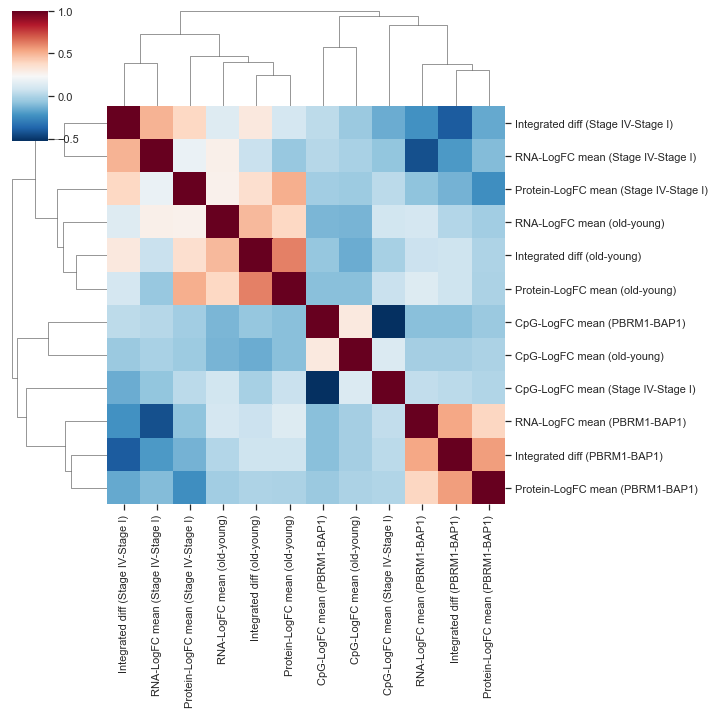

In [73]:
diff_df = vae_rcm_df[[c for c in vae_rcm_df if (' diff' in c or 'LogFC' in c) and ('Stage IV' in c or 'BAP1' in c or 'young' in c)]]
corr = diff_df.corr()
sns.clustermap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values, cmap='RdBu_r', row_cluster=True, col_cluster=True)
plt.savefig(f'{stats_fig_dir}{missing_method}_VAE_data_corr.svg', transparent=True)


## Check decoding of some of the top genes

MDS 0.007633587786259542
TPDS 0.0018552875695732839
TMDS 0.031133250311332503
MDE 0.0
TPDE 0.0
TMDE 0.009584664536741214
MDS_TMDE 0.032397408207343416
MDE_TMDS 0.0
TPDE_TMDS 0.0
TPDS_TMDE 0.0007042253521126761


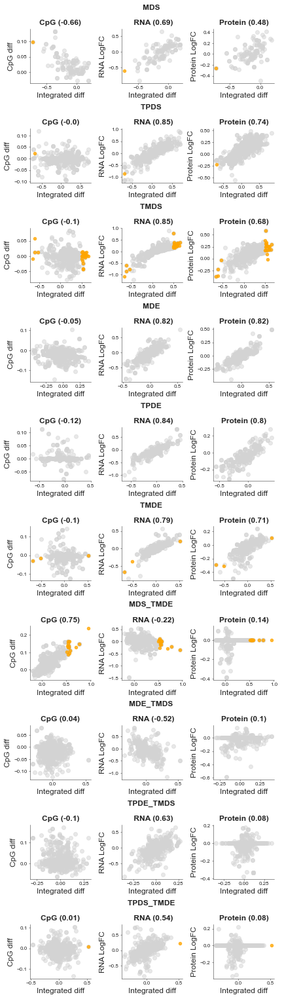

MDS 0.1450381679389313
TPDS 0.16883116883116883
TMDS 0.08468244084682441
MDE 0.1108433734939759
TPDE 0.2178988326848249
TMDE 0.1182108626198083
MDS_TMDE 0.04103671706263499
MDE_TMDS 0.026758409785932722
TPDE_TMDS 0.025257249766136577
TPDS_TMDE 0.03028169014084507


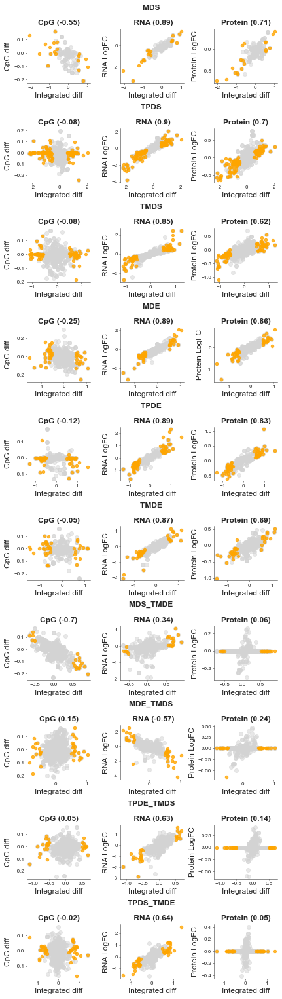

MDS 0.17557251908396945
TPDS 0.21150278293135436
TMDS 0.19676214196762143
MDE 0.08433734939759036
TPDE 0.20233463035019456
TMDE 0.16293929712460065
MDS_TMDE 0.14254859611231102
MDE_TMDS 0.06574923547400612
TPDE_TMDS 0.03648269410664172
TPDS_TMDE 0.05563380281690141


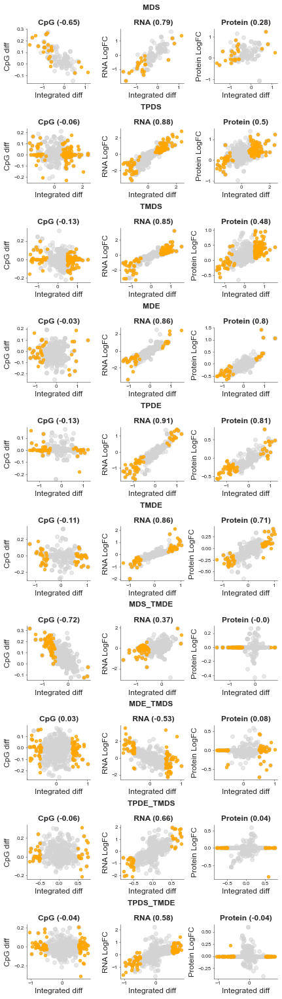

MDS 0.022900763358778626
TPDS 0.0055658627087198514
TMDS 0.04234122042341221
MDE 0.0
TPDE 0.019455252918287938
TMDE 0.019169329073482427
MDS_TMDE 0.03455723542116631
MDE_TMDS 0.0
TPDE_TMDS 0.0
TPDS_TMDE 0.0007042253521126761


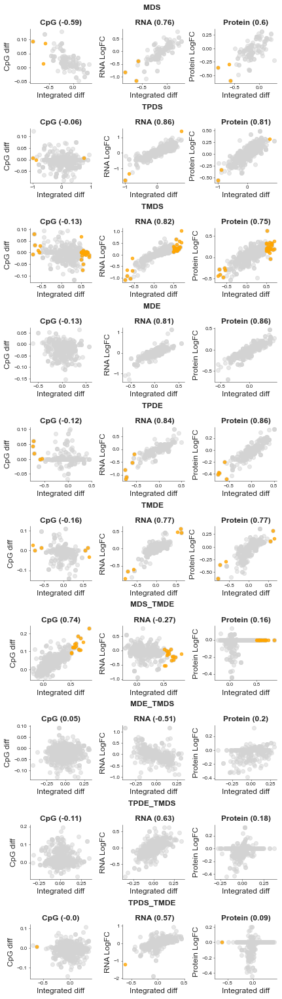

MDS 0.0
TPDS 0.0
TMDS 0.0186799501867995
MDE 0.0
TPDE 0.0038910505836575876
TMDE 0.009584664536741214
MDS_TMDE 0.0
MDE_TMDS 0.0
TPDE_TMDS 0.0
TPDS_TMDE 0.0


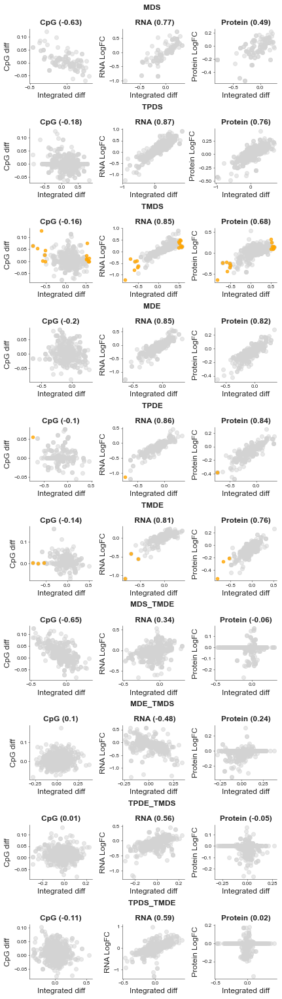

MDS 0.0
TPDS 0.0
TMDS 0.06351183063511831
MDE 0.10843373493975904
TPDE 0.019455252918287938
TMDE 0.0
MDS_TMDE 0.0
MDE_TMDS 0.0
TPDE_TMDS 0.0
TPDS_TMDE 0.0


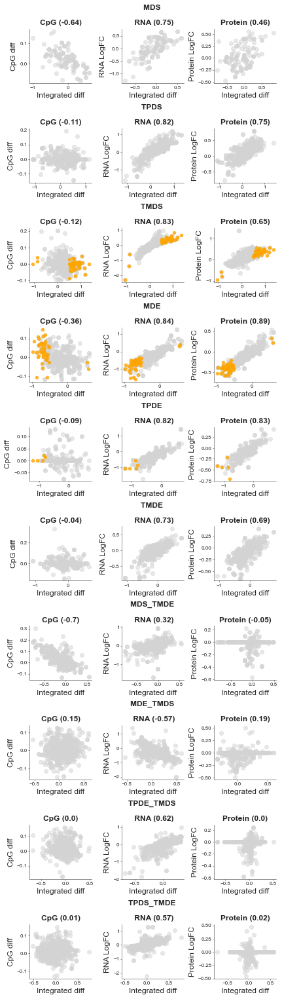

MDS 0.015267175572519083
TPDS 0.00927643784786642
TMDS 0.0012453300124533001
MDE 0.0
TPDE 0.0
TMDE 0.0
MDS_TMDE 0.0021598272138228943
MDE_TMDS 0.0
TPDE_TMDS 0.002806361085126286
TPDS_TMDE 0.0014084507042253522


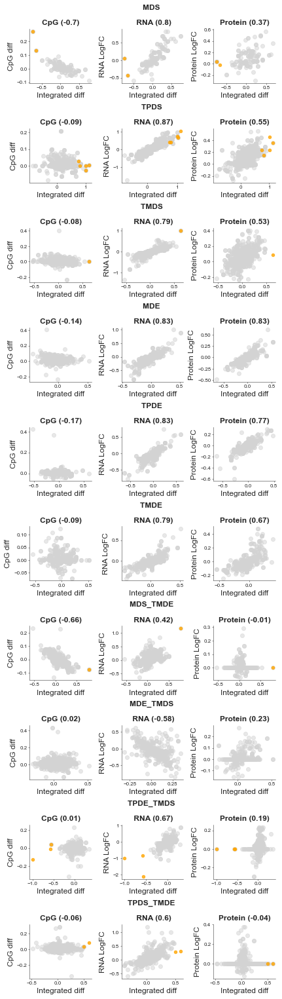

In [26]:
#from sciviso import Scatterplot
import matplotlib.pyplot as plt

rcm_labels = ["MDS", "TPDS", "TMDS", 
              "MDE", "TPDE", "TMDE", 
              "MDS_TMDE", "MDE_TMDS", "TPDE_TMDS", "TPDS_TMDE"]

p_cutoff = 0.05
comparisons = ['Late-Early', 'PBRM1-BAP1', 'Stage IV-Stage I', 'Stage III-Stage I', 
               'old-middle', 'old-young', 'Female-Male']

for comparison in comparisons:
    fig, axs = plt.subplots(10, 3, figsize=(6,21))
    vae_change = f'Integrated diff ({comparison})'
    vae_p = f'Integrated padj ({comparison})'

    protein_change = f'Protein-LogFC mean ({comparison})'
    rna_change = f'RNA-LogFC mean ({comparison})'
    cpg_change = f'CpG-LogFC mean ({comparison})'
    
    for fi, r in enumerate(rcm_labels):
        tmp_df = vae_rcm_df[vae_rcm_df['Regulation_Grouping_2'] == r]

        opts = {'title_font_weight': 'bold', "title_font_size":9, "label_font_size":7, "figsize": (6, 9), "s": 20}
        corr_c = round(np.corrcoef(tmp_df[vae_change], tmp_df[cpg_change])[0][1], 2)
        scatter = Scatterplot(tmp_df, vae_change, cpg_change,
                              title_font_weight="bold",
                              colour='orange', config=opts)
        grp_labels = ['Integrated']
        vae_sig = []
        vae_int_change = abs(tmp_df[vae_change].values)
        vae_cutoff = 0.5
        for i, vae_padj in enumerate(tmp_df[vae_p].values):
            if (vae_padj < p_cutoff and vae_int_change[i] > vae_cutoff):
                vae_sig.append(i)
        grp_idxs = [vae_sig]
        print(r, len(vae_sig)/len(tmp_df))
        
        ax = scatter.plot_groups_2D(axs[fi][0], grp_labels, grp_idxs, ['orange'])

        corr_r = round(np.corrcoef(tmp_df[vae_change], tmp_df[rna_change])[0][1], 2)
        scatter = Scatterplot(tmp_df, vae_change, rna_change,  colour='rebeccapurple',
                              xlabel='Integrated Rank (Stage 4 - Stage 1)',
                               config=opts)
        ax = scatter.plot_groups_2D(axs[fi][1], grp_labels, grp_idxs, ['orange', 'rebeccapurple', 'darkred'])

        corr_p = round(np.corrcoef(tmp_df[vae_change], tmp_df[protein_change])[0][1], 2)
        scatter = Scatterplot(tmp_df, vae_change, protein_change, colour='grey',
                             config=opts)
        ax = scatter.plot_groups_2D(axs[fi][2], grp_labels, grp_idxs, ['orange', 'rebeccapurple', 'darkred'])
        plt.tight_layout()

        axs[fi][0].set_title(f'CpG ({corr_c})', fontweight="bold")
        axs[fi][1].set_title(f'{r} \n \n RNA ({corr_r})',  fontweight="bold")
        axs[fi][2].set_title(f'Protein ({corr_p})', fontweight="bold")
        
        axs[fi][0].set(xlabel='Integrated diff', ylabel='CpG diff')
        axs[fi][1].set(xlabel='Integrated diff', ylabel='RNA LogFC')
        axs[fi][2].set(xlabel='Integrated diff', ylabel='Protein LogFC')

    plt.savefig(f'{stats_fig_dir}{missing_method}_VAE_data_corr_{comparison}_change.svg', transparent=True)
    plt.show()

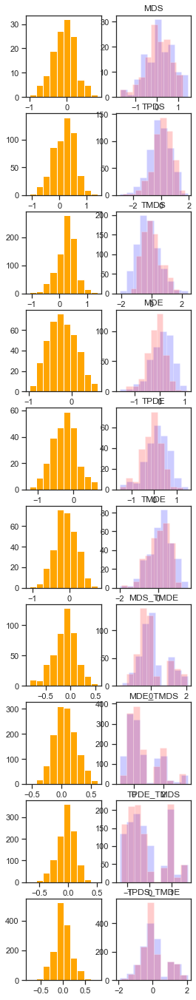

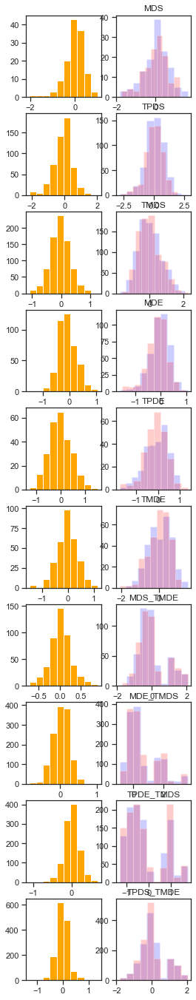

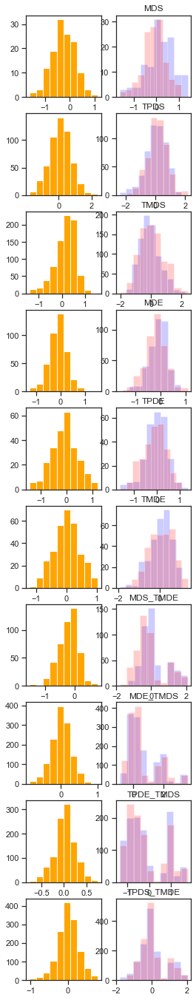

In [77]:
#from sciviso import Scatterplot
import matplotlib.pyplot as plt

rcm_labels = ["MDS", "TPDS", "TMDS", 
              "MDE", "TPDE", "TMDE", 
              "MDS_TMDE", "MDE_TMDS", "TPDE_TMDS", "TPDS_TMDE"]

p_cutoff = 0.05
comparisons = ['old-young', 'PBRM1-BAP1', 'Stage IV-Stage I',]

for comparison in comparisons:
    fig, axs = plt.subplots(10, 2, figsize=(4,24))
    cond0 = comparison.split('-')[1]
    cond1 =  comparison.split('-')[0]    
    vae_change = f'Integrated mean ({cond0})'

    for fi, r in enumerate(rcm_labels):
        tmp_df = vae_rcm_df[vae_rcm_df['Regulation_Grouping_2'] == r]

        axs[fi][0].hist(tmp_df[f'Integrated diff ({comparison})'], color='orange')

        axs[fi][1].hist(tmp_df[f'Integrated mean ({cond0})'], color='blue', alpha=0.2)
        axs[fi][1].hist(tmp_df[f'Integrated mean ({cond1})'], color='red', alpha=0.2)
        axs[fi][1].set_title(r)
#         axs[fi][0].set_title(f'Integrated diff ({comparison})', fontweight="bold")
#         axs[fi][1].set_title(f'Integrated means',  fontweight="bold")
    plt.savefig(f'{stats_fig_dir}{missing_method}_VAE_hists_{comparison}_change.svg', transparent=True)
    plt.show()

In [28]:
###############################################################################
#                                                                             #
#    This program is free software: you can redistribute it and/or modify     #
#    it under the terms of the GNU General Public License as published by     #
#    the Free Software Foundation, either version 3 of the License, or        #
#    (at your option) any later version.                                      #
#                                                                             #
#    This program is distributed in the hope that it will be useful,          #
#    but WITHOUT ANY WARRANTY; without even the implied warranty of           #
#    MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the            #
#    GNU General Public License for more details.                             #
#                                                                             #
#    You should have received a copy of the GNU General Public License        #
#    along with this program. If not, see <http://www.gnu.org/licenses/>.     #
#                                                                             #
###############################################################################

import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from matplotlib.patches import Patch

from sciviso import Vis


class Heatmap(Vis):

    def __init__(self, df: pd.DataFrame, chart_columns: list, row_index: str, title='', xlabel='', ylabel='',
                 cluster_rows=True, cluster_cols=True, row_colours=None, col_colours=None, vmin=None, vmax=None,
                 linewidths=0.5, x_tick_labels=1, y_tick_labels=1, rows_to_colour=None, cols_to_colour=None,
                 figsize=(3, 3), title_font_size=8, label_font_size=6, title_font_weight=700, cmap='RdBu_r',
                 annot=False, color_palettes=None,
                 config={}):
        super().__init__(df, figsize=figsize, title_font_size=title_font_size, label_font_size=label_font_size,
                         title_font_weight=title_font_weight)
        self.chart_columns = chart_columns
        self.row_index = row_index
        self.title = title
        self.cluster_rows = cluster_rows
        self.cluster_cols = cluster_cols
        self.col_colours = col_colours
        self.row_colours = row_colours
        self.rows_to_colour = rows_to_colour
        self.cols_to_colour = cols_to_colour
        self.vmin = vmin
        self.vmax = vmax
        self.xlabel = xlabel
        self.ylabel = ylabel
        self.cmap_str = cmap
        self.color_palettes = color_palettes if color_palettes else [
            'Purples', 'Blues', 'Greens', 'Oranges', 'Reds', 'YlOrBr',
            'Pastel1', 'Pastel2', 'Paired', 'Accent', 'Dark2',
                      'Set1', 'Set2', 'Set3', 'tab10', 'tab20', 'tab20b',
                      'tab20c']
        self.x_tick_labels = x_tick_labels
        self.y_tick_labels = y_tick_labels
        self.linewidths = linewidths
        self.annot = annot
        if config:
            self.load_style(config)

    def plot(self, ax=None, linecolor="none", row_linkage=None, col_linkage=None):
        self.check_args_in_columns([self.chart_columns, [self.row_index]])
        df_dists = pd.DataFrame(self.df[self.chart_columns].values)
        df_dists.columns = self.chart_columns
        df_dists.index = self.df[self.row_index].values
        # Check if the user has got row_colours defined
        if self.rows_to_colour:
            self.row_colours = []
            for i, rc in enumerate(self.rows_to_colour):
                labels = self.df[rc].values
                lut = dict(zip(set(labels), sns.color_palette(self.color_palettes[i], len(set(labels)))))
                self.row_colours.append(pd.DataFrame(labels)[0].map(lut))
        if ax:
            ax = sns.clustermap(df_dists, col_cluster=self.cluster_cols, figsize=self.figsize, row_cluster=self.cluster_rows,
                                col_colors=self.col_colours, ax=ax, annot=self.annot, 
                                row_linkage=row_linkage, 
                                col_linkage=col_linkage,
                                row_colors=self.row_colours, cmap=self.cmap_str, vmax=self.vmax, vmin=self.vmin,
                                yticklabels=self.y_tick_labels, xticklabels=self.x_tick_labels, linewidths=self.linewidths, linecolor=linecolor)
        else:
            ax = sns.clustermap(df_dists, col_cluster=self.cluster_cols, figsize=self.figsize, row_cluster=self.cluster_rows,
                                col_colors=self.col_colours, annot=self.annot,
                                row_colors=self.row_colours, cmap=self.cmap_str, vmax=self.vmax, vmin=self.vmin,
                                yticklabels=self.y_tick_labels, xticklabels=self.x_tick_labels,
                                linewidths=self.linewidths, row_linkage=row_linkage, col_linkage=col_linkage,
                                linecolor=linecolor)
        if self.rows_to_colour:
            for i, rc in enumerate(self.rows_to_colour):
                labels = self.df[rc].values
                lut = dict(zip(set(labels), sns.color_palette(self.color_palettes[i], len(set(labels)))))
                handles = [Patch(facecolor=lut[name]) for name in lut]
                legend = plt.legend(handles, lut, bbox_to_anchor=(2, i))
                plt.gca().add_artist(legend)

        plt.title(self.title)
        plt.setp(ax.ax_heatmap.yaxis.get_majorticklabels(), rotation=0)
        plt.setp(ax.ax_heatmap.xaxis.get_majorticklabels(), rotation=45, horizontalalignment='right')
        ax.ax_heatmap.tick_params(labelsize=self.label_font_size)
        self.add_labels(title=False, x=False)
        ax.fig.suptitle(self.title, fontsize=self.title_font_size, fontweight=self.title_font_weight)
        ax.ax_heatmap.set_xticklabels(ax.ax_heatmap.get_xmajorticklabels(), fontsize=self.label_font_size)
        self.set_ax_params(ax.ax_heatmap)
        plt.tight_layout()
        return ax

    def plot_hm(self, ax=None, linecolor="black"):
        self.check_args_in_columns([self.chart_columns, [self.row_index]])
        df_dists = pd.DataFrame(self.df[self.chart_columns].values)
        df_dists.columns = self.chart_columns
        df_dists.index = self.df[self.row_index].values
        if ax:
            ax = sns.heatmap(df_dists,
                             ax=ax, cmap=self.cmap_str, vmax=self.vmax, vmin=self.vmin, annot=self.annot,
                             yticklabels=self.y_tick_labels, xticklabels=self.x_tick_labels, linewidths=self.linewidths,
                             linecolor=linecolor)
        else:
            ax = sns.heatmap(df_dists, cmap=self.cmap_str, vmax=self.vmax, vmin=self.vmin, annot=self.annot,
                             yticklabels=self.y_tick_labels, xticklabels=self.x_tick_labels, linewidths=self.linewidths,
                             linecolor=linecolor)
        plt.title(self.title)
        plt.setp(ax.yaxis.get_majorticklabels(), rotation=0)
        plt.setp(ax.xaxis.get_majorticklabels(), rotation=45, horizontalalignment='right')
        ax.tick_params(labelsize=self.label_font_size)
        self.add_labels(title=False, x=False)
        ax.set_xticklabels(ax.get_xmajorticklabels(), fontsize=self.label_font_size)
        self.set_ax_params(ax)
        plt.tight_layout()
        #plt.colorbar(ax=ax, shrink=0.3, aspect=3, orientation='horizontal')
        return ax
    

In [29]:
r_df = pd.read_csv(f'{stats_output_dir}{label}_Integrated_comparison_{cond1}-{cond0}.csv')



In [30]:
vae_rcm_df

,external_gene_name,entrezgene_id,Locus,hgnc_symbol,logFC_rna,padj_rna,CpG_Beta_diff,padj_meth,logFC_protein,padj_protein,...,Protein-LogFC mean (old-young),RNA-LogFC mean (old-young),CpG-LogFC mean (old-young),Integrated padj (Female-Male),Integrated diff (Female-Male),Integrated mean (Male),Integrated mean (Female),Protein-LogFC mean (Female-Male),RNA-LogFC mean (Female-Male),CpG-LogFC mean (Female-Male)
ensembl_gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000000005,TNMD,64102.0,cg16822540,TNMD,-1.224928,2.276478e-09,-0.322769,1.575338e-36,0.000000,1.000000e+00,...,0.000000,-0.558462,-0.133026,0.463720,0.105651,0.005949,0.111601,0.000000,0.120487,-0.152069
ENSG00000000938,FGR,2268.0,0,FGR,1.984350,1.620127e-98,0.000000,1.000000e+00,0.326527,5.511046e-14,...,0.045891,-0.317557,0.000000,0.470723,-0.028158,0.901313,0.873154,0.061025,-0.179993,0.000000
ENSG00000001167,NFYA,4800.0,cg16660580,NFYA,-0.228845,7.971423e-07,-0.026388,1.277784e-19,0.524762,2.431365e-17,...,-0.202162,-0.054657,-0.003458,0.318549,0.230209,-0.742055,-0.511846,0.026823,0.139717,0.003183
ENSG00000001617,SEMA3F,6405.0,0,SEMA3F,1.317463,3.471530e-76,0.000000,1.000000e+00,0.187468,1.256642e-05,...,-0.020589,-0.115469,0.000000,0.188800,0.111518,0.779073,0.890591,0.072812,-0.003989,0.000000
ENSG00000001626,CFTR,1080.0,cg09626894,CFTR,-1.105423,7.692399e-11,0.186895,1.498899e-47,0.611619,1.886151e-14,...,-0.251037,-0.246357,0.141536,0.374305,0.140784,-0.938233,-0.797450,-0.029347,0.379939,0.010262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000278154,0,3903.0,cg22545168,0,0.000000,1.000000e+00,-0.249119,1.139732e-63,1.104333,6.161029e-65,...,-0.235663,0.000000,-0.026416,0.479839,0.002119,-0.359678,-0.357559,0.024274,0.000000,0.018196
ENSG00000278183,0,4363.0,cg04730825,0,0.000000,1.000000e+00,0.074314,8.973349e-20,0.646886,8.156383e-53,...,-0.088021,0.000000,-0.061919,0.470547,0.017177,-0.402991,-0.385814,0.018908,0.000000,-0.002520
ENSG00000279514,0,219428.0,cg22665383,0,0.000000,1.000000e+00,-0.145442,2.446651e-27,-1.377957,4.902472e-44,...,0.547749,0.000000,0.005716,0.475971,0.070811,0.977070,1.047880,0.229402,0.000000,0.047040


In [31]:
label


'mean'

In [32]:
# get the gene ids that we're interested in visualising
#from sciviso import Heatmap
import scipy.spatial as sp, scipy.cluster.hierarchy as hc
r = 'MDS'
cond1 = 'Stage IV'
cond0 = 'Stage I'

comparison = f'{cond1}-{cond0}'
vae_diff = f'Integrated diff ({comparison})'
vae_padj = f'Integrated padj ({comparison})'

protein_change = f'Protein-LogFC mean ({comparison})'
rna_change = f'RNA-LogFC mean ({comparison})'
cpg_change = f'CpG-LogFC mean ({comparison})'
    
# Read in the precomputed encoding and decoding dfs
decoding_df = sv.get_decoding(r)
training_df = sv.vae_input_df[r] # Get the input DF

r_df = pd.read_csv(f'{stats_output_dir}{label}_Integrated_comparison_{cond1}-{cond0}.csv')
r_df = r_df[r_df['Regulation_Grouping_2'] == r]

training_df
# Get the highest 5 pvalues as a control
worst_gene_ids = r_df.nlargest(10, vae_padj)['id'].values
row_colours = ['black'] * len(worst_gene_ids)

# Get the nlargest and nsmallest values from the integrated value
r_df = r_df[r_df[vae_padj] <= 0.05]
# Get the top and bottom
r_df = r_df[abs(r_df[vae_diff]) > 0.5]

top_gene_ids = list(r_df[r_df[vae_diff] > 0]['id'].values)
top_gene_ids += list(r_df[r_df[vae_diff] < 0]['id'].values)
gene_colour = {}
for g in list(r_df[r_df[vae_diff] < 0]['id'].values):
    gene_colour[g] = 'purple'
    
for g in list(r_df[r_df[vae_diff] > 0]['id'].values):
    gene_colour[g] = 'yellow'
    
for g in worst_gene_ids:
    gene_colour[g] = 'white'
    
top_gene_ids += list(worst_gene_ids)
# Now we want to plot the top and bottom genes
# Plot genes from both
# Get top genes by encoding
feature_columns = ['Protein', 'RNA', 'CpG'] 
training_df = training_df.join(vae_rcm_df, how='left', lsuffix='_', rsuffix='_r')
plot_df = training_df[training_df.index.isin(top_gene_ids)]  
decoding_df.set_index('id', inplace=True)
# Do the same for decoding
decoding_df = decoding_df.join(vae_rcm_df, how='left', lsuffix='_', rsuffix='_r')
plot_dec_df = decoding_df[decoding_df.index.isin(top_gene_ids)]  

row_colours = []
for g in plot_dec_df.index.values:
    row_colours.append(gene_colour.get(g))
    
fig_size = (8, 10)
vis_opts = {"figsize": fig_size, "title_font_size": 12, "axis_font_size": 10}



In [33]:
cond0_cases = list(patient_info[patient_info['TumorStage'] == cond0]['SafeCases'].values)
cond1_cases = list(patient_info[patient_info['TumorStage'] == cond1]['SafeCases'].values)


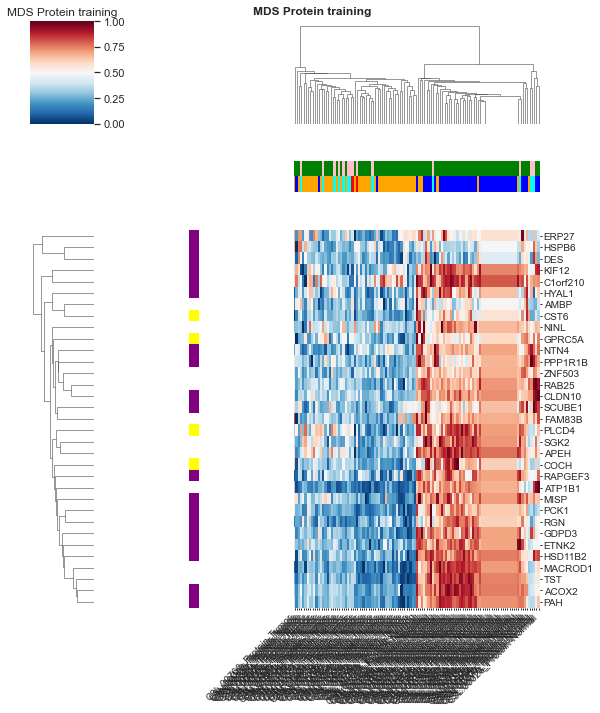

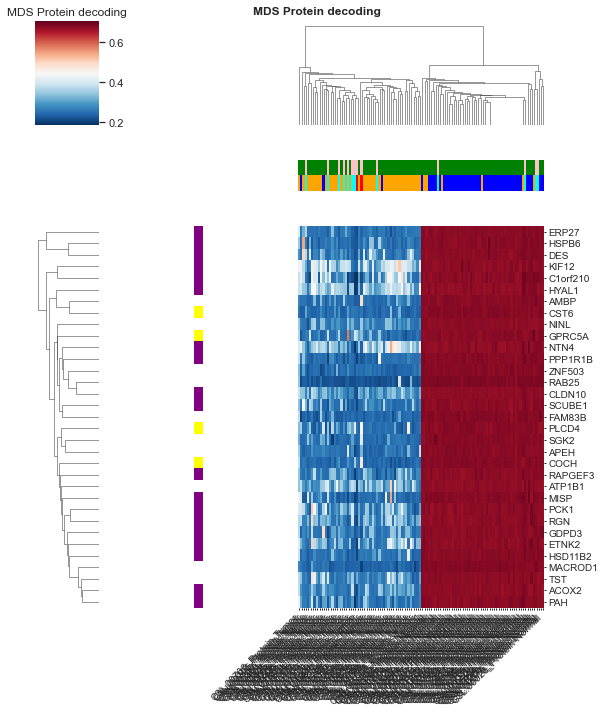

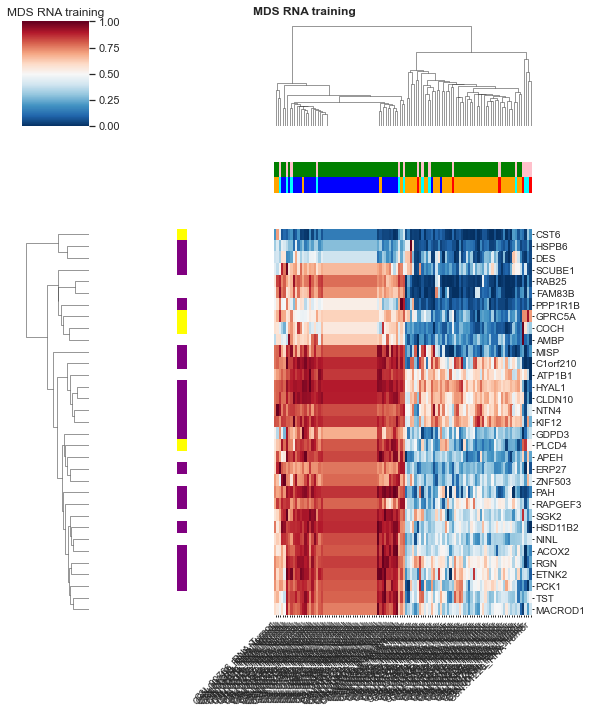

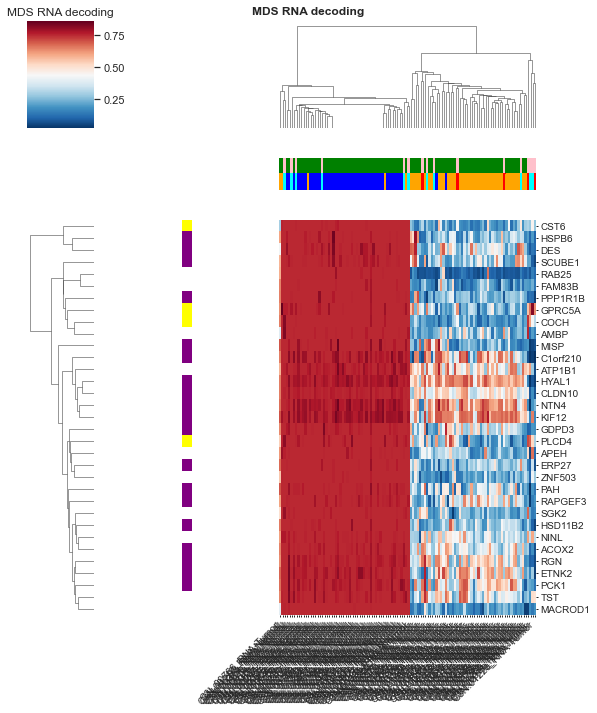

CpG


In [34]:

# get the genes that chanegd the mosy between
for f in feature_columns:
    try:
        s1_f_cols = [c for c in training_df.columns if f in c and 'Normal' in c and c.split('_')[0] in cond0_cases]
        s4_f_cols = [c for c in training_df.columns if f in c and 'Normal' in c and c.split('_')[0] in cond1_cases]

        s1_f_cols_t = [c for c in training_df.columns if f in c and 'Tumor' in c and c.split('_')[0] in cond0_cases]
        s4_f_cols_t = [c for c in training_df.columns if f in c and 'Tumor' in c and c.split('_')[0] in cond1_cases]

        column_colours_TN = ['blue'] * len(s1_f_cols) + ['orange'] * len(s1_f_cols_t) + ['cyan'] * len(s4_f_cols) + ['red'] * len(s4_f_cols_t)

        s1_f_cols = s1_f_cols + s1_f_cols_t
        s4_f_cols = s4_f_cols + s4_f_cols_t

        train_columns = s1_f_cols + s4_f_cols
        train_columns = [c for c in train_columns if c in plot_dec_df.columns]
        column_colours = ['green'] * len(s1_f_cols) + ['pink'] * len(s4_f_cols)
        # Combine the two dfs 
        # Pre compute the distance 
        vals = plot_df[train_columns]
        if len(vals) > 0:
            row_linkage, col_linkage = (hc.linkage(sp.distance.pdist(x), method='average')
                for x in (vals.values, vals.values.T))

            hm = Heatmap(plot_df, row_index='hgnc_symbol', 
                         chart_columns=train_columns, #cluster_cols=False, cluster_rows=False,
                         col_colours=[column_colours, column_colours_TN], row_colours=[row_colours],
                        config=vis_opts, title=f'{r} {f} training')
            hm.axis_line_width = 1.0
            hm.plot(row_linkage=row_linkage, col_linkage=col_linkage)
            plt.show()



            hm = Heatmap(plot_dec_df, row_index='hgnc_symbol', 
                         col_colours=[column_colours, column_colours_TN],  row_colours=[row_colours],
                         chart_columns=train_columns, #cluster_cols=False,cluster_rows=False,
                        config=vis_opts, title=f'{r} {f} decoding')
            hm.axis_line_width = 1.0
            hm.plot(row_linkage=row_linkage, col_linkage=col_linkage)
            plt.show()
    except:
        print(f)

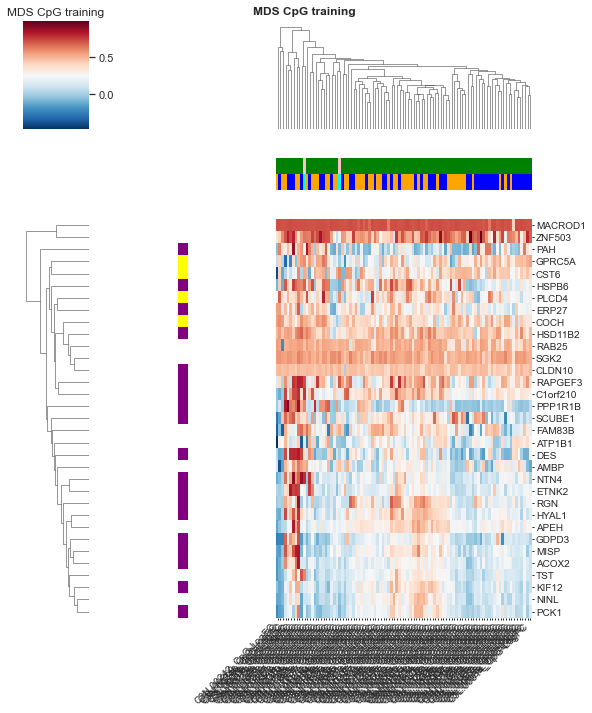

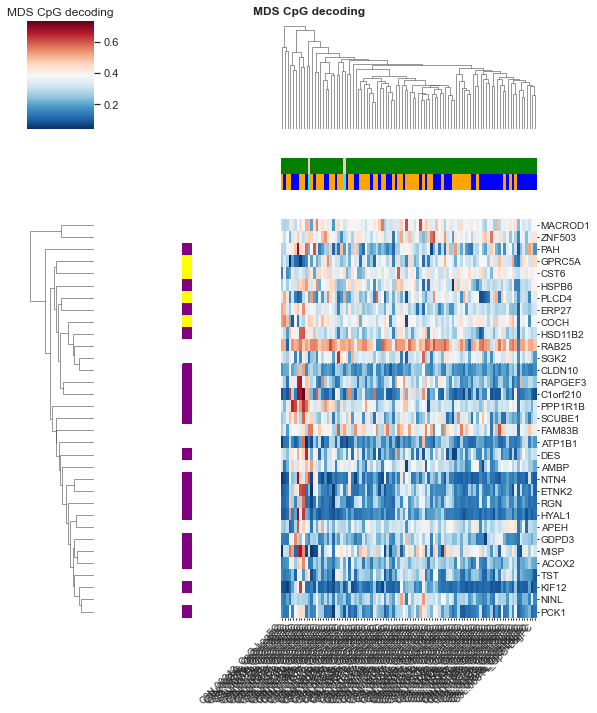

In [35]:
f = 'CpG'

train_columns = [c for c in training_df.columns if '_CpG-LogFC' in c] #s1_f_cols + s4_f_cols
train_columns = [c for c in train_columns if c in plot_dec_df.columns]
# Combine the two dfs 
# Pre compute the distance 
vals = plot_df[train_columns]
if len(vals) > 0:
    row_linkage, col_linkage = (hc.linkage(sp.distance.pdist(x), method='average')
        for x in (vals.values, vals.values.T))

    hm = Heatmap(plot_df, row_index='hgnc_symbol', 
                 chart_columns=train_columns, #cluster_cols=False, cluster_rows=False,
                 col_colours=[column_colours, column_colours_TN], row_colours=[row_colours],
                config=vis_opts, title=f'{r} {f} training')
    hm.axis_line_width = 1.0
    hm.plot(row_linkage=row_linkage, col_linkage=col_linkage)
    plt.show()



    hm = Heatmap(plot_dec_df, row_index='hgnc_symbol', 
                 col_colours=[column_colours, column_colours_TN],  row_colours=[row_colours],
                 chart_columns=train_columns, #cluster_cols=False,cluster_rows=False,
                config=vis_opts, title=f'{r} {f} decoding')
    hm.axis_line_width = 1.0
    hm.plot(row_linkage=row_linkage, col_linkage=col_linkage)
    plt.show()

In [52]:
? object


# Plot some of the top genes in each group and colour by the 

In [36]:
# Want to also plot the RNA, protein between S1 and S4 and also the protein from the new dataset


###############################################################################
#                                                                             #
#    This program is free software: you can redistribute it and/or modify     #
#    it under the terms of the GNU General Public License as published by     #
#    the Free Software Foundation, either version 3 of the License, or        #
#    (at your option) any later version.                                      #
#                                                                             #
#    This program is distributed in the hope that it will be useful,          #
#    but WITHOUT ANY WARRANTY; without even the implied warranty of           #
#    MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the            #
#    GNU General Public License for more details.                             #
#                                                                             #
#    You should have received a copy of the GNU General Public License        #
#    along with this program. If not, see <http://www.gnu.org/licenses/>.     #
#                                                                             #
###############################################################################
from collections import defaultdict
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from statannot import add_stat_annotation

from sciviso import Vis


class Boxplot(Vis):
    """
    Box plot. Adds stat annotations and returns the SVG or saves it to disk.
    for stats annotations details see: https://github.com/webermarcolivier/statannot
    """
    def __init__(self, df: pd.DataFrame, x: object, y: object, title='', xlabel='', ylabel='', box_colors=None,
                 hue=None, order=None, hue_order=None, showfliers=False, add_dots=False, add_stats=True,
                 stat_method='Mann-Whitney', box_pairs=None, figsize=(3, 3), title_font_size=12, label_font_size=8,
                 title_font_weight=700, config=None):
        super().__init__(df, figsize=figsize, title_font_size=title_font_size, label_font_size=label_font_size,
                         title_font_weight=title_font_weight)
        self.df = df
        self.x = x
        self.y = y
        self.title = title
        self.hue = hue
        self.order = order
        self.hue_order = hue_order
        self.showfliers = showfliers
        self.add_dots = add_dots
        self.add_stats = add_stats
        self.stat_method = stat_method
        self.box_pairs = box_pairs
        self.label = 'boxplot'
        self.xlabel = xlabel
        self.ylabel = ylabel
        self.box_colors = box_colors
        if config:
            self.load_style(config)

    def format_data_for_boxplot(self, df: pd.DataFrame, conditions: list, filter_column=None, filter_values=None):
        condition_dict = defaultdict(list)
        for column in df.columns:
            for c in conditions:
                if c in column:
                    condition_dict[c].append(column)

        # Now lets get the values
        values = []
        condition = []
        samples = []
        if filter_column is None or filter_values is None:
            for i in range(0, len(df)):
                for cond, columns in condition_dict.items():
                    for c in columns:
                        values.append(df[c].values[i])
                        condition.append(cond)
                        samples.append(c)
        else:
            i = 0
            for v in df[filter_column].values:
                if v in filter_values:
                    for cond, columns in condition_dict.items():
                        for c in columns:
                            values.append(df[c].values[i])
                            condition.append(cond)
                            samples.append(c)
                i += 1
        box_df = pd.DataFrame()
        box_df['Samples'] = samples
        box_df['Values'] = values
        box_df['Conditions'] = condition
        return box_df

    def plot(self, ax=None, legend=True):
        x, y, hue_order, order, hue, box_pairs = self.x, self.y, self.hue_order, self.order, self.hue, self.box_pairs
        # First lets check whether we were passed lists or strings for our y and x arrays
        if not isinstance(x, str) and not isinstance(y, str):
            vis_df = pd.DataFrame()
            vis_df['x'] = x
            vis_df['y'] = y
            x = 'x'
            y = 'y'
            if hue is not None:
                vis_df['colour'] = hue
                hue = 'colour'
            if order is None:
                order = list(set(vis_df['x'].values))
                order.sort()
        else:
            vis_df = self.df

        # set the orders
        if hue_order is None and hue is not None:
            hue_order = list(set(vis_df[hue].values))
            hue_order.sort()
        if order is None:
            order = list(set(vis_df[x].values))
            order.sort()

        ax = sns.boxplot(data=vis_df, x=x, y=y, hue=hue, hue_order=hue_order, order=order, palette=self.palette,
                         showfliers=self.showfliers, ax=ax)
        if self.add_dots:
            ax = sns.swarmplot(data=vis_df, x=x, y=y, hue_order=hue_order, 
                               order=order, hue=hue, dodge=True, alpha=0.3,  ax=ax, palette=['black', 'black'])
            
        if self.add_stats:
            # Add all pairs in the order if the box pairs is none
            if box_pairs is None:
                pairs = []
                box_pairs = []
                for i in order:
                    for j in order:
                        if i != j:
                            # Ensure we don't get duplicates
                            pair = f'{i}{j}' if i < j else f'{j}{i}'
                            if pair not in pairs:
                                box_pairs.append((i, j))
                                pairs.append(pair)
            # Add stats annotation
            add_stat_annotation(ax, data=vis_df, x=x, y=y, order=order,
                                box_pairs=box_pairs,
                                test=self.stat_method, text_format='star', loc='inside', verbose=2)

        ax.set_xticklabels(ax.get_xticklabels(), rotation=45, horizontalalignment='right', weight = 'bold')

        # Check if the user supplied a list of colours for the boxes:
        if self.box_colors is not None:
            for i, b in enumerate(ax.artists):
                b.set_facecolor(self.box_colors[i])

        if legend and not self.box_colors:
            plt.legend(bbox_to_anchor=(1.05, 1), borderaxespad=0.,  fontsize=self.label_font_size)
        elif legend and self.box_colors:
            plt.legend(order, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
                       fontsize=self.label_font_size)

        if legend == False:
            ax.legend([],[], frameon=False)
        ax.tick_params(labelsize=self.label_font_size)
        self.add_labels(ax)
        ax.title.set_text(self.title)
        self.set_ax_params(ax)
        plt.tight_layout()
        return ax
    
    def add_labels(self, ax, title=True, x=True, y=True):
        if x:
            ax.set(xlabel=self.xlabel)
        if y:
            ax.set(ylabel=self.ylabel)
        if title:
            ax.title.set_text(self.title)
            

In [54]:
vae_rcm_df


,external_gene_name,entrezgene_id,Locus,hgnc_symbol,logFC_rna,padj_rna,CpG_Beta_diff,padj_meth,logFC_protein,padj_protein,...,Protein-LogFC mean (old-young),RNA-LogFC mean (old-young),CpG-LogFC mean (old-young),Integrated padj (Female-Male),Integrated diff (Female-Male),Integrated mean (Male),Integrated mean (Female),Protein-LogFC mean (Female-Male),RNA-LogFC mean (Female-Male),CpG-LogFC mean (Female-Male)
ensembl_gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000000005,TNMD,64102.0,cg16822540,TNMD,-1.224928,2.276478e-09,-0.322769,1.575338e-36,0.000000,1.000000e+00,...,0.000000,-0.558462,-0.133026,0.463720,0.105651,0.005949,0.111601,0.000000,0.120487,-0.152069
ENSG00000000938,FGR,2268.0,0,FGR,1.984350,1.620127e-98,0.000000,1.000000e+00,0.326527,5.511046e-14,...,0.045891,-0.317557,0.000000,0.470723,-0.028158,0.901313,0.873154,0.061025,-0.179993,0.000000
ENSG00000001167,NFYA,4800.0,cg16660580,NFYA,-0.228845,7.971423e-07,-0.026388,1.277784e-19,0.524762,2.431365e-17,...,-0.202162,-0.054657,-0.003458,0.318549,0.230209,-0.742055,-0.511846,0.026823,0.139717,0.003183
ENSG00000001617,SEMA3F,6405.0,0,SEMA3F,1.317463,3.471530e-76,0.000000,1.000000e+00,0.187468,1.256642e-05,...,-0.020589,-0.115469,0.000000,0.188800,0.111518,0.779073,0.890591,0.072812,-0.003989,0.000000
ENSG00000001626,CFTR,1080.0,cg09626894,CFTR,-1.105423,7.692399e-11,0.186895,1.498899e-47,0.611619,1.886151e-14,...,-0.251037,-0.246357,0.141536,0.374305,0.140784,-0.938233,-0.797450,-0.029347,0.379939,0.010262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000278154,0,3903.0,cg22545168,0,0.000000,1.000000e+00,-0.249119,1.139732e-63,1.104333,6.161029e-65,...,-0.235663,0.000000,-0.026416,0.479839,0.002119,-0.359678,-0.357559,0.024274,0.000000,0.018196
ENSG00000278183,0,4363.0,cg04730825,0,0.000000,1.000000e+00,0.074314,8.973349e-20,0.646886,8.156383e-53,...,-0.088021,0.000000,-0.061919,0.470547,0.017177,-0.402991,-0.385814,0.018908,0.000000,-0.002520
ENSG00000279514,0,219428.0,cg22665383,0,0.000000,1.000000e+00,-0.145442,2.446651e-27,-1.377957,4.902472e-44,...,0.547749,0.000000,0.005716,0.475971,0.070811,0.977070,1.047880,0.229402,0.000000,0.047040


In [37]:
ens_to_gene = dict(zip(vae_rcm_df.index.values, vae_rcm_df['external_gene_name'].values))

## Do some scatter plots to show the correlations

In [38]:
values = defaultdict(lambda: defaultdict(list))
for r in rcm_labels:
    encoding_df = sv.encoded_df[r]
    input_df = sv.raw_input_df[r] # Get the input DF
    # Make a df for each of the data types we want box plots for 
    for column in input_df.columns:
        if 'C' in column:
            c = column.split('_')
            values[c[1]]['values'] += [v for v in input_df[column].values]
            values[c[1]]['GeneId'] += [v for v in input_df.index.values]
            values[c[1]]['Cluster'] += [v for v in input_df['Regulation_Grouping_2'].values]
            case_info = patient_info[patient_info['SafeCases'] == c[0]]
            # Stage	BAP1&PBRM1 gender	TumorStage	AgeGrouped
            values[c[1]]['Gender'] += [case_info['gender'].values[0]] * len(input_df)
            values[c[1]]['Stage'] += [case_info['Stage'].values[0]] * len(input_df)
            values[c[1]]['Tumor Stage'] += [case_info['TumorStage'].values[0]] * len(input_df)
            values[c[1]]['Age'] += [case_info['AgeGrouped'].values[0]] * len(input_df)
            values[c[1]]['Mutation'] += [case_info['BAP1&PBRM1'].values[0]] * len(input_df)
            
    # Now we also want an encoding values 
    for column in encoding_df.columns:
        if 'C' in column:
            values['Integrated']['values'] += [c for c in encoding_df[column].values]
            values['Integrated']['GeneId'] += [c for c in encoding_df['id'].values]
            values['Integrated']['Cluster'] += [v for v in encoding_df['Regulation_Grouping_2'].values]
            case_info = patient_info[patient_info['SafeCases'] == column]

            values['Integrated']['Gender'] += [case_info['gender'].values[0]] * len(encoding_df)
            values['Integrated']['Stage'] += [case_info['Stage'].values[0]] * len(encoding_df)
            values['Integrated']['Tumor Stage'] += [case_info['TumorStage'].values[0]] * len(encoding_df)
            values['Integrated']['Age'] += [case_info['AgeGrouped'].values[0]] * len(encoding_df)
            values['Integrated']['Mutation'] += [case_info['BAP1&PBRM1'].values[0]] * len(encoding_df)

In [39]:
dfs = {}
for v in values:
    print(v)
    box_df = pd.DataFrame()
    for c in values[v]:
        box_df[c] = values[v][c]
    dfs[v] = box_df

Protein-Normal
Protein-Tumor
Protein-LogFC
RNA-Normal
RNA-Tumor
RNA-LogFC
CpG-Normal
CpG-Tumor
CpG-LogFC
Integrated


In [53]:
for d in dfs:
    dfs[d].to_csv(f'{stats_base_dir}output_data/{d}.csv', index=False)

In [30]:
import os 
dfs = {}
files = os.listdir(f'{stats_base_dir}output_data/')
for f in files:
    if 'csv' in f:
        d = f.replace('.csv', '')
        dfs[d] = pd.read_csv(f'{stats_base_dir}output_data/{f}')

In [37]:
# Now we can iterate through each one and do whatever we need to do
plt.rcParams["figure.figsize"] = (12, 3)
plt.rcParams['svg.fonttype'] = 'none' 
import os

fig_size = (12, 3)
vis_opts = {"figsize": fig_size, "title_font_size": 12, "axis_font_size": 10, 
           'palette': ['lightgrey', 'dimgrey']}

def plot_gene_logfcs(gene, cond0, cond1, x="Stage", cmap="Purples"):
    fig, ax = plt.subplots(nrows=1, ncols=5)
    gene_name = ens_to_gene.get(gene)
    box_data_df = dfs['Integrated']
    #try:
    
    box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
    gene_data = box_data_df[box_data_df['GeneId'] == gene]
    b = Boxplot(gene_data, x=x, y="values",  add_dots=True, 
            add_stats=True, title=f'Integrated diff.',
            xlabel="Sample", ylabel=f'diff. {cond1}-{cond0}', config=vis_opts)
    b.plot(ax=ax[0], legend=False)
    #nt('Integrated')
    
    box_data_df = dfs['Protein-LogFC']
    try:
        box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
        gene_data = box_data_df[box_data_df['GeneId'] == gene]
        b = Boxplot(gene_data, x=x, y="values", add_dots=True, 
                add_stats=True, title=f'Protein logFC',
                xlabel="Sample", ylabel=f"Protein  {cond1}-{cond0}", config=vis_opts)
        b.plot(ax=ax[1])
    except:
        print('Protein logFC')
        
    box_data_df = dfs['Protein-Tumor']
    try:
        box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
        gene_data = box_data_df[box_data_df['GeneId'] == gene]
        b = Boxplot(gene_data, x=x, y="values", add_dots=True, 
                add_stats=True, title=f'Protein Tumor',
                xlabel="Sample", ylabel=f"Protein  {cond1}-{cond0}", config=vis_opts)
        b.plot(ax=ax[2])
    except:
        print('Protein')
        
    box_data_df = dfs['RNA-LogFC']
    try:
        box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
        gene_data = box_data_df[box_data_df['GeneId'] == gene]
        b = Boxplot(gene_data, x=x, y="values", add_dots=True, 
                add_stats=True, title=f'RNA logFC',
                xlabel="Sample", ylabel=f"RNA {cond1}-{cond0}", config=vis_opts)
        b.plot(ax=ax[3])
    except:
        print('RNA')
    box_data_df = dfs['CpG-LogFC']
    try:
        box_data_df = box_data_df[box_data_df[x].isin([cond0, cond1])]
        gene_data = box_data_df[box_data_df['GeneId'] == gene]
        
        b = Boxplot(gene_data, x=x, y="values", add_dots=True, 
                add_stats=True, title=f'CpG logFC',
                xlabel="Sample", ylabel=f"CpG {cond1}-{cond0}", config=vis_opts)
        b.plot(ax=ax[4])
    except:
        print('CpG')
    # ALso print the URL so that I can quickly check the ones that look good in protein atlas
    print(f'https://www.proteinatlas.org/{gene}-{gene_name}/pathology/renal+cancer/KIRC')
    fig.suptitle(f'{gene_name} ({cond1}-{cond0})', fontsize=16, fontweight='bold')
    fig.tight_layout()
    fig.subplots_adjust(top=0.8)
    plt.savefig(f'{stats_base_dir}output_data/figures/boxplot_{gene_name}_{cond1}-{cond0}.svg')
    plt.show()

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.200e-03 U_stat=1.472e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.810e-03 U_stat=1.757e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.405e-01 U_stat=1.466e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.873e-04 U_stat=1.590e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.806e-02 U_stat=1.533e+03
https://www.proteinatlas.org/ENSG00000100644-HIF1A/pathology/renal+cancer/KIRC


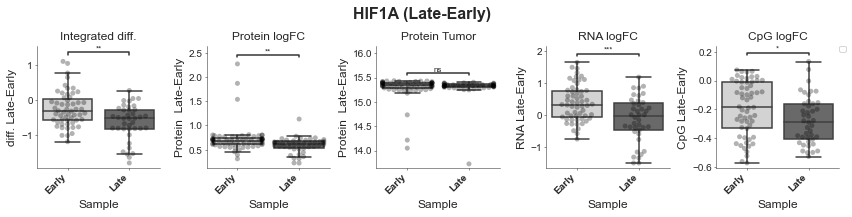

In [41]:
gene_to_ens = dict(zip(vae_rcm_df['external_gene_name'].values, vae_rcm_df.index.values))
for gene_name in ['HIF1A']:
    plot_gene_logfcs(gene_to_ens[gene_name], 'Early', 'Late')

In [33]:
run_label = 'PBRM1-BAP1'
vae_rcm_df = pd.read_csv(f'{stats_base_dir}output_data/comparisons/mean_Integrated_comparison_{run_label}.csv')


In [24]:
box_data_df = dfs['Integrated']
box_data_df

,values,GeneId,Cluster,Gender,Stage,Tumor Stage,Age,Mutation
0,-0.597920,ENSG00000004776,MDS,Male,Late,Stage III,old,PBRM1
1,1.132301,ENSG00000005108,MDS,Male,Late,Stage III,old,PBRM1
2,1.208065,ENSG00000005882,MDS,Male,Late,Stage III,old,PBRM1
3,-0.439438,ENSG00000007923,MDS,Male,Late,Stage III,old,PBRM1
4,-1.317337,ENSG00000013588,MDS,Male,Late,Stage III,old,PBRM1
...,...,...,...,...,...,...,...,...
631487,0.202064,ENSG00000272736,TPDS_TMDE,Male,Early,Stage I,middle,NaN
631488,-0.858755,ENSG00000272904,TPDS_TMDE,Male,Early,Stage I,middle,NaN
631489,-1.981325,ENSG00000273154,TPDS_TMDE,Male,Early,Stage I,middle,NaN
631490,-0.003348,ENSG00000273259,TPDS_TMDE,Male,Early,Stage I,middle,NaN


{'TNMD': 'ENSG00000000005',
 'KLHL13': 'ENSG00000003096',
 'SLC4A1': 'ENSG00000004939',
 'PRSS22': 'ENSG00000005001',
 'ABCC8': 'ENSG00000006071',
 'MAP3K9': 'ENSG00000006432',
 'UPP2': 'ENSG00000007001',
 'BAIAP3': 'ENSG00000007516',
 'DLEC1': 'ENSG00000008226',
 'SEMA3G': 'ENSG00000010319',
 'SYT7': 'ENSG00000011347',
 'CLDN11': 'ENSG00000013297',
 'SNAI2': 'ENSG00000019549',
 'NLRP2': 'ENSG00000022556',
 'GRAMD1B': 'ENSG00000023171',
 'ALAS1': 'ENSG00000023330',
 'INSRR': 'ENSG00000027644',
 'STAP1': 'ENSG00000035720',
 'MYOM2': 'ENSG00000036448',
 'MYO16': 'ENSG00000041515',
 'XK': 'ENSG00000047597',
 'FAM184B': 'ENSG00000047662',
 'ROS1': 'ENSG00000047936',
 'LMO3': 'ENSG00000048540',
 'COL9A2': 'ENSG00000049089',
 'SLC4A8': 'ENSG00000050438',
 'FSTL4': 'ENSG00000053108',
 'AP5M1': 'ENSG00000053770',
 'FOXC1': 'ENSG00000054598',
 'IL17RB': 'ENSG00000056736',
 'RASGRF1': 'ENSG00000058335',
 'CAMK2B': 'ENSG00000058404',
 'WNK1': 'ENSG00000060237',
 'RIMBP2': 'ENSG00000060709',
 'DGA

NameError: name 'plotting_gene_map_cell' is not defined

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.311e-04 U_stat=7.700e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.158e-01 U_stat=1.840e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.082e-02 U_stat=1.490e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.956e-04 U_stat=7.900e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.850e-02 U_stat=3.250e+02
https://www.proteinatlas.org/ENSG00000102755-FLT1/pathology/renal+cancer/KIRC


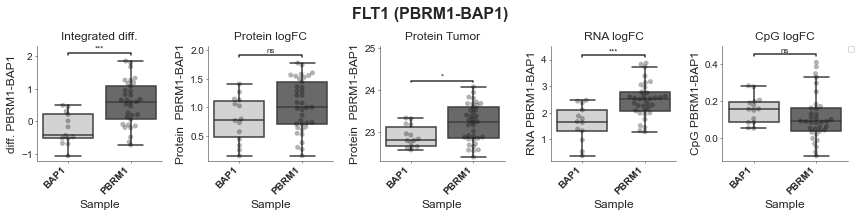

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.176e-03 U_stat=8.100e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.987e-03 U_stat=1.120e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.049e-04 U_stat=9.800e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.222e-02 U_stat=1.190e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.064e-02 U_stat=3.380e+02
https://www.proteinatlas.org/ENSG00000116016-EPAS1/pathology/renal+cancer/KIRC


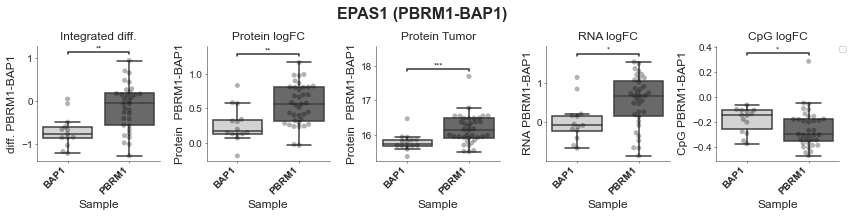

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.470e-02 U_stat=1.140e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.450e-02 U_stat=3.440e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.511e-03 U_stat=3.910e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.955e-04 U_stat=3.840e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.278e-02 U_stat=1.320e+02
https://www.proteinatlas.org/ENSG00000168961-LGALS9/pathology/renal+cancer/KIRC


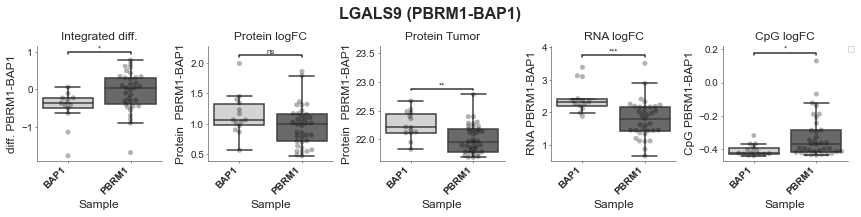

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.649e-03 U_stat=8.500e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.119e-01 U_stat=2.410e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.761e-02 U_stat=1.600e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.649e-03 U_stat=1.050e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.852e-02 U_stat=1.510e+02
https://www.proteinatlas.org/ENSG00000100644-HIF1A/pathology/renal+cancer/KIRC


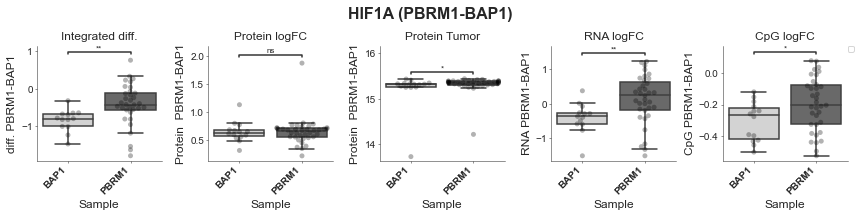

In [110]:
gene_to_ens = dict(zip(vae_rcm_df['external_gene_name'].values, vae_rcm_df.id.values))
ens_to_gene = dict(zip(vae_rcm_df['id'].values, vae_rcm_df.external_gene_name.values))
for gene_name in ['FLT1', 'EPAS1', 'LGALS9', 'HIF1A']:
    plot_gene_logfcs(gene_to_ens[gene_name], 'BAP1', 'PBRM1',  x='Mutation')

In [ ]:
gene_to_ens = dict(zip(vae_rcm_df['external_gene_name'].values, vae_rcm_df.id.values))
ens_to_gene = dict(zip(vae_rcm_df['id'].values, vae_rcm_df.external_gene_name.values))
for gene_name in ['FLT1', 'EPAS1', 'LGALS9']:
    plot_gene_logfcs(gene_to_ens[gene_name], 'Stage I', 'Stage IV',  x='Tumor Stage')

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.431e-01 U_stat=2.820e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.995e-01 U_stat=3.180e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.607e-01 U_stat=2.650e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.494e-01 U_stat=2.710e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.655e-01 U_stat=1.810e+02
https://www.proteinatlas.org/ENSG00000138079-SLC3A1/pathology/renal+cancer/KIRC


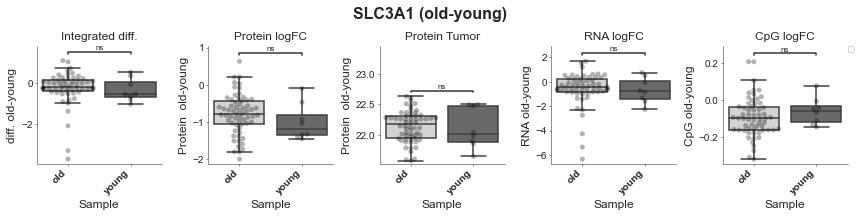

In [103]:
gene_to_ens = dict(zip(vae_rcm_df['external_gene_name'].values, vae_rcm_df.id.values))
ens_to_gene = dict(zip(vae_rcm_df['id'].values, vae_rcm_df.external_gene_name.values))
for gene_name in ['SLC3A1']:
    plot_gene_logfcs(gene_to_ens[gene_name], 'young', 'old',  x='Age')

In [68]:
# Get the genes from the different thins
rna = pd.read_csv(f'{stats_base_dir}RNA_SupTable7_immune.csv')
prot = pd.read_csv(f'{stats_base_dir}protein_SupTable7_immune.csv')
phos = pd.read_csv(f'{stats_base_dir}phospho_SupTable7_immune.csv')
enriched = {}
for column in ['CD8- Inflamed', 'CD8+ Inflamed', 'Metabolic Immune-desert', 'VEGF Immune-desert']:
    # Get the overlap of the genes "enriched" in each of these
    rna_genes = rna[rna[column] > 1.0]
    prot_genes = prot[prot[column] > 1.0]
    phos_genes = phos[phos[column] > 1.0]
    shared_genes = list(set(rna_genes.gene.values) & set(prot_genes.Protein.values) & set(phos_genes.Protein.values))
    print(column, len(shared_genes), len(rna_genes), len(prot_genes), len(phos_genes))
    enriched[column] = shared_genes

CD8- Inflamed 78 751 546 1579
CD8+ Inflamed 147 1546 816 1298
Metabolic Immune-desert 47 1373 401 472
VEGF Immune-desert 100 1217 694 1064


In [98]:
odds_4v1

,Regulatory Cluster label,Cell type,p-value,odds-ratio,genes in cell type and cluster,genes in cluster but not cell type,genes in cell type but not cluster,genes not in cell type or cluster,gene_ids,gene_names,p.adj
0,MDS (+),CD45- Myofibroblast,2.487405e-03,7.868421,6,4,57,299,ENSG00000109654 ENSG00000134504 ENSG0000007452...,TRIM2 KCTD1 NTN4 SELENBP1 NUDT4 GNAI1,0.017205
1,MDS (+),CD45- PAX8+ renal epithelium,3.718479e-03,11.805195,9,1,154,202,ENSG00000114378 ENSG00000126562 ENSG0000013934...,HYAL1 WNK4 AMDHD1 TRIM2 KCTD1 THSD7A SELENBP1 ...,0.021405
2,MDS (+),TAM ISGhi,1.395524e-03,8.891892,7,3,74,282,ENSG00000114378 ENSG00000109654 ENSG0000007452...,HYAL1 TRIM2 NTN4 THSD7A SELENBP1 NUDT4 GNAI1,0.012870
3,MDS (-),CD45- PAX8+ renal epithelium,1.615233e-03,7.986755,12,2,151,201,ENSG00000127324 ENSG00000127831 ENSG0000014562...,TSPAN8 VIL1 UGT3A1 LZTS3 STK33 ANXA9 LAD1 MISP...,0.013406
4,MDE (+),CD45- Myofibroblast,8.392044e-03,3.440476,9,14,54,289,ENSG00000138722 ENSG00000024422 ENSG0000014093...,MMRN1 EHD2 NOL3 SNAP25 CAV1 SNX33 PUS7 SIPA1L2...,0.038697
5,MDE (+),CD45- Vascular Endothelium,4.182745e-04,4.944282,12,11,62,281,ENSG00000138722 ENSG00000170962 ENSG0000002442...,MMRN1 PDGFD EHD2 CAV1 ADSS1 SNX33 HECW2 VWA1 S...,0.005786
6,MDE (+),TAM ISGint,3.868455e-03,4.280702,8,15,38,305,ENSG00000138722 ENSG00000170962 ENSG0000002442...,MMRN1 PDGFD EHD2 CAV1 HECW2 VWA1 SIPA1L2 MMRN2,0.021405
7,MDE (-),TAM HLAhi,2.486779e-03,3.255732,13,27,42,284,ENSG00000103490 ENSG00000160255 ENSG0000016192...,PYCARD ITGB2 CXCL16 LGALS9 RAP2B OAS1 HVCN1 TB...,0.017205
8,TMDE (+),CD45- Myofibroblast,4.128884e-03,5.285714,7,7,56,296,ENSG00000198680 ENSG00000151364 ENSG0000017203...,TUSC1 KCTD14 LAMB2 NAB1 ACYP1 ZNF532 LDAF1,0.021419
9,TMDE (+),CD45- Vascular Endothelium,1.080115e-02,4.253731,7,7,67,285,ENSG00000198680 ENSG00000101871 ENSG0000013616...,TUSC1 MID1 EDNRB LAMB2 EPAS1 ZNF532 PLCB1,0.047184


In [102]:
odds_4v1 = pd.read_csv(f'{stats_base_dir}output_data/single_cell/figures/Stage IV-Stage I_sig_odds_ratio_df.csv')
p_cut = 1.3 # log10(0.05)
cluster = odds_4v1['Regulatory Cluster label'].values
for i, cell_type in enumerate(odds_4v1['Cell type'].values):
    cell_genes = odds_4v1[odds_4v1['Cell type'] == cell_type]#'CD45- PAX8+ renal epithelium'] #'CD8A+ Proliferating']
    cd8a = cell_genes['gene_names'].values[0].split(' ')
    for column in ['CD8- Inflamed', 'CD8+ Inflamed', 'Metabolic Immune-desert', 'VEGF Immune-desert']:
        # Get the overlap of the genes "enriched" in each of these
        rna_genes = rna[rna[column] > p_cut]['gene'].values
        overlap = len(set(rna_genes) & set(cd8a))
        prot_genes = prot[prot[column] > p_cut]['Protein'].values
        phos_genes = phos[phos[column] > p_cut]['Protein'].values
        if overlap > 1:
            shared_genes = list(set(rna_genes) & set(prot_genes))# & set(phos_genes))
            print(cluster[i], cell_type, column, len(shared_genes), len(rna_genes), len(prot_genes), len(phos_genes))
            print(cluster[i], cell_type, column, overlap, overlap/len(cd8a), len(set(prot_genes) & set(cd8a)), len(set(phos_genes) & set(cd8a)))
            print('\n')

MDS (-) CD45- PAX8+ renal epithelium CD8- Inflamed 122 528 419 1102
MDS (-) CD45- PAX8+ renal epithelium CD8- Inflamed 3 0.1875 2 1


MDE (-) CD8A+ Exhausted CD8+ Inflamed 270 1219 552 842
MDE (-) CD8A+ Exhausted CD8+ Inflamed 2 0.4 1 2


MDE (-) CD45- Vascular Endothelium VEGF Immune-desert 149 869 454 668
MDE (-) CD45- Vascular Endothelium VEGF Immune-desert 6 0.46153846153846156 6 1


MDE (-) TAM ISGint VEGF Immune-desert 149 869 454 668
MDE (-) TAM ISGint VEGF Immune-desert 7 0.5833333333333334 8 1


TMDE (-) CD45- Vascular Endothelium VEGF Immune-desert 149 869 454 668
TMDE (-) CD45- Vascular Endothelium VEGF Immune-desert 6 0.46153846153846156 6 1


TMDS (+) CD4+ Proliferating Metabolic Immune-desert 74 840 199 184
TMDS (+) CD4+ Proliferating Metabolic Immune-desert 7 0.25925925925925924 0 0


TMDS (-) CD45- Myofibroblast VEGF Immune-desert 149 869 454 668
TMDS (-) CD45- Myofibroblast VEGF Immune-desert 2 0.16666666666666666 0 1


TMDS (-) CD45- Vascular Endothelium VEGF Immune-d

In [100]:
odds_4v1 = pd.read_csv(f'{stats_base_dir}output_data/single_cell/figures/PBRM1-BAP1_sig_odds_ratio_df.csv')
p_cut = 1.3 # log10(0.05)
cluster = odds_4v1['Regulatory Cluster label'].values
for i, cell_type in enumerate(odds_4v1['Cell type'].values):
    cell_genes = odds_4v1[odds_4v1['Cell type'] == cell_type]#'CD45- PAX8+ renal epithelium'] #'CD8A+ Proliferating']
    cd8a = cell_genes['gene_names'].values[0].split(' ')
    for column in ['CD8- Inflamed', 'CD8+ Inflamed', 'Metabolic Immune-desert', 'VEGF Immune-desert']:
        # Get the overlap of the genes "enriched" in each of these
        rna_genes = rna[rna[column] > p_cut]['gene'].values
        overlap = len(set(rna_genes) & set(cd8a))
        prot_genes = prot[prot[column] > p_cut]['Protein'].values
        phos_genes = phos[phos[column] > p_cut]['Protein'].values
        if overlap > 1:
            shared_genes = list(set(rna_genes) & set(prot_genes))# & set(phos_genes))
            print(cluster[i], cell_type, column, len(shared_genes), len(rna_genes), len(prot_genes), len(phos_genes))
            print(cluster[i], cell_type, column, overlap, overlap/len(cd8a), len(set(prot_genes) & set(cd8a)), len(set(phos_genes) & set(cd8a)))
            print('\n')

MDE (+) CD45- Vascular Endothelium VEGF Immune-desert 149 869 454 668
MDE (+) CD45- Vascular Endothelium VEGF Immune-desert 6 0.5 5 5


MDE (+) TAM ISGint VEGF Immune-desert 149 869 454 668
MDE (+) TAM ISGint VEGF Immune-desert 6 0.75 5 4


MDE (-) TAM HLAhi CD8+ Inflamed 270 1219 552 842
MDE (-) TAM HLAhi CD8+ Inflamed 9 0.6923076923076923 8 3


TMDE (+) CD45- Vascular Endothelium VEGF Immune-desert 149 869 454 668
TMDE (+) CD45- Vascular Endothelium VEGF Immune-desert 6 0.5 5 5


TPDE (+) CD45- Vascular Endothelium VEGF Immune-desert 149 869 454 668
TPDE (+) CD45- Vascular Endothelium VEGF Immune-desert 6 0.5 5 5


TPDE (+) TAM ISGint VEGF Immune-desert 149 869 454 668
TPDE (+) TAM ISGint VEGF Immune-desert 6 0.75 5 4


TPDE (-) TAM HLAhi CD8+ Inflamed 270 1219 552 842
TPDE (-) TAM HLAhi CD8+ Inflamed 9 0.6923076923076923 8 3


TPDE (-) TAM HLAint CD8+ Inflamed 270 1219 552 842
TPDE (-) TAM HLAint CD8+ Inflamed 5 0.625 4 2


TPDE (-) TAM/TCR (Ambiguos) CD8+ Inflamed 270 1219 552 842


In [76]:
enriched['VEGF Immune-desert']

['RAPH1',
 'TANC1',
 'NOS3',
 'SHROOM4',
 'FILIP1',
 'ATG2B',
 'IRF2BP2',
 'RBFOX2',
 'PTK2',
 'EML3',
 'UACA',
 'MCAM',
 'HDAC5',
 'NDRG2',
 'RBMX',
 'FAM13A',
 'NID2',
 'TBX2',
 'LUZP1',
 'FHOD1',
 'PEAK1',
 'SBF2',
 'ARHGEF10',
 'TRIM24',
 'ADSSL1',
 'TJP1',
 'KANK3',
 'PDE3A',
 'RASAL2',
 'GAB1',
 'MCC',
 'GIMAP8',
 'AMOTL1',
 'MARCKSL1',
 'KLC1',
 'KANK2',
 'NRIP2',
 'CAMSAP2',
 'HSPA12B',
 'APBB2',
 'SH3BP4',
 'THRA',
 'NUMA1',
 'EPN2',
 'ARID4A',
 'GUCY1A2',
 'NFIB',
 'RAI14',
 'RCOR1',
 'NES',
 'MAPK3',
 'RASIP1',
 'ARHGAP6',
 'CLIP2',
 'ARHGEF17',
 'CTNNB1',
 'ADARB1',
 'AFAP1L1',
 'PLVAP',
 'NOL3',
 'ARHGEF12',
 'ARHGAP29',
 'MCF2L',
 'ARHGAP31',
 'DOCK9',
 'CEP68',
 'PECAM1',
 'CDK17',
 'CDC42BPB',
 'PSIP1',
 'TP53I11',
 'ELF2',
 'PALMD',
 'NOTCH3',
 'FAM122A',
 'AFAP1L2',
 'NASP',
 'SLC9A3R2',
 'SCARF1',
 'SPARCL1',
 'SEPT4',
 'TNS2',
 'NHSL2',
 'MAGI1',
 'CDC42BPA',
 'MAP4K4',
 'ARAP3',
 'RAPGEF2',
 'ITPKB',
 'DOCK6',
 'CAV1',
 'ERG',
 'RGCC',
 'LZTS1',
 'SNRK',
 'PPP1R13B

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.528e-01 U_stat=2.340e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.800e-01 U_stat=2.400e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.362e-02 U_stat=1.540e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.721e-01 U_stat=3.040e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.171e-01 U_stat=3.310e+02
https://www.proteinatlas.org/ENSG00000166741-NNMT/pathology/renal+cancer/KIRC


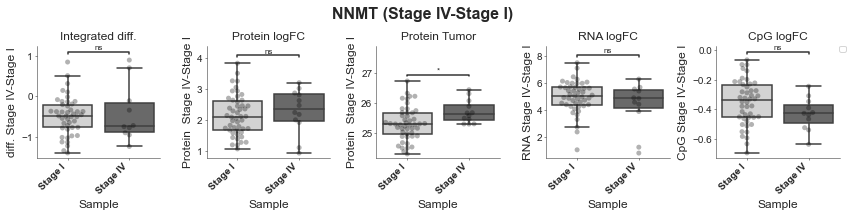

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.326e-02 U_stat=3.390e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.575e-03 U_stat=1.430e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.059e-01 U_stat=3.760e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.368e-03 U_stat=3.900e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.213e-02 U_stat=1.520e+02
https://www.proteinatlas.org/ENSG00000145692-BHMT/pathology/renal+cancer/KIRC


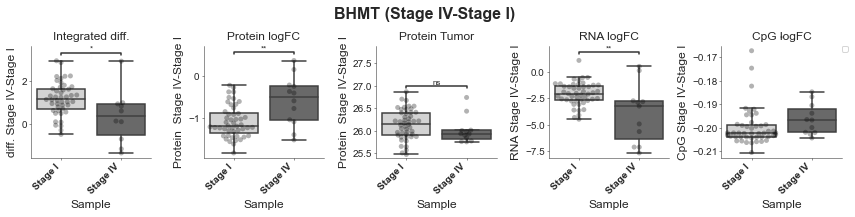

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.850e-01 U_stat=2.120e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.621e-05 U_stat=6.400e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.319e-01 U_stat=3.410e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.630e-01 U_stat=2.960e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.459e-02 U_stat=1.480e+02
https://www.proteinatlas.org/ENSG00000132840-BHMT2/pathology/renal+cancer/KIRC


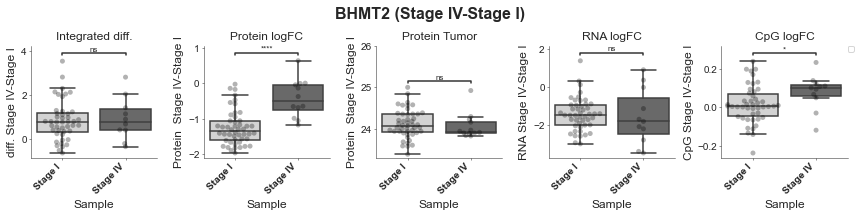

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.590e-02 U_stat=1.140e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.224e-03 U_stat=1.220e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.375e-01 U_stat=2.620e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.826e-02 U_stat=1.390e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.267e-01 U_stat=2.040e+02
https://www.proteinatlas.org/ENSG00000101444-AHCY/pathology/renal+cancer/KIRC


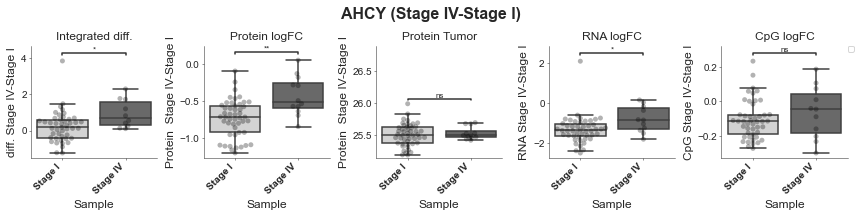

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.716e-02 U_stat=1.290e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.368e-05 U_stat=7.300e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.319e-01 U_stat=2.350e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.591e-01 U_stat=1.870e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.114e-01 U_stat=2.590e+02
https://www.proteinatlas.org/ENSG00000243989-ACY1/pathology/renal+cancer/KIRC


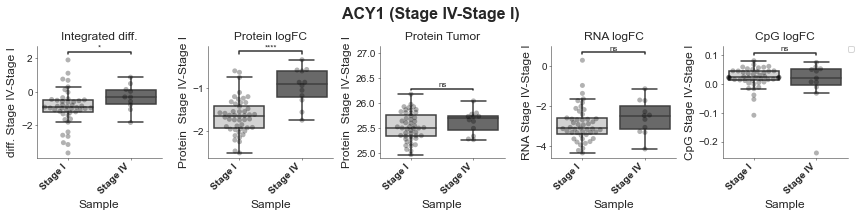

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.008e-01 U_stat=1.860e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.270e-04 U_stat=8.800e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.019e-01 U_stat=1.990e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.923e-01 U_stat=2.310e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.083e-01 U_stat=2.720e+02
https://www.proteinatlas.org/ENSG00000139531-SUOX/pathology/renal+cancer/KIRC


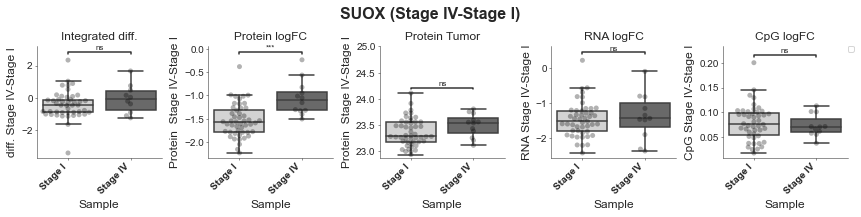

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.012e-02 U_stat=1.180e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.251e-04 U_stat=9.300e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.453e-02 U_stat=1.910e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.804e-02 U_stat=1.660e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000092068-SLC7A8/pathology/renal+cancer/KIRC


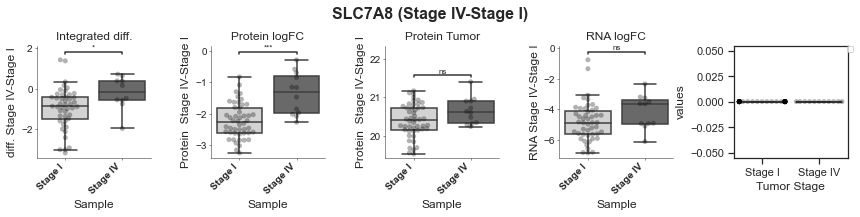

In [29]:
gene_to_ens = dict(zip(vae_rcm_df['external_gene_name'].values, vae_rcm_df.id.values))
ens_to_gene = dict(zip(vae_rcm_df['id'].values, vae_rcm_df.external_gene_name.values))
for gene_name in ['NNMT', 'BHMT', 'BHMT2', 'AHCY', 'ACY1', 'SUOX', 'SLC7A8']:
    plot_gene_logfcs(gene_to_ens[gene_name], 'Stage I', 'Stage IV',  x='Tumor Stage')

--------------------------------------------------------------------------------
                                      MDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     TPDE	                                      
--------------------------------------------------------------------------------
----------------------------

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.124e-04 U_stat=7.120e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.618e-02 U_stat=9.570e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.672e-02 U_stat=8.130e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.625e-01 U_stat=1.155e+03
https://www.proteinatlas.org/ENSG00000182154-MRPL41/pathology/renal+cancer/KIRC


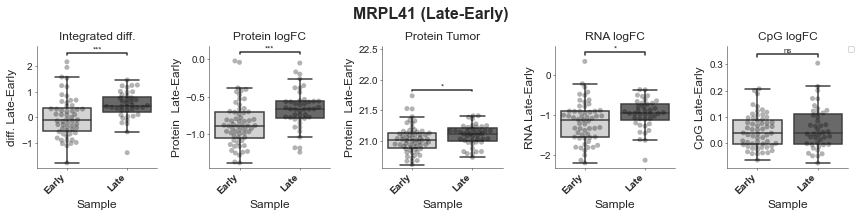

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.673e-04 U_stat=1.548e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.348e-02 U_stat=1.568e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.553e-01 U_stat=1.503e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.308e-05 U_stat=1.692e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.613e-01 U_stat=1.112e+03
https://www.proteinatlas.org/ENSG00000182752-PAPPA/pathology/renal+cancer/KIRC


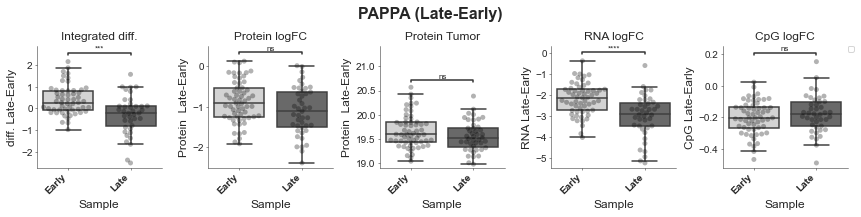

--------------------------------------------------------------------------------
                                     TMDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.388e-04 U_stat=6.050e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.724e-04 U_stat=7.810e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.681e-02 U_stat=9.320e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.001e-04 U_stat=6.820e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000100075-SLC25A1/pathology/renal+cancer/KIRC


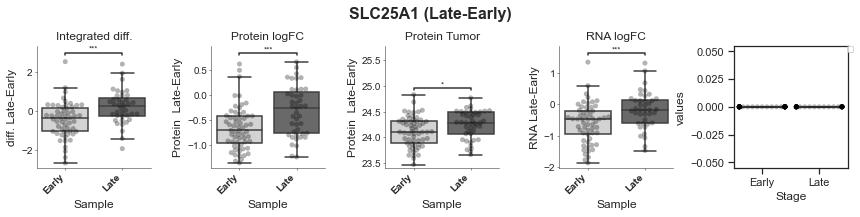

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.789e-03 U_stat=6.650e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.573e-02 U_stat=9.560e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.714e-01 U_stat=1.085e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.619e-04 U_stat=6.890e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.972e-01 U_stat=1.199e+03
https://www.proteinatlas.org/ENSG00000101473-ACOT8/pathology/renal+cancer/KIRC


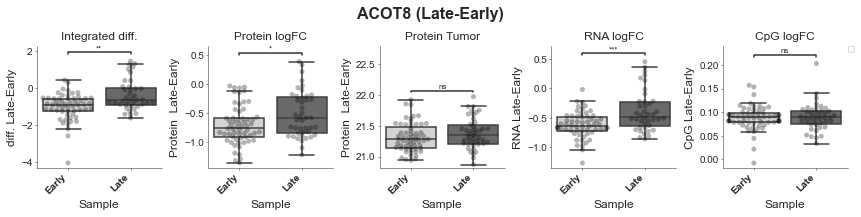

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.528e-03 U_stat=6.590e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.431e-04 U_stat=7.950e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.137e-01 U_stat=1.053e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.489e-03 U_stat=7.060e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.740e-01 U_stat=1.137e+03
https://www.proteinatlas.org/ENSG00000148672-GLUD1/pathology/renal+cancer/KIRC


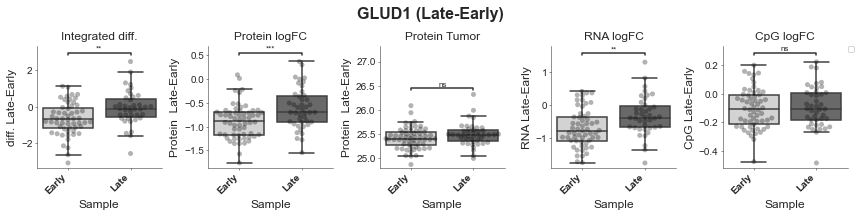

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.291e-02 U_stat=7.480e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.025e-03 U_stat=8.700e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.148e-01 U_stat=1.104e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.244e-03 U_stat=7.790e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.587e-01 U_stat=1.244e+03
https://www.proteinatlas.org/ENSG00000138413-IDH1/pathology/renal+cancer/KIRC


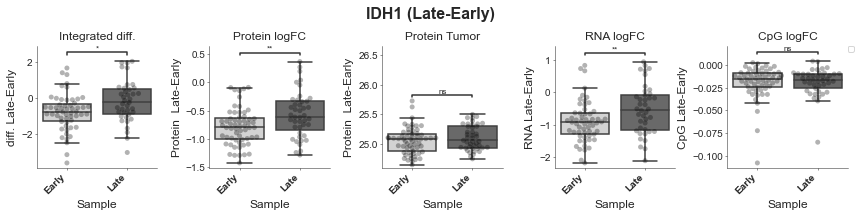

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.762e-04 U_stat=6.340e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.124e-04 U_stat=7.120e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.045e-02 U_stat=9.970e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.606e-03 U_stat=7.090e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.625e-01 U_stat=1.155e+03
https://www.proteinatlas.org/ENSG00000244005-NFS1/pathology/renal+cancer/KIRC


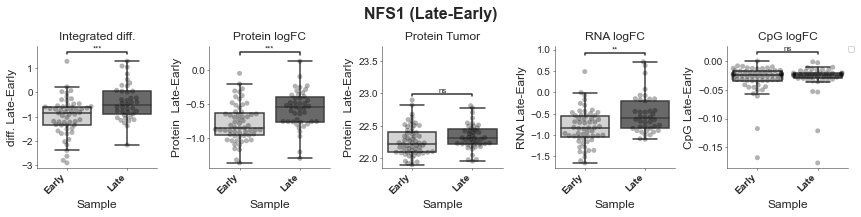

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.404e-04 U_stat=1.531e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.073e-02 U_stat=1.672e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.724e-02 U_stat=1.602e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.141e-04 U_stat=1.667e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.788e-01 U_stat=1.138e+03
https://www.proteinatlas.org/ENSG00000187955-COL14A1/pathology/renal+cancer/KIRC


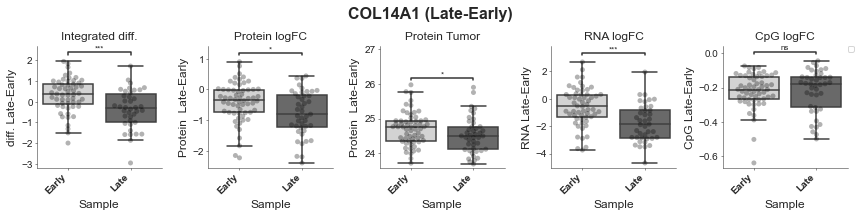

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.338e-03 U_stat=1.491e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.900e-02 U_stat=1.617e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.713e-01 U_stat=1.455e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.928e-04 U_stat=1.616e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e-01 U_stat=9.820e+02
https://www.proteinatlas.org/ENSG00000162458-FBLIM1/pathology/renal+cancer/KIRC


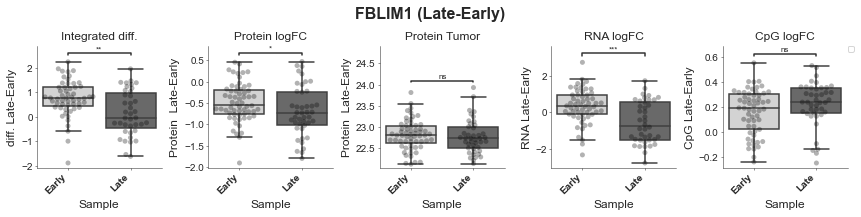

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.144e-03 U_stat=1.473e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.252e-03 U_stat=1.692e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.368e-01 U_stat=1.513e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.246e-03 U_stat=1.581e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.191e-01 U_stat=1.166e+03
https://www.proteinatlas.org/ENSG00000171476-HOPX/pathology/renal+cancer/KIRC


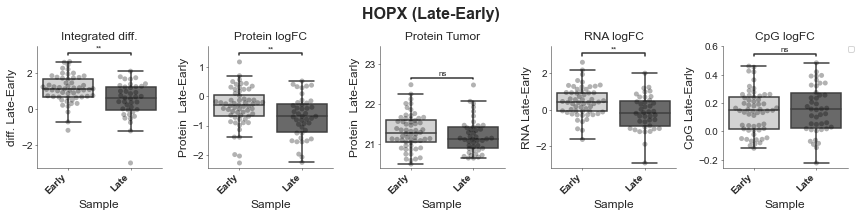

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.050e-03 U_stat=1.500e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.541e-01 U_stat=1.318e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.447e-02 U_stat=1.591e+03
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00

No handles with labels found to put in legend.



*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.309e-04 U_stat=1.643e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.524e-01 U_stat=1.153e+03
https://www.proteinatlas.org/ENSG00000099998-GGT5/pathology/renal+cancer/KIRC


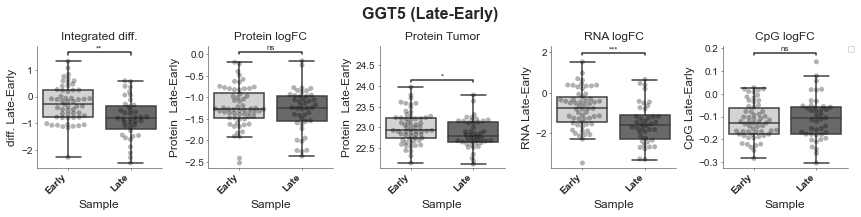

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.909e-03 U_stat=1.449e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.926e-02 U_stat=1.537e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.377e-02 U_stat=1.592e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.443e-03 U_stat=1.554e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.313e-01 U_stat=1.187e+03
https://www.proteinatlas.org/ENSG00000084636-COL16A1/pathology/renal+cancer/KIRC


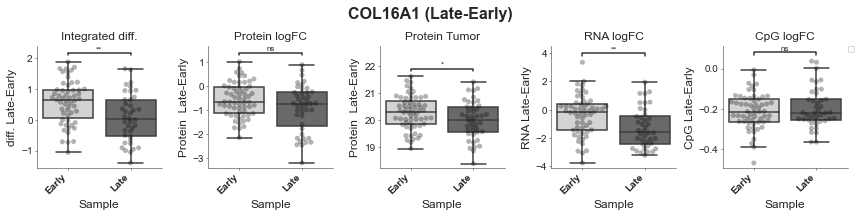

--------------------------------------------------------------------------------
                                     TMDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.801e-04 U_stat=6.170e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.208e-04 U_stat=7.940e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.942e-02 U_stat=1.018e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.865e-03 U_stat=7.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000160214-RRP1/pathology/renal+cancer/KIRC


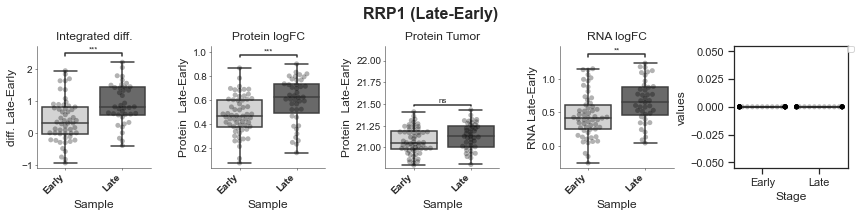

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.861e-04 U_stat=1.560e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.386e-02 U_stat=1.549e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.231e-01 U_stat=1.364e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.308e-05 U_stat=1.692e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.692e-01 U_stat=1.300e+03
https://www.proteinatlas.org/ENSG00000100448-CTSG/pathology/renal+cancer/KIRC


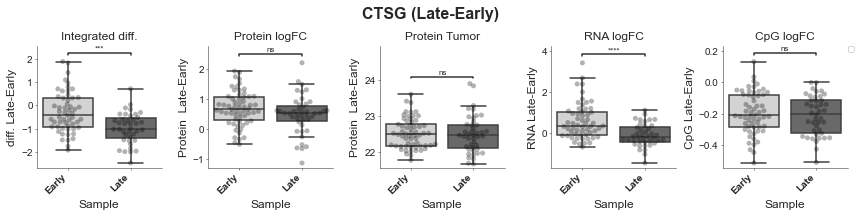

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.204e-04 U_stat=1.509e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.429e-02 U_stat=1.607e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.534e-01 U_stat=1.504e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.106e-03 U_stat=1.544e+03
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.548e-01 U_stat=1.351e+03


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000240764-PCDHGC5/pathology/renal+cancer/KIRC


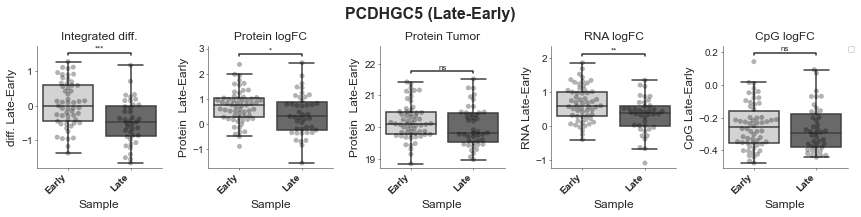

--------------------------------------------------------------------------------
                                      MDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.202e-03 U_stat=1.

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.125e-04 U_stat=1.810e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.875e-04 U_stat=1.812e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.266e-02 U_stat=1.432e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.096e-04 U_stat=7.010e+02
https://www.proteinatlas.org/ENSG00000018236-CNTN1/pathology/renal+cancer/KIRC


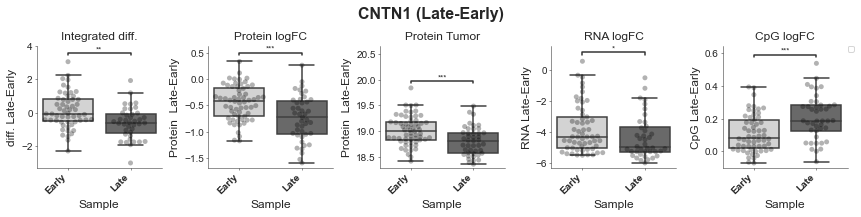

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.303e-03 U_stat=1.492e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.936e-03 U_stat=1.676e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.506e-02 U_stat=1.548e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.740e-02 U_stat=1.465e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.041e-03 U_stat=8.380e+02
https://www.proteinatlas.org/ENSG00000004776-HSPB6/pathology/renal+cancer/KIRC


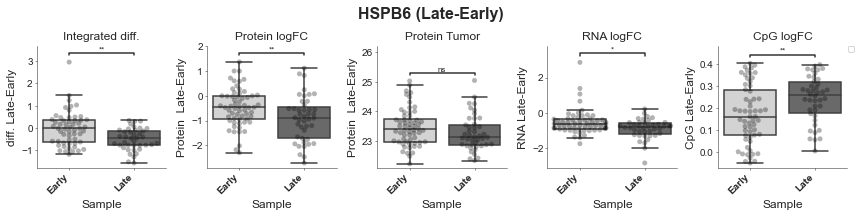

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.611e-03 U_stat=1.484e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.778e-01 U_stat=1.492e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.389e-02 U_stat=1.541e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.535e-04 U_stat=1.628e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Early v.s. Late: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.062e-01 U_stat=1.071e+03
https://www.proteinatlas.org/ENSG00000135480-KRT7/pathology/renal+cancer/KIRC


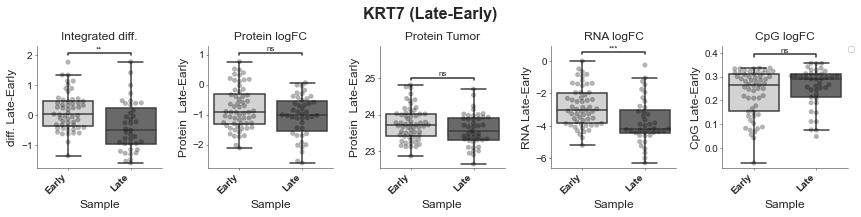

--------------------------------------------------------------------------------
                                      MDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.818e-01 U_stat=2.980e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.180e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.933e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.160e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.090e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.227e-02 U_stat=9.600e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.500e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.040e-02 U_stat=1.180e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.349e-02 U_stat=9.700e+01
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.665e-01 U_stat=2.080e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.181e-01 U_stat=8.200e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.990e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.353e-02 U_stat=1.040e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.347e-02 U_stat=1.450e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.237e-01 U_stat=2.720e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.165e-01 U_stat=1.100e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.140e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.600e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.610e-01 U_stat=1.650e+02
https://www.proteinatlas.org/ENSG00000136231-IGF2BP3/pathology/renal+cancer/KIRC


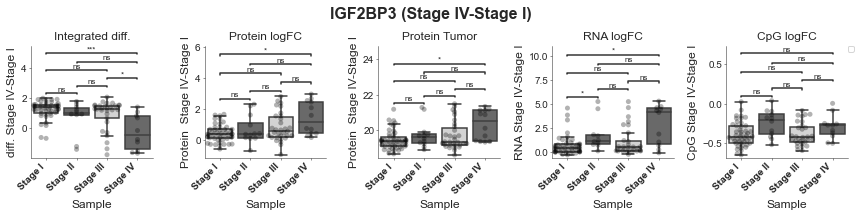

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.352e-01 U_stat=3.200e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.259e-01 U_stat=9.400e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.085e-01 U_stat=2.190e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.340e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.737e-02 U_stat=3.620e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.348e-01 U_stat=1.640e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.847e-01 U_stat=2.400e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.380e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.500e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.527e-02 U_stat=1.570e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.719e-01 U_stat=1.550e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.840e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.505e-01 U_stat=1.060e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.840e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.600e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.736e-01 U_stat=1.640e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.181e-01 U_stat=1.810e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.000e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.674e-01 U_stat=1.190e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.486e-01 U_stat=5.500e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.967e-01 U_stat=4.300e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.702e-02 U_stat=1.210e+02
https://www.proteinatlas.org/ENSG00000277586-NEFL/pathology/renal+cancer/KIRC


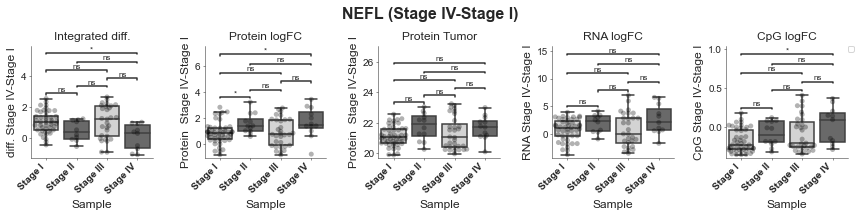

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.739e-01 U_stat=3.060e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.080e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.940e-02 U_stat=2.200e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.100e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.273e-01 U_stat=7.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.302e-02 U_stat=3.660e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.600e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.847e-01 U_stat=2.400e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.844e-01 U_stat=1.210e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.600e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.507e-01 U_stat=2.080e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.574e-01 U_stat=1.500e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.610e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.149e-01 U_stat=9.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.846e-01 U_stat=5.260e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.572e-02 U_stat=1.140e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.080e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.700e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.824e-01 U_stat=2.290e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.570e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.895e-01 U_stat=9.100e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.061e-01 U_stat=3.500e+02
https://www.proteinatlas.org/ENSG00000242515-UGT1A10/pathology/renal+cancer/KIRC


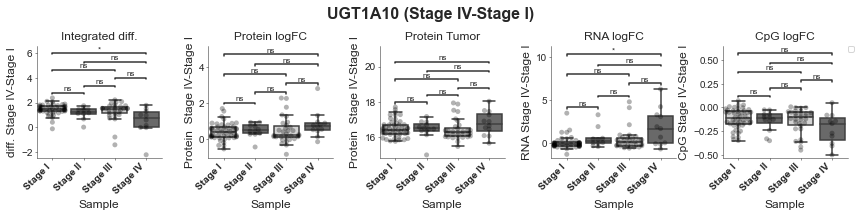

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.698e-01 U_stat=3.260e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.183e-01 U_stat=7.200e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.653e-02 U_stat=2.340e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.160e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.466e-02 U_stat=3.570e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.603e-02 U_stat=1.550e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.306e-01 U_stat=2.530e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.978e-01 U_stat=1.130e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.710e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.288e-02 U_stat=1.490e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.040e-01 U_stat=1.660e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.282e-01 U_stat=2.100e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.506e-02 U_stat=6.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.020e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.400e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.837e-01 U_stat=1.490e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.122e-01 U_stat=3.990e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.056e-01 U_stat=1.180e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.104e-01 U_stat=2.390e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.670e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.694e-01 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000026508-CD44/pathology/renal+cancer/KIRC


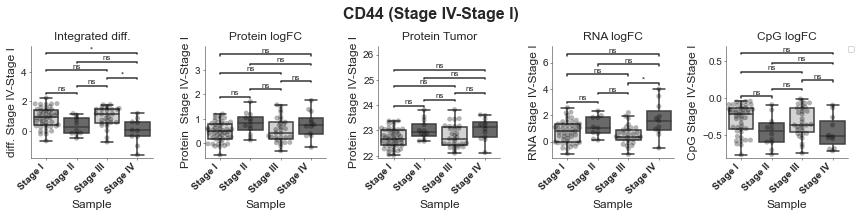

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.446e-01 U_stat=1.570e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.707e-01 U_stat=1.890e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.207e-03 U_stat=2.440e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.730e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.321e-02 U_stat=9.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.530e-03 U_stat=3.830e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.223e-01 U_stat=1.620e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.220e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.792e-01 U_stat=1.270e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.133e-01 U_stat=1.220e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.270e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.116e-02 U_stat=2.700e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.434e-02 U_stat=1.320e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.082e-01 U_stat=3.100e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.707e-01 U_stat=1.010e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.568e-02 U_stat=7.500e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.320e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.904e-01 U_stat=2.400e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.738e-02 U_stat=1.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.060e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.300e-01 U_stat=2.630e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.549e-01 U_stat=1.140e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.390e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000100097-LGALS1/pathology/renal+cancer/KIRC


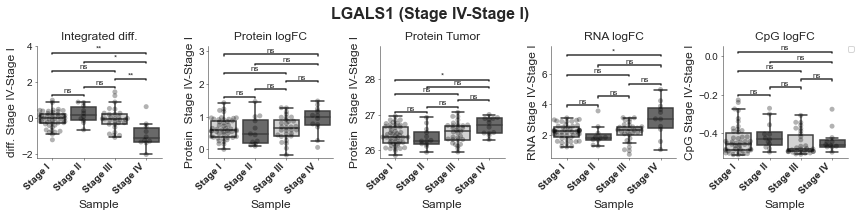

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.537e-02 U_stat=1.140e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.402e-01 U_stat=7.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.478e-01 U_stat=4.910e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.718e-01

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.104e-03 U_stat=4.690e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.410e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.350e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.271e-01 U_stat=9.360e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.100e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.108e-02 U_stat=4.570e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.891e-01 U_stat=3.380e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.140e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.153e-01 U_stat=2.240e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.110e-01 U_stat=8.350e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.000e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.998e-02 U_stat=4.070e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.340e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.070e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.630e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.000e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000179403-VWA1/pathology/renal+cancer/KIRC


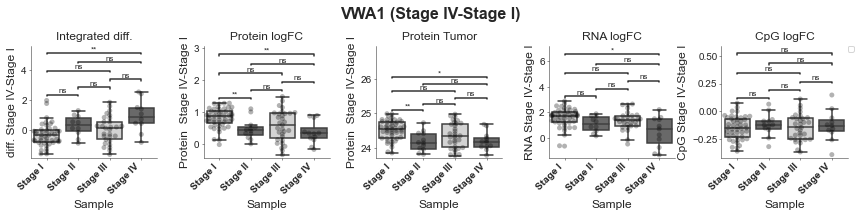

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.309e-01 U_stat=1.420e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.576e-02 U_stat=5.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.340e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.258e-01 U_stat=2.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.192e-03 U_stat=5.400e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.002e-01 U_stat=4.180e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.640e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.200e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.327e-01 U_stat=9.140e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.600e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.002e-01 U_stat=4.180e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.624e-01 U_stat=3.250e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.110e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.879e-01 U_stat=2.210e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.330e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.317e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.310e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.700e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.750e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.930e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.780e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000179144-GIMAP7/pathology/renal+cancer/KIRC


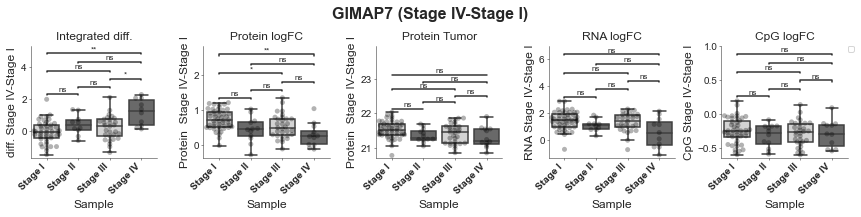

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.100e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.380e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.773e-02 U_stat=6.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.330e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.273e-01 U_stat=2.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.988e-03 U_stat=7.900e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.922e-01 U_stat=3.700e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.390e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.430e-01 U_stat=2.460e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.820e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.400e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.491e-01 U_stat=3.910e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.570e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.660e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.545e-01 U_stat=2.270e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.768e-01 U_stat=8.560e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.802e-01 U_stat=7.700e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.718e-02 U_stat=3.970e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.710e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.740e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.060e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.760e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000164116-GUCY1A1/pathology/renal+cancer/KIRC


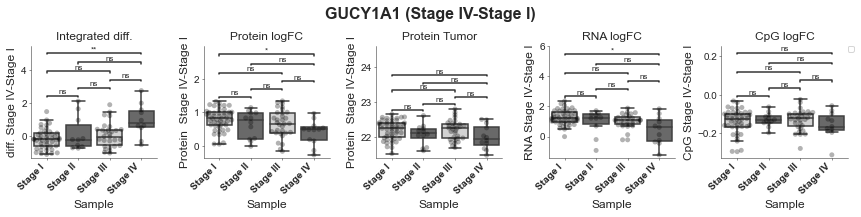

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.309e-01 U_stat=1.420e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.620e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.109e-01 U_stat=7.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.340e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.247e-01 U_stat=2.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.124e-02 U_stat=8.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.650e-02 U_stat=4.290e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.380e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.190e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.828e-01 U_stat=9.020e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.900e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.527e-02 U_stat=4.190e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.456e-01 U_stat=3.260e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.280e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.879e-01 U_stat=2.210e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.030e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.400e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.500e-02 U_stat=3.980e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.600e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.780e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.630e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.480e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000061337-LZTS1/pathology/renal+cancer/KIRC


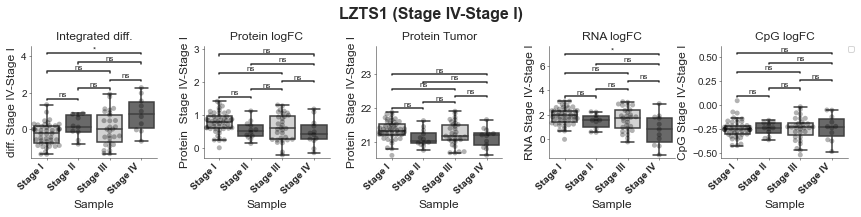

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.130e-02 U_stat=1.040e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.100e-01 U_stat=8.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.631e-01 U_stat=5.200e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.988e-03 U_stat=7.900e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.775e-03 U_stat=4.700e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.680e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.270e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.610e-02 U_stat=1.010e+03
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.800e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.775e-03 U_stat=4.700e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.739e-02 U_stat=3.590e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.110e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.879e-01 U_stat=2.210e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.898e-01 U_stat=8.230e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.700e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.184e-02 U_stat=4.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.692e-01 U_stat=3.810e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.237e-01 U_stat=1.000e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.659e-01 U_stat=2.200e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.780e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.559e-01 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000173269-MMRN2/pathology/renal+cancer/KIRC


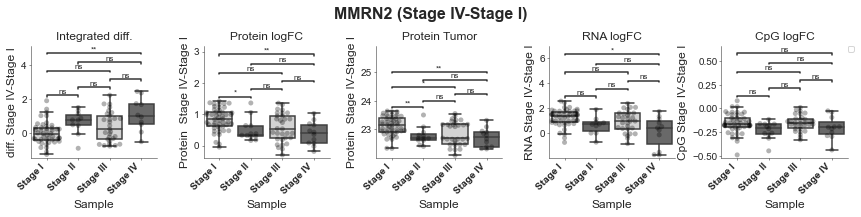

--------------------------------------------------------------------------------
                                     TPDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.210e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.190e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.780e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.540e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.540e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.420e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.239e-01 U_stat=5.130e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.561e-01 U_stat=4.500e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.088e-03 U_stat=1.120e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.500e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.170e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.879e-01 U_stat=9.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.560e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.904e-01 U_stat=2.400e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.718e-02 U_stat=1.200e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.930e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.402e-01 U_stat=1.310e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.780e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.513e-01 U_stat=5.580e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000071539-TRIP13/pathology/renal+cancer/KIRC


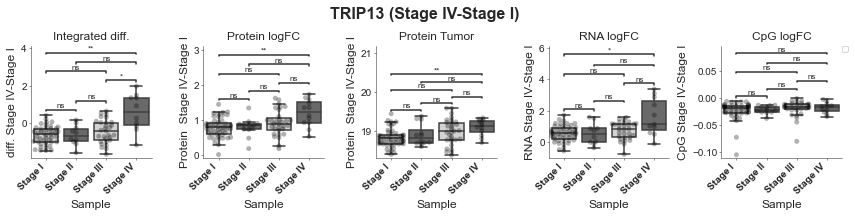

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.670e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.467e-01 U_stat=2.090e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.683e-03 U_stat=3.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.411e-01 U_stat=8.250e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.428e-01 U_stat=3.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.124e-02 U_stat=8.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.980e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.056e-01 U_stat=2.540e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.757e-01 U_stat=1.050e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.132e-02 U_stat=1.054e+03
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.840e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.099e-02 U_stat=1.120e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.780e-02 U_stat=2.280e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.845e-02 U_stat=6.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.980e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.000e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.062e-02 U_stat=1.310e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.530e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.460e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.090e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.014e-01 U_stat=5.240e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.800e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.400e+02
https://www.proteinatlas.org/ENSG00000133488-SEC14L4/pathology/renal+cancer/KIRC


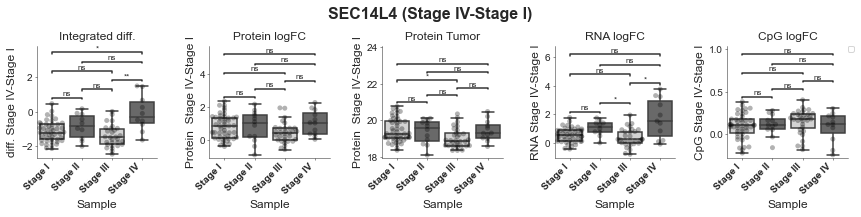

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.110e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.600e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.933e-02 U_stat=5.700e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.570e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.841e-01 U_stat=2.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.044e-02 U_stat=8.100e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.680e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.620e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.420e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.700e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.695e-01 U_stat=4.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.116e-01 U_stat=1.990e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.990e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.560e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.197e-01 U_stat=9.000e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.230e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.349e-02 U_stat=1.340e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.344e-01 U_stat=1.680e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.013e-01 U_stat=2.650e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.027e-01 U_stat=1.060e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.480e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.500e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.746e-01 U_stat=1.740e+02
https://www.proteinatlas.org/ENSG00000175063-UBE2C/pathology/renal+cancer/KIRC


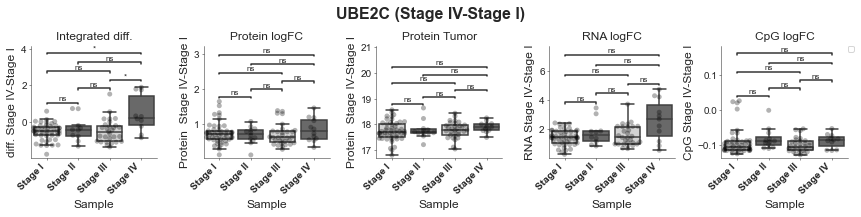

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.897e-01 U_stat=1.340e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.860e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.875e-01 U_stat=8.300e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.890e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.702e-02 U_stat=9.900e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.248e-02 U_stat=1.370e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.592e-01 U_stat=2.560e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.569e-01 U_stat=1.200e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.520e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.301e-02 U_stat=1.420e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.750e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.560e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.505e-01 U_stat=1.060e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.030e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.300e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.584e-01 U_stat=1.560e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000128335-APOL2/pathology/renal+cancer/KIRC


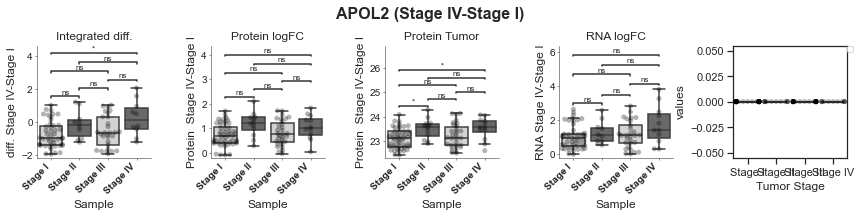

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.010e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.650e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.335e-02 U_stat=6.500e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.300e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.273e-01 U_stat=2.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.223e-02 U_stat=1.010e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.510e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.190e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.309e-02 U_stat=8.300e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.160e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.248e-02 U_stat=1.370e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.287e-01 U_stat=1.250e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.820e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.240e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.770e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.203e-01 U_stat=1.760e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000265190-ANXA8/pathology/renal+cancer/KIRC


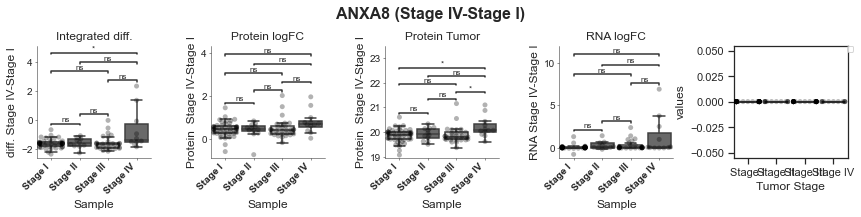

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.479e-01 U_stat=3.190e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.080e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.144e-03 U_stat=2.510e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.200e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.798e-02

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.631e-02 U_stat=4.260e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.430e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.306e-01 U_stat=2.530e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.680e-01 U_stat=8.840e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.734e-02 U_stat=4.420e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.370e-01 U_stat=3.210e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.130e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.331e-02 U_stat=2.610e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.670e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.266e-01 U_stat=8.500e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.592e-04 U_stat=4.540e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000261371-PECAM1/pathology/renal+cancer/KIRC


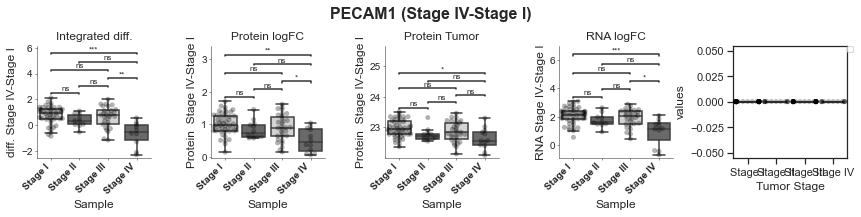

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.223e-02 U_stat=3.490e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.141e-01 U_stat=1.000e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.607e-02 U_stat=2.230e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.384e-01 U_stat=7.810e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.042e-04 U_stat=4.020e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.165e-03 U_stat=4.600e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.350e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.340e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.646e-01 U_stat=9.450e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.108e-02 U_stat=4.570e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.025e-02 U_stat=3.850e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.030e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.365e-01 U_stat=2.280e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.953e-01 U_stat=8.540e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.576e-03 U_stat=4.430e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.761e-01 U_stat=1.620e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.560e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.510e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.018e-03 U_stat=3.850e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.000e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.427e-02 U_stat=1.200e+02
https://www.proteinatlas.org/ENSG00000064989-CALCRL/pathology/renal+cancer/KIRC


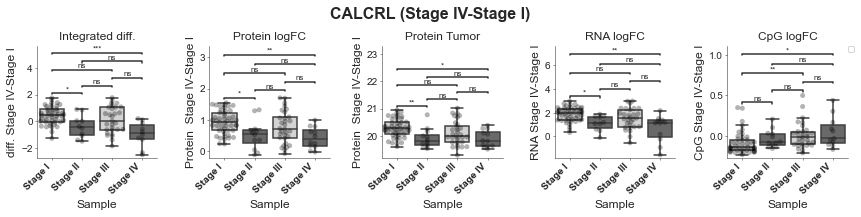

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.074e-01 U_stat=3.340e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.130e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.325e-02 U_stat=2.220e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.480e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.042e-04 U_stat=4.020e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.509e-02 U_stat=4.520e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.450e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.190e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.167e-01 U_stat=9.070e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.172e-02 U_stat=4.220e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.095e-01 U_stat=3.480e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.150e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.365e-01 U_stat=2.280e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.468e-01 U_stat=8.400e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.480e-03 U_stat=4.290e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000176435-CLEC14A/pathology/renal+cancer/KIRC


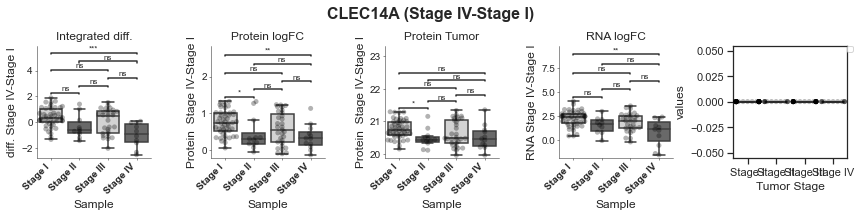

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.203e-01 U_stat=3.040e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.160e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.780e-02 U_stat=2.280e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.010e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.338e-01 U_stat=7.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.679e-03 U_stat=3.920e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.361e-01 U_stat=4.000e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.510e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.270e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.105e-01 U_stat=9.260e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.603e-02 U_stat=4.210e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.369e-01 U_stat=3.440e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.858e-01 U_stat=9.300e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.386e-01 U_stat=2.350e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.300e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.932e-01 U_stat=7.600e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.674e-03 U_stat=4.180e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.520e-01 U_stat=1.590e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.595e-02 U_stat=2.880e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.310e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.320e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.700e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.300e+02
https://www.proteinatlas.org/ENSG00000061918-GUCY1B1/pathology/renal+cancer/KIRC


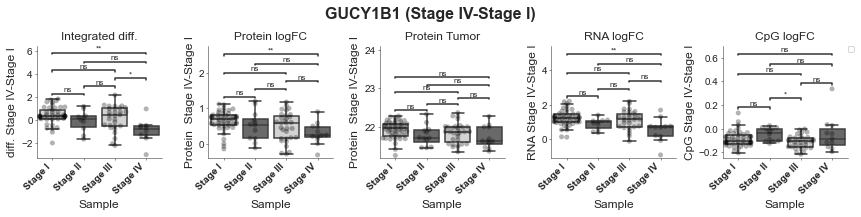

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.130e-02 U_stat=3.460e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.086e-01 U_stat=9.800e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.467e-01 U_stat=2.090e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.680e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.865e-02 U_stat=3.610e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.775e-03 U_stat=4.700e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.300e-01 U_stat=1.090e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.881e-01 U_stat=2.660e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.317e-01 U_stat=8.920e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.040e-02 U_stat=4.580e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.708e-02 U_stat=3.520e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.070e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.743e-01 U_stat=2.150e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.114e-01 U_stat=8.160e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.500e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.898e-02 U_stat=3.840e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000249751-ECSCR/pathology/renal+cancer/KIRC


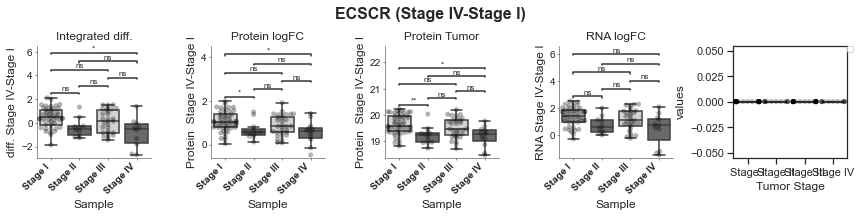

--------------------------------------------------------------------------------
                                     TPDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.840e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.470e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.365e-03 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.560e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.880e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.817e-02 U_stat=7.600e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.820e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.065e-02 U_stat=2.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.816e-03 U_stat=9.200e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.160e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.310e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.612e-02 U_stat=7.100e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.810e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.965e-02 U_stat=1.700e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.682e-03 U_stat=8.100e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.310e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.380e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.720e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000108176-DNAJC12/pathology/renal+cancer/KIRC


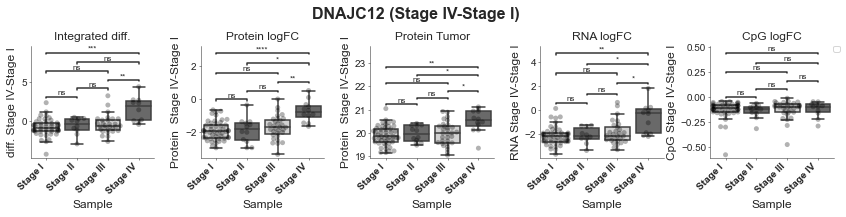

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.093e-03 U_stat=5.300e+01
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.933e-02 U_stat=2.330e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.028e-02 U_stat=4.700e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.542e-01 U_stat=8.050e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.855e-03 U_stat=7.100e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.055e-02 U_stat=1.560e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.377e-01 U_stat=2.570e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.881e-01 U_stat=1.060e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.080e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.809e-02 U_stat=1.270e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.257e-03 U_stat=8.200e+01
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.396e-02 U_stat=2.350e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.796e-02 U_stat=6.100e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.770e-01 U_stat=8.460e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.300e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.353e-02 U_stat=1.040e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.450e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.940e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.659e-01 U_stat=1.210e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.498e-01 U_stat=8.550e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.967e-01 U_stat=4.300e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.390e+02
https://www.proteinatlas.org/ENSG00000154277-UCHL1/pathology/renal+cancer/KIRC


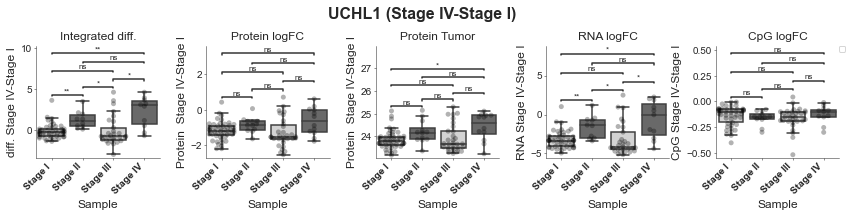

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.070e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.610e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.365e-03 U_stat=4.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.900e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.035e-01 U_stat=1.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.542e-03 U_stat=5.700e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.660e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.300e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.391e-02 U_stat=7.300e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.510e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.424e-01 U_stat=3.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.638e-02 U_stat=1.390e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.970e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.640e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.909e-02 U_stat=6.600e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.560e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.686e-01 U_stat=2.600e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.876e-03 U_stat=8.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.390e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.978e-01 U_stat=2.590e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.120e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.020e-01 U_stat=9.180e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.260e-01 U_stat=1.040e+02


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.940e-02 U_stat=3.720e+02
https://www.proteinatlas.org/ENSG00000073792-IGF2BP2/pathology/renal+cancer/KIRC


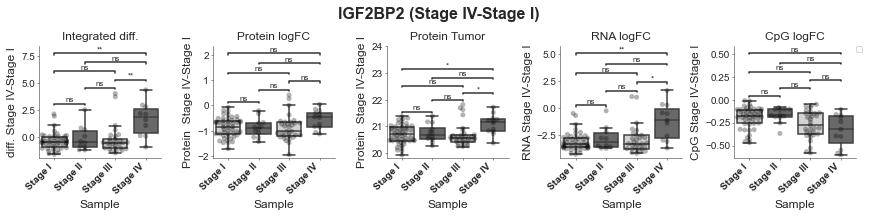

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.890e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.440e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.889e-04 U_stat=2.200e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.360e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.166e-02 U_stat=1.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.221e-05 U_stat=1.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.720e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.450e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.420e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.472e-01 U_stat=1.910e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.940e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.550e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.175e-04 U_stat=3.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.410e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.084e-02 U_stat=1.300e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.198e-05 U_stat=4.000e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000065154-OAT/pathology/renal+cancer/KIRC


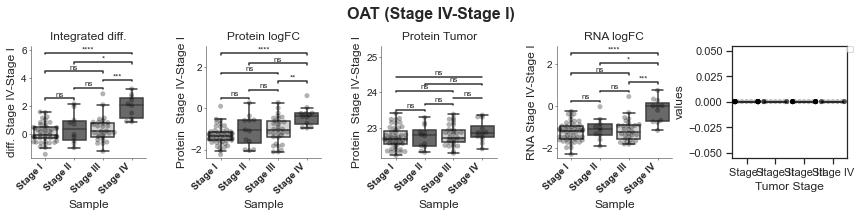

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.352e-01 U_stat=1.300e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.945e-02 U_stat=6.600e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.242e-01 U_stat=4.640e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.416e-03 U_stat=5.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.230e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.260e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.983e-02 U_stat=7.700e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.370e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.741e-01 U_stat=4.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.562e-03 U_stat=1.130e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.447e-01 U_stat=1.370e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.650e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.938e-01 U_stat=9.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.166e-01 U_stat=4.850e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.900e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.488e-03 U_stat=8.000e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.676e-01 U_stat=3.740e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.402e-01 U_stat=1.310e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.920e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.980e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000135069-PSAT1/pathology/renal+cancer/KIRC


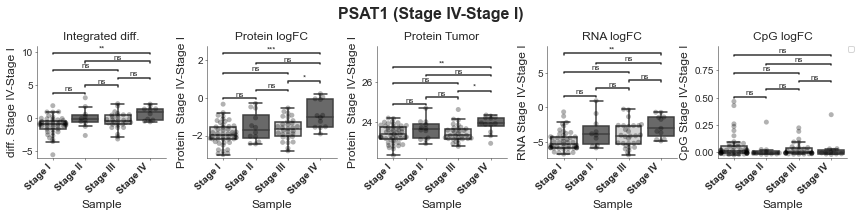

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.448e-01 U_stat=3.030e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.250e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.467e-01 U_stat=2.090e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.430e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.428e-01

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.557e-01 U_stat=4.090e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.550e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.960e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.967e-01 U_stat=9.010e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.451e-01 U_stat=3.800e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.346e-01 U_stat=3.060e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.360e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.153e-01 U_stat=2.240e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.900e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.400e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.317e-02 U_stat=3.810e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.440e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.590e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.782e-01 U_stat=9.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.649e-01 U_stat=5.320e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.260e-01 U_stat=2.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.036e-03 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000119411-BSPRY/pathology/renal+cancer/KIRC


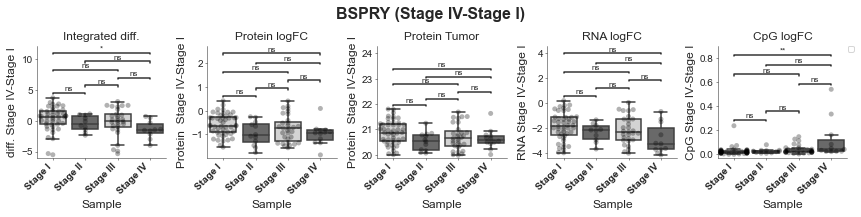

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.049e-01 U_stat=3.150e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.050e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.901e-03 U_stat=2.540e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.120e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.841e-01 U_stat=7.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.128e-04 U_stat=4.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.340e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.840e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.290e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.684e-01 U_stat=9.200e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.600e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.088e-03 U_stat=4.640e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.214e-02 U_stat=3.530e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.339e-01 U_stat=8.500e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.796e-02 U_stat=2.580e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.200e+02


No handles with labels found to put in legend.


Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.308e-03 U_stat=4.380e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000165959-CLMN/pathology/renal+cancer/KIRC


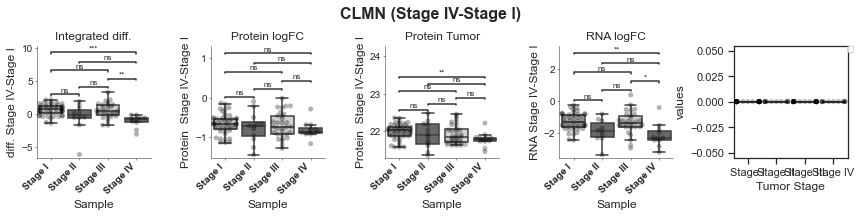

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.510e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.130e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.658e-03 U_stat=2.500e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.860e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.709e-01 U_stat=7.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.252e-03 U_stat=3.780e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.460e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.160e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.620e-01 U_stat=2.610e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.670e+02


No handles with labels found to put in legend.


Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.574e-01 U_stat=1.110e+02
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.633e-01 U_stat=4.080e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.970e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.858e-01 U_stat=9.300e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.404e-02 U_stat=2.550e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.900e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.709e-02 U_stat=1.370e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.561e-02 U_stat=2.770e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.300e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.110e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.880e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000140284-SLC27A2/pathology/renal+cancer/KIRC


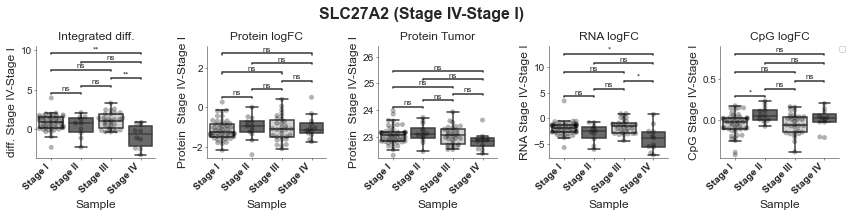

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.355e-01 U_stat=3.300e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.141e-01 U_stat=1.000e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.240e-02 U_stat=2.320e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.570e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.697e-04 U_stat=4.010e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.420e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.776e-01 U_stat=3.640e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.900e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.860e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.973e-01 U_stat=9.570e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.800e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.633e-01 U_stat=4.080e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.054e-02 U_stat=3.750e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.402e-01 U_stat=7.400e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.612e-02 U_stat=2.480e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.160e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.111e-03 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.100e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.084e-01 U_stat=2.470e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.657e-01 U_stat=9.300e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.840e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.220e-01 U_stat=1.630e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000157551-KCNJ15/pathology/renal+cancer/KIRC


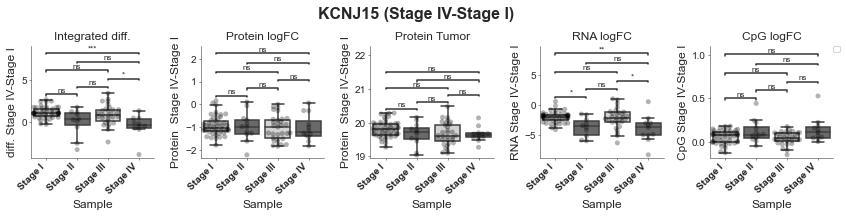

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.818e-01 U_stat=2.980e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.160e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.271e-03 U_stat=2.530e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.050e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.545e-01 U_stat=8.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.441e-04 U_stat=4.030e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.811e-01 U_stat=3.670e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.080e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.200e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.250e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.023e-01 U_stat=9.560e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.415e-01 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.008e-01 U_stat=3.180e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.402e-01 U_stat=7.400e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.195e-02 U_stat=2.520e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.520e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.718e-02 U_stat=3.970e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.133e-03 U_stat=8.100e+01
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.829e-02 U_stat=2.820e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.876e-03 U_stat=4.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.180e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.967e-01 U_stat=4.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.947e-05 U_stat=3.200e+01


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000168065-SLC22A11/pathology/renal+cancer/KIRC


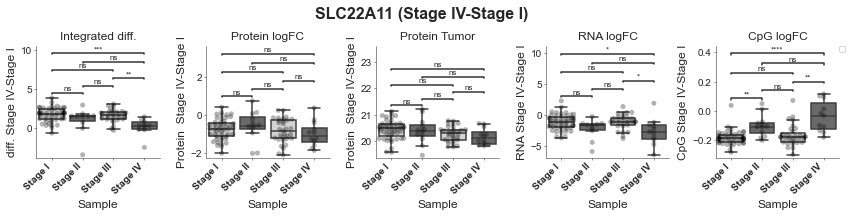

--------------------------------------------------------------------------------
                                     TMDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.241e-01 U_stat=1.500e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.650e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.943e-02 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.584e-03 U_stat=9.700e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.170e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.250e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.569e-01 U_stat=1.200e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.740e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.301e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.095e-01 U_stat=1.220e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.790e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.331e-02 U_stat=5.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.959e-01 U_stat=5.340e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.353e-01 U_stat=2.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.010e-05 U_stat=3.700e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.620e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.040e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.590e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.230e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.510e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000138413-IDH1/pathology/renal+cancer/KIRC


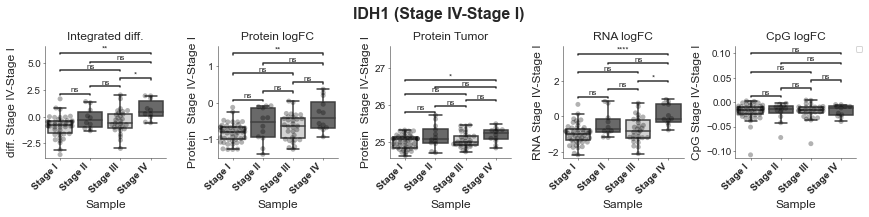

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.557e-01 U_stat=1.600e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.460e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.796e-01 U_stat=7.700e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.125e-02 U_stat=4.290e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.709e-01 U_stat=2.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.530e-03 U_stat=6.700e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.650e-02 U_stat=1.470e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.040e-01 U_stat=1.940e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.180e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.450e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.120e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.641e-01 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.973e-01 U_stat=1.560e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.460e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.044e-02 U_stat=7.200e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.749e-01 U_stat=4.770e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.659e-02 U_stat=1.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.123e-04 U_stat=5.400e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.810e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.760e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.930e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.720e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.790e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000101473-ACOT8/pathology/renal+cancer/KIRC


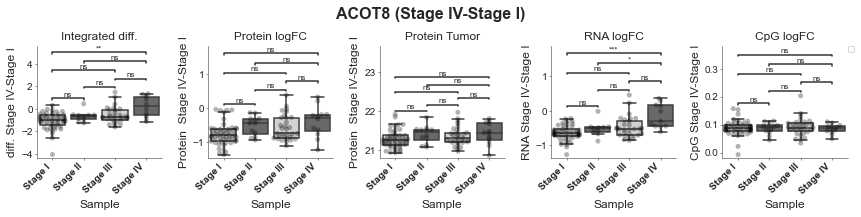

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.770e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.610e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.144e-03 U_stat=3.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.690e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.166e-02 U_stat=1.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.485e-04 U_stat=4.300e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.470e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.811e-01 U_stat=3.670e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.013e-01 U_stat=1.070e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.356e-02 U_stat=2.790e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.340e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.469e-01 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.810e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.760e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.404e-02 U_stat=6.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.590e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.266e-01 U_stat=2.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.958e-03 U_stat=9.200e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000172264-MACROD2/pathology/renal+cancer/KIRC


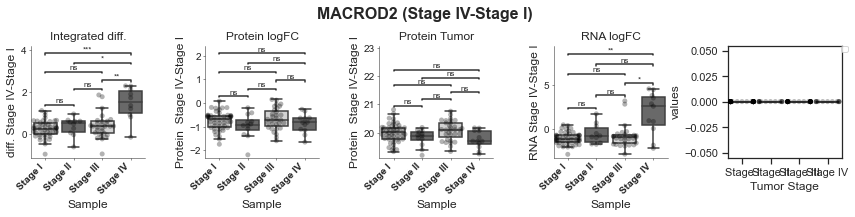

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.912e-01 U_stat=1.400e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.582e-02 U_stat=5.100e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.001e-01 U_stat=5.220e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.545e-01 U_stat=2.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.986e-03 U_stat=6.000e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.108e-02 U_stat=1.190e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.650e-02 U_stat=1.470e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.220e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.500e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.191e-02 U_stat=4.820e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.434e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.800e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.175e-03 U_stat=4.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.310e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.455e-02 U_stat=1.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.814e-03 U_stat=8.900e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.910e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.380e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.820e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.368e-01 U_stat=5.490e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.150e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000159720-ATP6V0D1/pathology/renal+cancer/KIRC


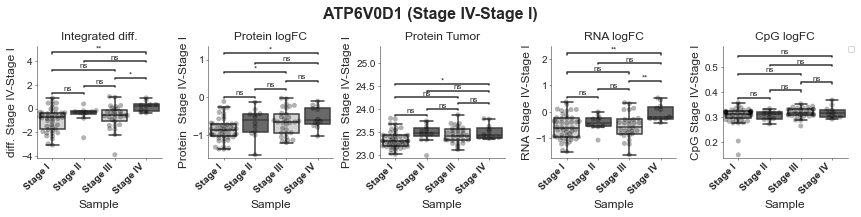

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.990e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.310e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.943e-02 U_stat=6.000e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.610e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.477e-02 U_stat=1.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.002e-03 U_stat=6.500e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.604e-02 U_stat=1.250e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.210e-01 U_stat=2.070e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.110e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.810e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.270e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.570e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.200e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.039e-01 U_stat=8.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.880e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.686e-01 U_stat=2.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.192e-02 U_stat=1.220e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.180e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.549e-01 U_stat=1.140e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.010e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.980e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000243927-MRPS6/pathology/renal+cancer/KIRC


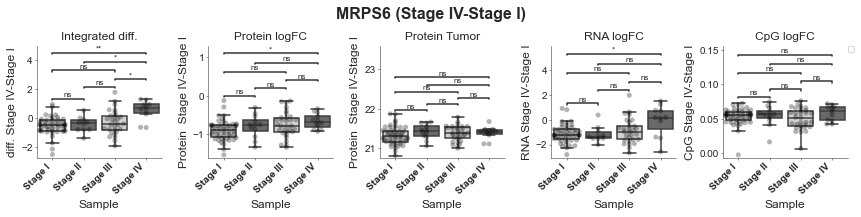

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.780e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.530e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.396e-02 U_stat=2.350e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.750e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.798e-02

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.434e-02 U_stat=4.440e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.280e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.840e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.791e-01 U_stat=2.380e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.710e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.457e-01 U_stat=9.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.366e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.687e-01 U_stat=1.650e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.650e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.513e-02 U_stat=2.460e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.690e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.904e-01 U_stat=8.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.757e-02 U_stat=4.090e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.369e-01 U_stat=3.760e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.480e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.778e-01 U_stat=2.360e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.250e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.375e-02 U_stat=3.960e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000099889-ARVCF/pathology/renal+cancer/KIRC


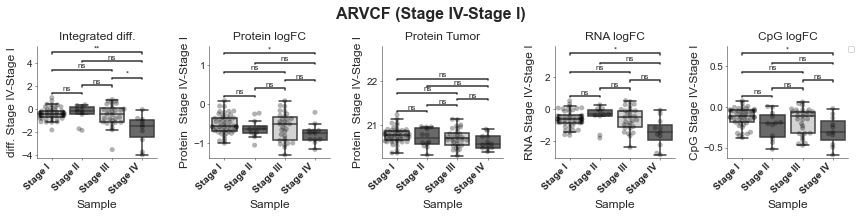

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.370e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.250e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.013e-03 U_stat=2.570e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.690e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.268e-01 U_stat=8.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.416e-03 U_stat=3.940e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.060e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.970e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.850e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.591e-02 U_stat=2.850e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.670e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.138e-01 U_stat=1.040e+02
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.419e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.570e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.180e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.472e-02 U_stat=2.600e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.170e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.069e-01 U_stat=8.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.757e-02 U_stat=4.090e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.210e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.210e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.742e-01 U_stat=1.050e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.940e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.630e-01 U_stat=1.600e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000129151-BBOX1/pathology/renal+cancer/KIRC


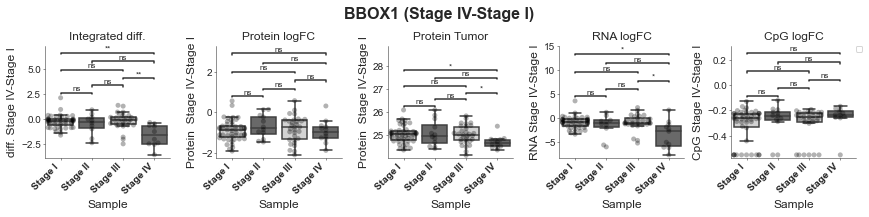

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.760e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.830e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.365e-03 U_stat=2.460e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.520e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.166e-02 U_stat=8.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.158e-03 U_stat=3.740e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.945e-02 U_stat=1.140e+02
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.103e-01 U_stat=3.730e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.469e-01 U_stat=1.770e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.227e-02 U_stat=2.760e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.030e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.110e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.355e-01

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.370e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.070e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.640e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.183e-02 U_stat=2.560e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.570e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.593e-01 U_stat=8.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.130e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.340e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.530e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.768e-01 U_stat=2.240e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.181e-01 U_stat=5.110e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.690e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000176058-TPRN/pathology/renal+cancer/KIRC


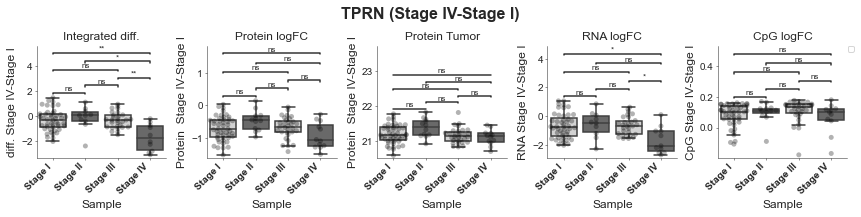

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.093e-03 U_stat=3.970e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.933e-02 U_stat=5.700e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.683e-03 U_stat=2.520e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.330e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.881e-05 U_stat=4.240e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.040e-02 U_stat=4.580e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.419e-02 U_stat=4.530e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.056e-01 U_stat=1.180e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.402e-01 U_stat=2.410e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.680e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.603e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.404e-04 U_stat=4.170e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.277e-02 U_stat=4.900e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.317e-03 U_stat=2.820e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.030e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.314e-04 U_stat=4.730e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000054654-SYNE2/pathology/renal+cancer/KIRC


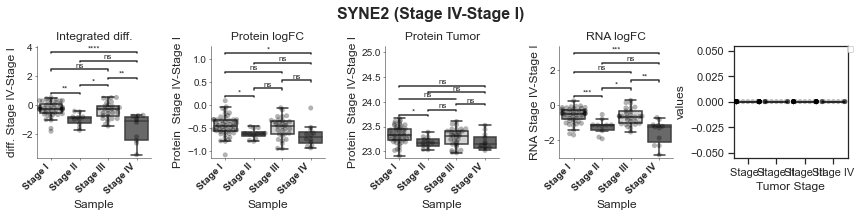

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.505e-02 U_stat=3.640e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.100e-01 U_stat=8.400e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.183e-01 U_stat=2.180e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.690e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.137e-03 U_stat=3.760e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.581e-01 U_stat=3.980e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.770e-03 U_stat=4.780e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.844e-01 U_stat=1.210e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.084e-01 U_stat=2.470e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.186e-02 U_stat=1.000e+03
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.770e-03 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.182e-02 U_stat=3.830e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.864e-01 U_stat=8.700e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.513e-02 U_stat=2.460e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.881e-01 U_stat=8.450e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.111e-03 U_stat=4.340e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.839e-01 U_stat=3.730e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.056e-01 U_stat=1.180e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.950e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.550e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.800e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.640e+02
https://www.proteinatlas.org/ENSG00000164035-EMCN/pathology/renal+cancer/KIRC


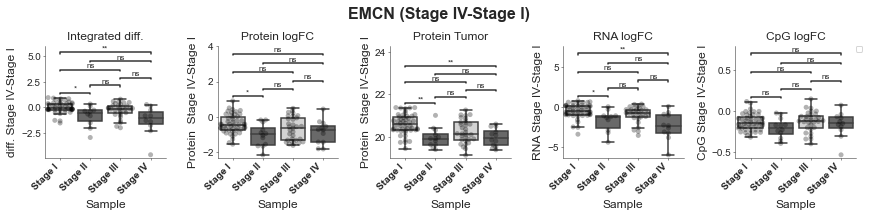

--------------------------------------------------------------------------------
                                     TMDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.770e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.600e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.773e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.650e-02 U_stat=1.470e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.133e-01 U_stat=2.500e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.818e-01 U_stat=1.170e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.390e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.962e-02 U_stat=1.480e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.840e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.560e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.331e-02 U_stat=5.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.780e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.168e-01 U_stat=2.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.006e-04 U_stat=4.100e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.140e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.270e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.104e-01 U_stat=2.390e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.630e-02 U_stat=9.700e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.481e-01 U_stat=1.030e+02


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.146e-02 U_stat=4.070e+02
https://www.proteinatlas.org/ENSG00000101294-HM13/pathology/renal+cancer/KIRC


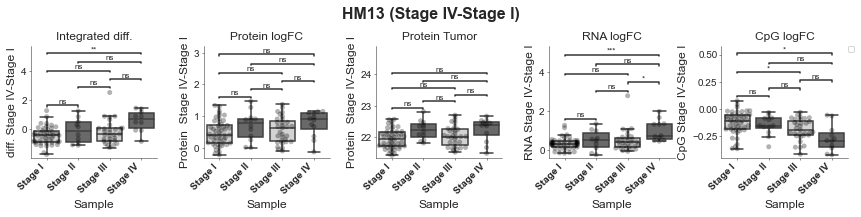

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.020e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.250e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.183e-01 U_stat=7.200e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.414e-01 U_stat=4.990e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.709e-01 U_stat=2.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.335e-03 U_stat=7.800e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.420e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.930e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.660e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.470e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.430e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.160e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.707e-01 U_stat=1.010e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.089e-01 U_stat=8.100e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.146e-01 U_stat=5.110e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.074e-02 U_stat=2.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.035e-02 U_stat=1.000e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.195e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.940e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.120e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.410e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.303e-01 U_stat=3.670e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000072274-TFRC/pathology/renal+cancer/KIRC


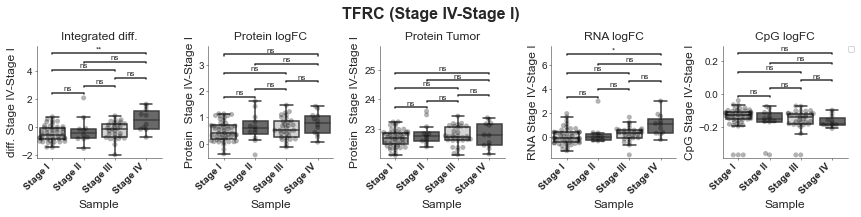

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.930e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.570e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.146e-02 U_stat=4.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.320e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.709e-01 U_stat=2.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.548e-03 U_stat=6.300e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.580e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.080e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.400e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.180e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.844e-01 U_stat=1.930e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.070e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.610e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.612e-02 U_stat=7.100e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.740e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.593e-01 U_stat=2.300e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.098e-02 U_stat=1.170e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.280e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.150e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.970e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.780e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000116133-DHCR24/pathology/renal+cancer/KIRC


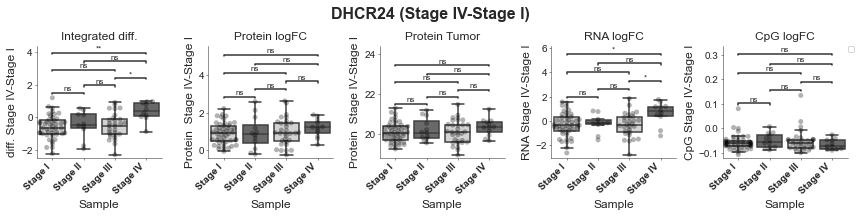

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.670e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.594e-01 U_stat=9.700e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.100e-01 U_stat=8.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.480e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.873e-01 U_stat=2.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.508e-02 U_stat=1.020e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.138e-01 U_stat=4.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.190e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.960e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.795e-01 U_stat=1.120e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.410e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.774e-02 U_stat=4.960e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.355e-01

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.160e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.380e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.500e-01 U_stat=8.500e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.970e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.168e-01 U_stat=2.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.647e-02 U_stat=1.070e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.080e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.440e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.840e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.460e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.490e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000184575-XPOT/pathology/renal+cancer/KIRC


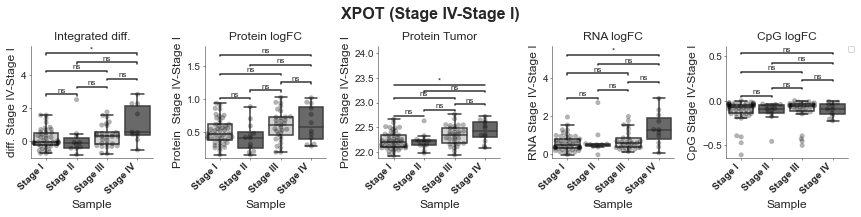

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.950e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.440e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.101e-02 U_stat=6.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.940e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.873e-01 U_stat=2.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.159e-03 U_stat=6.100e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.240e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.030e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.938e-02 U_stat=9.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.320e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.823e-01 U_stat=3.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.158e-04 U_stat=7.500e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.950e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.270e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.197e-01 U_stat=9.000e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.245e-01 U_stat=5.120e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.266e-01 U_stat=2.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.876e-03 U_stat=8.600e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.065e-01 U_stat=1.520e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.844e-01 U_stat=2.510e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.700e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.800e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.390e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000083444-PLOD1/pathology/renal+cancer/KIRC


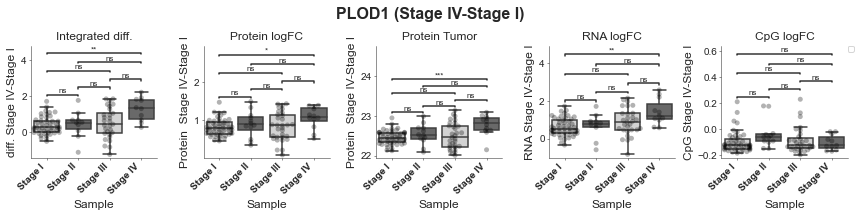

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.804e-01 U_stat=2.920e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.682e-01 U_stat=9.500e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.238e-03 U_stat=2.450e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.120e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.258e-01

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.320e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.360e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.220e-03 U_stat=3.180e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.850e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.424e-01 U_stat=1.080e+02


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.562e-03 U_stat=4.630e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.793e-01 U_stat=3.390e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.875e-01 U_stat=8.300e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.044e-02 U_stat=2.470e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.510e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.718e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.670e-03 U_stat=9.700e+01
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.938e-02 U_stat=2.780e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.714e-01 U_stat=1.000e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.460e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.656e-03 U_stat=8.300e+01


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000109756-RAPGEF2/pathology/renal+cancer/KIRC


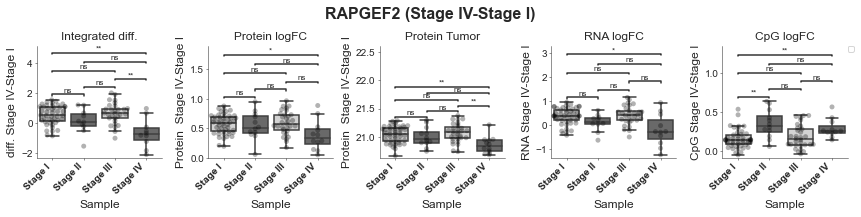

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.688e-03 U_stat=3.700e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.875e-01 U_stat=8.300e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.183e-01 U_stat=2.180e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.570e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.988e-03 U_stat=3.710e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.530e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.580e-02 U_stat=4.430e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.792e-01 U_stat=1.270e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.210e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.500e+02


No handles with labels found to put in legend.


Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.347e-01 U_stat=3.920e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.257e-03 U_stat=3.880e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.947e-01 U_stat=7.800e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.568e-02 U_stat=2.440e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.830e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.550e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.847e-01 U_stat=1.320e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.080e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.944e-02 U_stat=4.740e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.060e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000136160-EDNRB/pathology/renal+cancer/KIRC


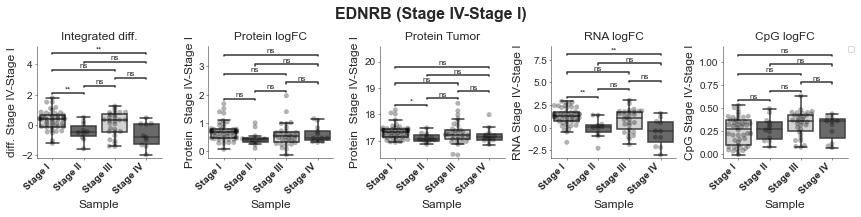

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.207e-02 U_stat=3.430e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.707e-01 U_stat=1.010e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.402e-01 U_stat=2.160e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.420e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.988e-03 U_stat=3.710e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.354e-02 U_stat=4.300e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.255e-02 U_stat=4.550e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.752e-01 U_stat=1.240e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.320e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.800e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.200e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.712e-01 U_stat=4.070e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.624e-01 U_stat=3.250e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.150e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.623e-01 U_stat=2.220e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.020e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.130e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.220e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.670e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.640e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.088e-01 U_stat=5.250e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.035e-01 U_stat=1.620e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000104967-NOVA2/pathology/renal+cancer/KIRC


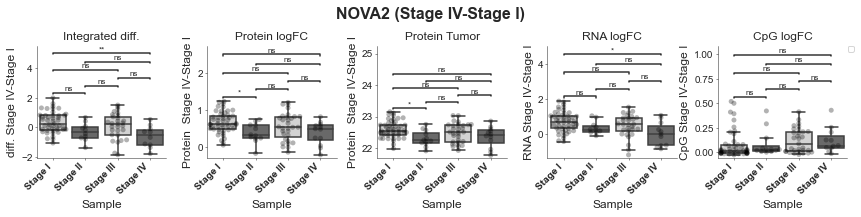

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.241e-01 U_stat=3.000e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.858e-01 U_stat=9.300e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.255e-02 U_stat=2.270e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.330e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.810e-02 U_stat=3.470e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.300e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.190e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.470e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.595e-02 U_stat=2.880e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.200e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.300e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.108e-01 U_stat=4.160e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.296e-01 U_stat=3.450e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.339e-01 U_stat=8.500e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.879e-01 U_stat=2.210e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.530e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.898e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.050e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.130e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.824e-01 U_stat=1.120e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.380e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.076e-01 U_stat=1.480e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000068650-ATP11A/pathology/renal+cancer/KIRC


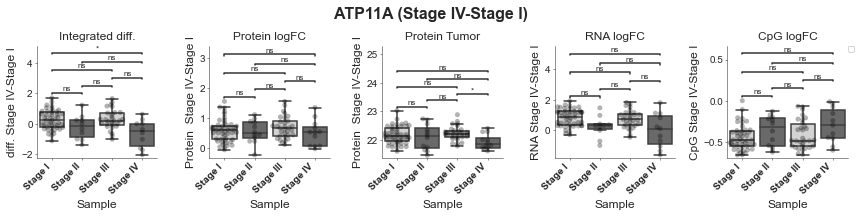

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.610e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.380e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.085e-01 U_stat=2.190e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.400e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.709e-01 U_stat=7.700e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.302e-02 U_stat=3.660e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.300e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.480e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.564e-01 U_stat=2.430e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.510e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.500e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.450e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.980e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.380e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.365e-01 U_stat=2.280e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.830e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.098e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.953e-02 U_stat=4.230e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.522e-02 U_stat=7.400e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.660e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.354e-01 U_stat=3.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.430e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000138185-ENTPD1/pathology/renal+cancer/KIRC


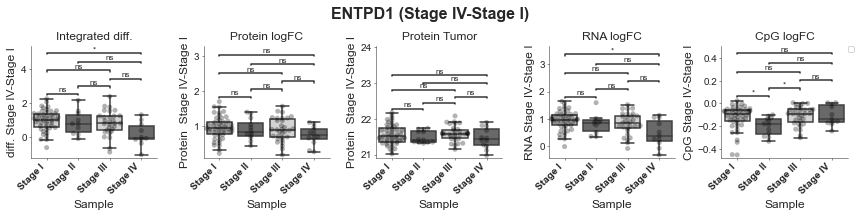

--------------------------------------------------------------------------------
                                      MDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.200e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.620e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.779e-03 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.760e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.130e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.580e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.880e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.400e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.670e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.990e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.870e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.938e-01 U_stat=9.400e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.710e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.283e-01 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.810e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.640e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.567e-01 U_stat=2.330e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.330e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.233e-01 U_stat=3.270e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000013588-GPRC5A/pathology/renal+cancer/KIRC


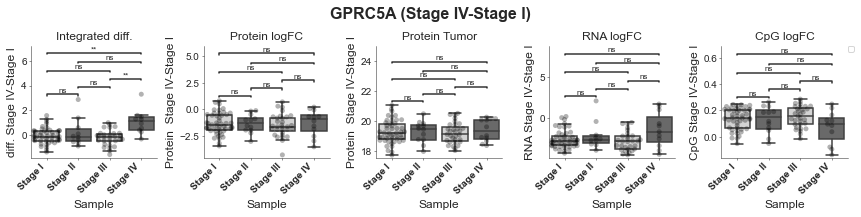

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.820e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.630e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.947e-01 U_stat=7.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.190e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.540e-01 U_stat=2.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.027e-02 U_stat=9.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.480e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.910e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.390e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.680e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.100e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.116e-01 U_stat=1.990e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.720e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.450e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.381e-01 U_stat=9.600e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.109e-01 U_stat=5.200e+02


No handles with labels found to put in legend.


Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.878e-01 U_stat=3.100e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.266e-02 U_stat=1.030e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.230e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.670e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.937e-01 U_stat=2.260e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.843e-01 U_stat=5.670e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.967e-01

No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000115556-PLCD4/pathology/renal+cancer/KIRC


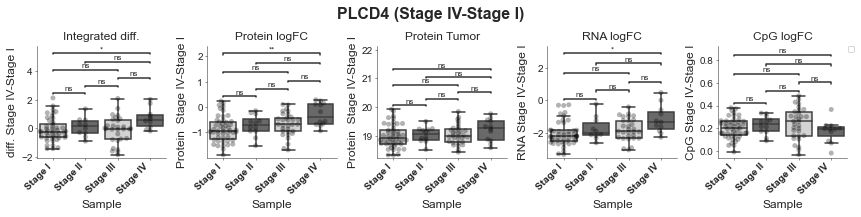

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.897e-01 U_stat=1.340e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.665e-01 U_stat=2.080e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.940e-02 U_stat=7.000e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.950e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.000e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.012e-01 U_stat=1.150e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.849e-04 U_stat=6.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.450e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.978e-01 U_stat=2.590e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.237e-01 U_stat=1.000e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.740e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.800e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.242e-01 U_stat=1.950e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.787e-01 U_stat=1.510e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.810e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.230e-02 U_stat=7.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.890e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.722e-01 U_stat=2.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.037e-03 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.820e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.580e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.040e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.320e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.800e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000100473-COCH/pathology/renal+cancer/KIRC


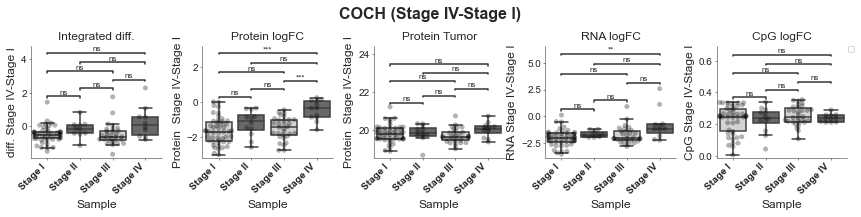

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.804e-01 U_stat=1.580e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.858e-01 U_stat=1.970e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.277e-02 U_stat=4.900e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.360e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.234e-01 U_stat=2.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.146e-02 U_stat=9.100e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.060e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.180e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.084e-01 U_stat=1.250e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.732e-02 U_stat=1.017e+03
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+01


No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.840e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.920e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.410e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.780e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.932e-01 U_stat=8.170e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.028e-01 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.010e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.710e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.937e-01 U_stat=2.260e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.920e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.685e-01 U_stat=3.460e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000175315-CST6/pathology/renal+cancer/KIRC


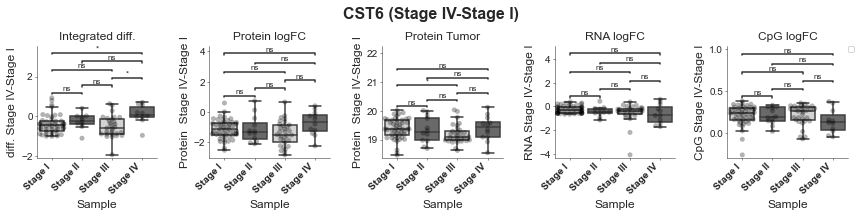

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.571e-04 U_stat=3.700e+01
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.207e-03 U_stat=2.440e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.151e-01 U_stat=8.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.370e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.338e-01 U_stat=7.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.400e-02 U_stat=8.500e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.348e-01 U_stat=1.640e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.013e-01 U_stat=2.650e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.847e-01 U_stat=1.320e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.090e+02


No handles with labels found to put in legend.


Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.040e-01 U_stat=1.940e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.054e-02 U_stat=9.500e+01
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.820e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.600e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.718e-03 U_stat=3.670e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.040e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.480e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.090e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.940e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.970e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000115255-REEP6/pathology/renal+cancer/KIRC


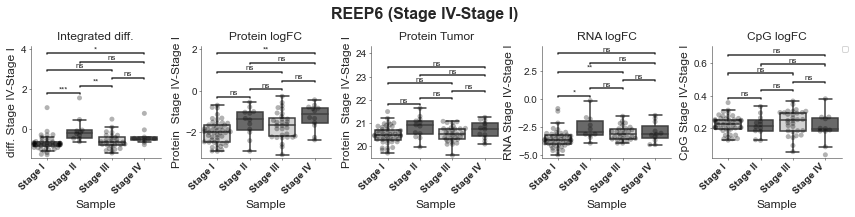

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.820e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.240e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.951e-02 U_stat=2.370e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.410e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.428e-01

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.550e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.650e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.370e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.310e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.655e-01 U_stat=3.840e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.820e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.230e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.153e-01 U_stat=2.240e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.890e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.931e-01 U_stat=3.670e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.817e-01 U_stat=1.720e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.056e-01 U_stat=2.540e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.418e-03 U_stat=5.200e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.040e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.251e-04 U_stat=5.600e+01


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000253313-C1orf210/pathology/renal+cancer/KIRC


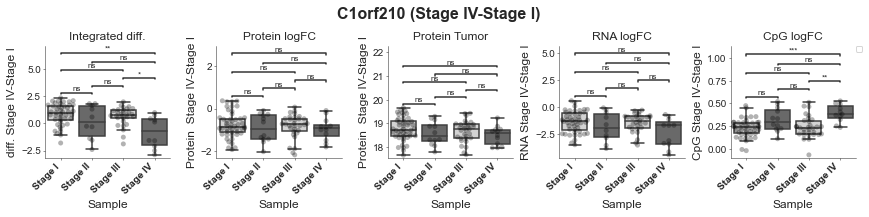

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.223e-02 U_stat=3.490e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.070e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.396e-02 U_stat=2.350e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.699e-01 U_stat=8.120e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.800e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.221e-05 U_stat=4.340e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.581e-01 U_stat=3.980e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.759e-02 U_stat=4.230e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.430e-01 U_stat=1.260e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.040e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.480e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.095e-03 U_stat=4.010e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.777e-01 U_stat=9.000e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.230e-02 U_stat=2.400e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.467e-01 U_stat=8.730e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.598e-04 U_stat=4.560e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.100e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.890e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.600e-02 U_stat=6.500e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.486e-01 U_stat=5.500e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.354e-01 U_stat=3.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.363e-04 U_stat=4.300e+01


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000074527-NTN4/pathology/renal+cancer/KIRC


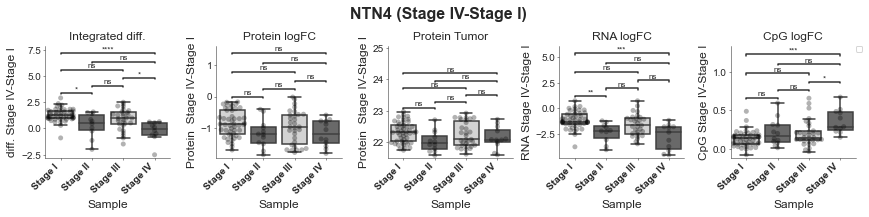

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.074e-01 U_stat=3.340e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.070e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.524e-01 U_stat=2.150e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.163e-01 U_stat=8.170e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.629e-03 U_stat=3.750e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.557e-01 U_stat=1.670e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.800e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.170e-01 U_stat=2.440e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.470e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.569e-01 U_stat=9.660e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.900e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.880e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.118e-01 U_stat=9.100e+01
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.153e-01 U_stat=2.240e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.880e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.028e-01 U_stat=3.380e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.652e-03 U_stat=8.600e+01
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.377e-01 U_stat=2.570e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.095e-02 U_stat=7.800e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.394e-01 U_stat=4.940e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=4.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.251e-04 U_stat=5.600e+01


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000114378-HYAL1/pathology/renal+cancer/KIRC


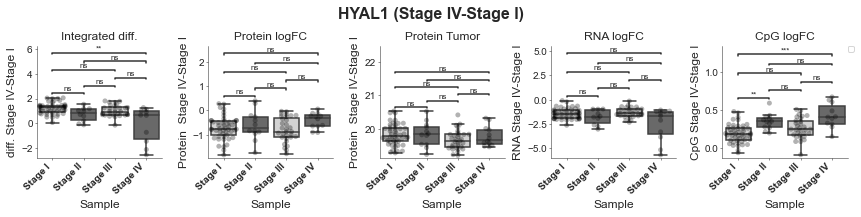

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.490e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.320e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.220e-03 U_stat=2.610e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.700e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.798e-02 U_stat=8.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.697e-04 U_stat=4.010e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.830e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.844e-01 U_stat=1.930e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.150e-01 U_stat=2.730e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.790e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.720e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.945e-02 U_stat=1.140e+02
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.250e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.220e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.488e-02 U_stat=2.410e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.733e-01 U_stat=4.940e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.500e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.230e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.083e-01 U_stat=1.740e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.280e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.602e-03 U_stat=4.700e+01
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.560e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.454e-02 U_stat=2.200e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.093e-05 U_stat=3.000e+01


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000143845-ETNK2/pathology/renal+cancer/KIRC


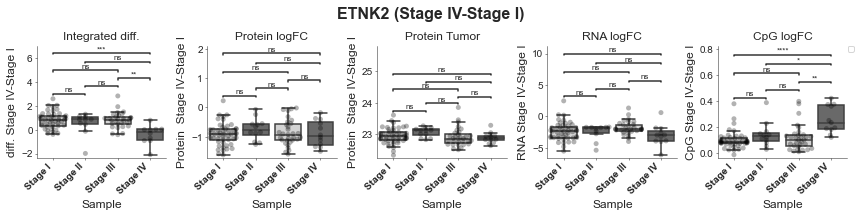

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.752e-01 U_stat=3.170e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.210e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.396e-02 U_stat=2.350e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.660e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.600e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.002e-03 U_stat=3.850e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 

No handles with labels found to put in legend.


Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=3.050e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.670e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.140e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.818e-01 U_stat=2.550e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.120e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.186e-01 U_stat=1.060e+02
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.759e-02 

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.500e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.370e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.273e-01 U_stat=2.070e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.860e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=6.300e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.983e-01 U_stat=3.420e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Stage I v.s. Stage II: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.702e-02 U_stat=1.200e+02
Stage II v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.300e-01 U_stat=2.630e+02
Stage III v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.178e-01 U_stat=1.130e+02
Stage I v.s. Stage III: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=5.820e+02
Stage II v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.400e+01
Stage I v.s. Stage IV: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.258e-02 U_stat=1.150e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000136883-KIF12/pathology/renal+cancer/KIRC


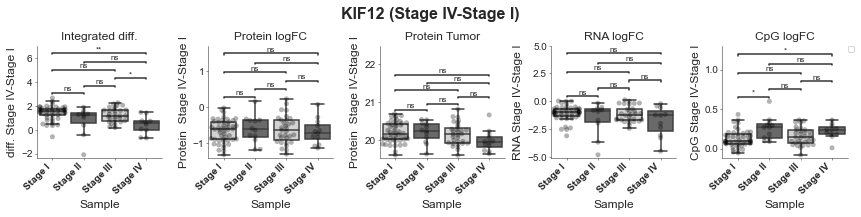

--------------------------------------------------------------------------------
                                      MDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.050e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.222e-02 U_stat=8.200e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.326e-02 U_stat=4.000e+01
p-va

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.570e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.711e-03 U_stat=4.080e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.015e-01 U_stat=1.970e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.002e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.665e-02 U_stat=3.520e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.867e-02 U_stat=1.960e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.301e-01 U_stat=1.139e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.601e-01 U_stat=1.380e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.302e-01 U_stat=9.300e+01
https://www.proteinatlas.org/ENSG00000134278-SPIRE1/pathology/renal+cancer/KIRC


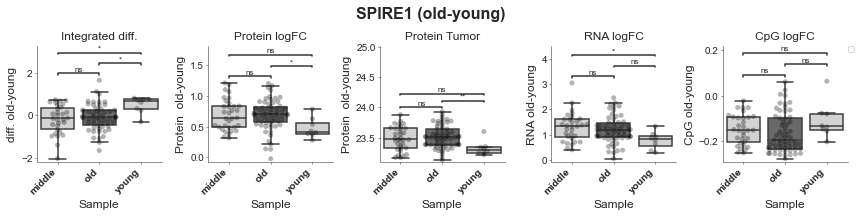

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.301e-01 U_stat=1.002e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.448e-02 U_stat=9.900e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.580e-01 U_stat=7.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.010e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.711e-03 U_stat=4.080e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.269e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.714e-01 U_stat=8.550e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.048e-02 U_stat=3.780e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.544e-01 U_stat=1.800e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.261e-01 U_stat=7.280e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.790e-01 U_stat=3.180e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.370e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.380e-01 U_stat=1.154e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.768e-01 U_stat=1.710e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.230e+02
https://www.proteinatlas.org/ENSG00000130731-METTL26/pathology/renal+cancer/KIRC


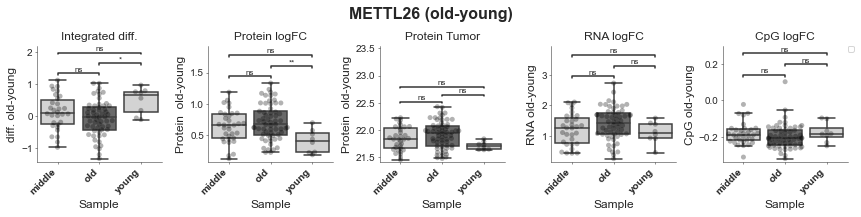

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.659e-01 U_stat=6.280e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.162e-03 U_stat=3.820e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.704e-02 U_stat=1.860e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.120e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.799e-02 U_stat=1.170e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.353e-02 U_stat=6.600e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.008e-01 U_stat=1.060e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.732e-02 U_stat=9.100e+01


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.162e-02 U_stat=6.000e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.250e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.830e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.500e+02
https://www.proteinatlas.org/ENSG00000115085-ZAP70/pathology/renal+cancer/KIRC


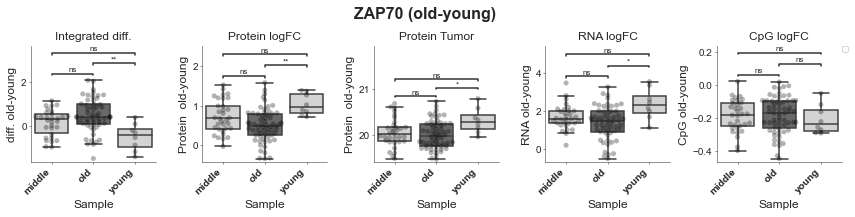

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.206e-01 U_stat=6.420e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.222e-02 U_stat=3.660e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.662e-01 U_stat=1.740e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.229e-01 U_stat=1.285e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.093e-02 U_stat=9.000e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.352e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.997e-01 U_stat=1.234e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.108e-03 U_stat=8.500e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.101e-01 U_stat=6.800e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.797e-01 U_stat=1.118e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.291e-02 U_stat=1.140e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.198e-01 U_stat=7.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.318e-02 U_stat=6.910e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.205e-01 U_stat=3.180e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.280e+02
https://www.proteinatlas.org/ENSG00000197142-ACSL5/pathology/renal+cancer/KIRC


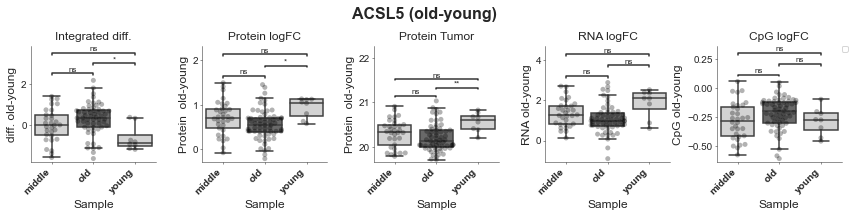

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.433e-01 U_stat=6.470e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.306e-03 U_stat=3.760e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.483e-02 U_stat=1.990e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.204e-02 U_stat=1.300e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.264e-03 U_stat=7.800e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.994e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.074e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.307e-02 U_stat=1.190e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.015e-01 U_stat=6.700e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.890e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.358e-02 U_stat=8.700e+01


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.870e-02 U_stat=4.900e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.760e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.229e-02 U_stat=1.210e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.682e-01 U_stat=7.100e+01
https://www.proteinatlas.org/ENSG00000160654-CD3G/pathology/renal+cancer/KIRC


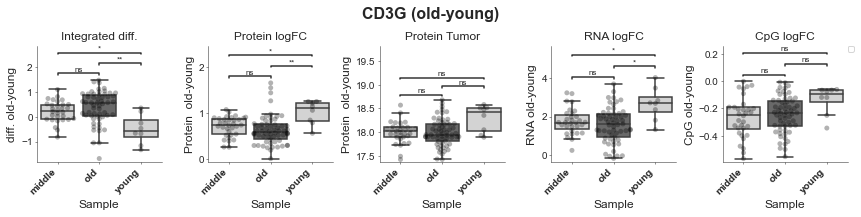

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.340e-01 U_stat=6.450e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.254e-03 U_stat=3.720e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.086e-01 U_stat=1.790e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.171e-02 U_stat=1.306e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.965e-03 U_stat=8.000e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.103e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.252e-01 U_stat=1.197e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.135e-01 U_stat=1.350e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.782e-01 U_stat=8.500e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.191e-01 U_stat=1.071e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.105e-02 U_stat=1.010e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.741e-01 U_stat=6.900e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.150e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.670e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.370e+02
https://www.proteinatlas.org/ENSG00000100351-GRAP2/pathology/renal+cancer/KIRC


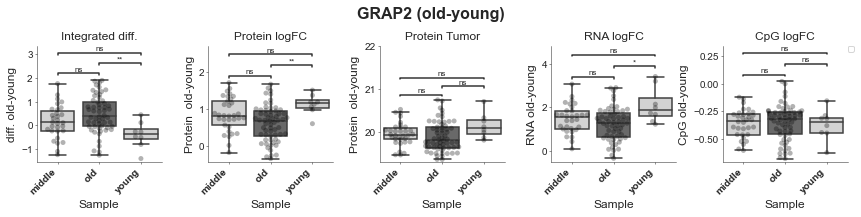

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.792e-01 U_stat=7.060e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.728e-02 U_stat=3.530e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.569e-02 U_stat=1.830e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.749e-01 U_stat=1.204e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.558e-02 U_stat=1.050e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.292e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.906e-01 U_stat=1.177e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.071e-01 U_stat=1.490e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.033e-01 U_stat=8.600e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.280e-01 U_stat=1.026e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.373e-02 U_stat=1.110e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.036e-01 U_stat=7.100e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.051e-02 U_stat=6.460e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.014e-01 U_stat=3.520e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.540e+02
https://www.proteinatlas.org/ENSG00000116824-CD2/pathology/renal+cancer/KIRC


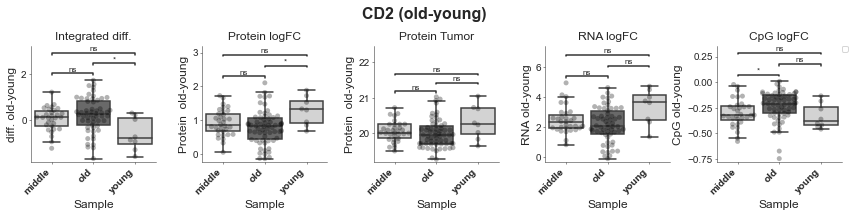

--------------------------------------------------------------------------------
                                     TPDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.286e-02 U_stat=1.

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.370e-01 U_stat=1.162e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.711e-03 U_stat=8.800e+01


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.943e-02 U_stat=5.300e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.032e-03 U_stat=1.244e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.312e-04 U_stat=3.800e+01


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.376e-02 U_stat=4.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000132274-TRIM22/pathology/renal+cancer/KIRC


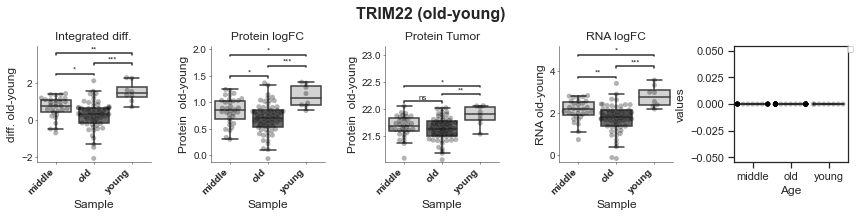

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.293e-01 U_stat=1.017e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.465e-03 U_stat=6.700e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.549e-02 U_stat=4.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.121e-01 U_stat=1.186e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.587e-03 U_stat=6.700e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.201e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.915e-01 U_stat=1.148e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.590e-03 U_stat=7.200e+01


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.269e-02 U_stat=6.300e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.921e-01 U_stat=1.092e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.095e-02 U_stat=1.100e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.198e-01 U_stat=7.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000182866-LCK/pathology/renal+cancer/KIRC


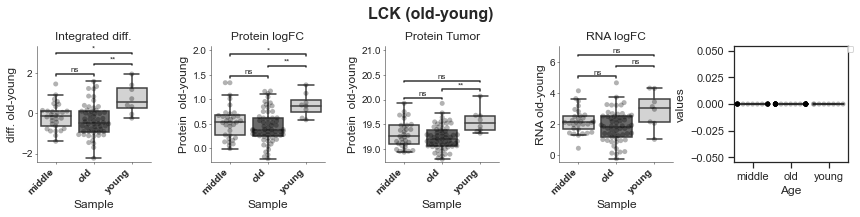

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.102e-01 U_stat=1.071e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.519e-03 U_stat=5.900e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.696e-02 U_stat=5.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.674e-01 U_stat=1.241e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.335e-02 U_stat=1.150e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.814e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.848e-02 U_stat=1.302e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.630e-03 U_stat=8.400e+01


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.193e-01 U_stat=6.900e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.386e-01 U_stat=1.131e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.604e-03 U_stat=6.200e+01


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.867e-02 U_stat=5.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000142089-IFITM3/pathology/renal+cancer/KIRC


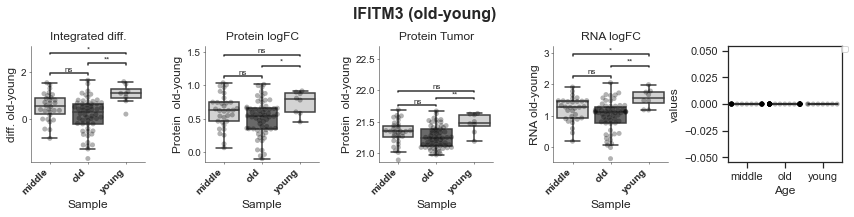

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.813e-03 U_stat=1.219e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.364e-03 U_stat=6.300e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.580e-01 U_stat=7.600e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.252e-02 U_stat=1.390e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.053e-02 U_stat=1.010e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.567e-01 U_stat=1.223e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.070e-01 U_stat=1.590e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.220e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.501e-02 U_stat=1.149e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.095e-02 U_stat=1.100e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.417e-01 U_stat=8.500e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.960e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.904e-01 U_stat=3.380e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.240e-01 U_stat=1.720e+02
https://www.proteinatlas.org/ENSG00000124575-H1-3/pathology/renal+cancer/KIRC


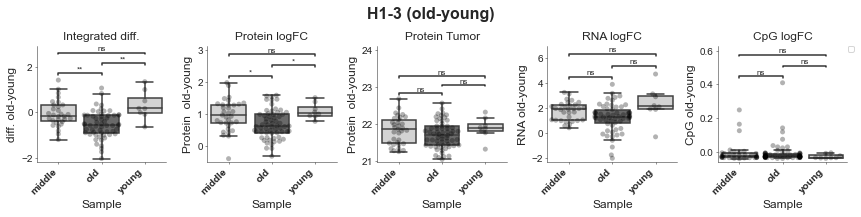

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.986e-04 U_stat=1.270e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.285e-03 U_stat=5.000e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.407e-01 U_stat=6.400e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.179e-03 U_stat=1.477e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.108e-03 U_stat=8.500e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.002e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.189e-02 U_stat=1.338e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.135e-01 U_stat=1.350e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.190e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.553e-02 U_stat=1.173e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.329e-02 U_stat=9.600e+01


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.128e-01 U_stat=8.700e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.445e-01 U_stat=7.470e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.910e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.340e+02
https://www.proteinatlas.org/ENSG00000184357-H1-5/pathology/renal+cancer/KIRC


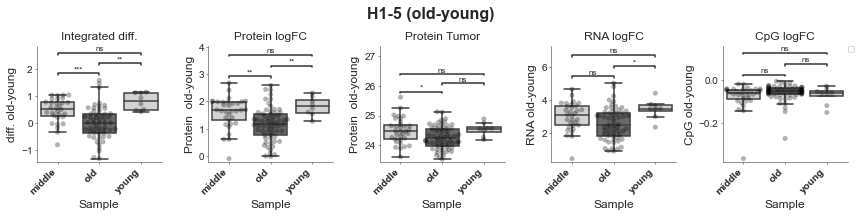

--------------------------------------------------------------------------------
                                     TPDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     TMDS	                                      
--------------------------------------------------------------------------------
----------------------------

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.266e-01 U_stat=8.830e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.141e-03 U_stat=4.410e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.201e-02 U_stat=2.140e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.788e-03 U_stat=5.140e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.426e-03 U_stat=4.030e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.155e-01 U_stat=1.840e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000162972-MAIP1/pathology/renal+cancer/KIRC


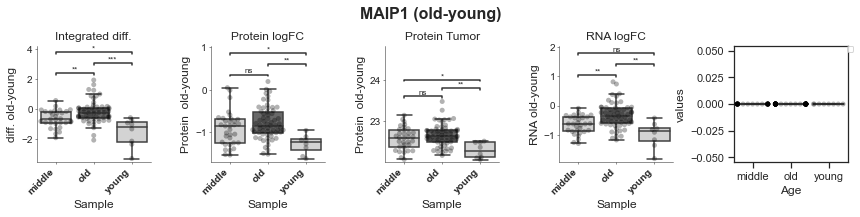

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.625e-01 U_stat=6.270e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.613e-03 U_stat=3.840e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.569e-02 U_stat=1.830e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.351e-01 U_stat=8.190e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.312e-03 U_stat=4.390e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.039e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.040e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.137e-04 U_stat=4.550e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.986e-03 U_stat=2.360e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.501e-02 U_stat=6.490e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.626e-02 U_stat=3.490e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.663e-01 U_stat=1.550e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.012e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.465e-01 U_stat=1.830e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.090e+02
https://www.proteinatlas.org/ENSG00000144827-ABHD10/pathology/renal+cancer/KIRC


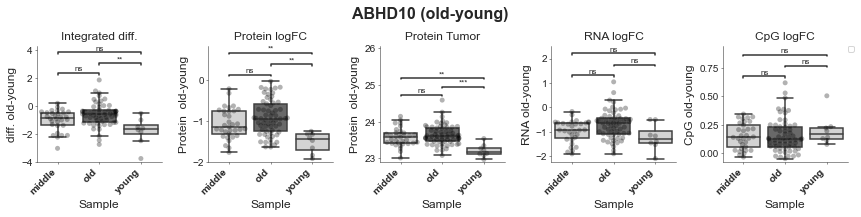

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=7.730e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.364e-03 U_stat=3.850e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.326e-02 U_stat=2.000e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.220e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.640e-02 U_stat=3.990e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.670e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.026e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.170e-02 U_stat=3.940e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.994e-02 U_stat=2.150e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.840e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.469e-02 U_stat=3.670e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.218e-02 U_stat=1.910e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.290e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.050e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.020e+02
https://www.proteinatlas.org/ENSG00000168827-GFM1/pathology/renal+cancer/KIRC


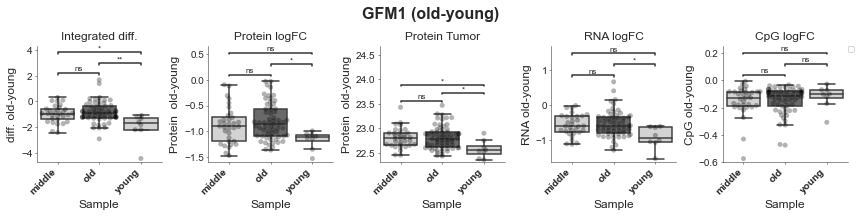

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.277e-03 U_stat=5.130e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.285e-03 U_stat=3.980e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.878e-01 U_stat=1.670e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.015e-01 U_stat=7.510e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.907e-01 U_stat=3.490e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.020e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.799e-01 U_stat=3.140e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.480e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.689e-02 U_stat=5.770e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.536e-03 U_stat=3.910e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.554e-01 U_stat=1.740e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.992e-01 U_stat=8.330e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.388e-01 U_stat=3.110e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.480e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000115364-MRPL19/pathology/renal+cancer/KIRC


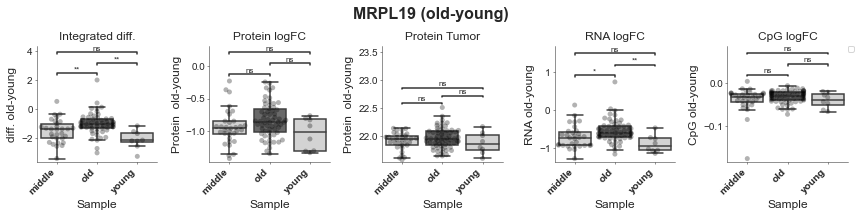

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.887e-03 U_stat=5.030e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.428e-04 U_stat=4.020e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.326e-02 U_stat=2.000e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.157e-01 U_stat=8.330e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.630e-03 U_stat=4.120e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.682e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.121e-01 U_stat=8.600e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.381e-02 U_stat=4.020e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.682e-02 U_stat=2.060e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.109e-03 U_stat=4.850e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.360e-03 U_stat=4.110e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.155e-01 U_stat=1.840e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.198e-02 U_stat=6.480e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.111e-02 U_stat=3.700e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.556e-01 U_stat=1.580e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000144381-HSPD1/pathology/renal+cancer/KIRC


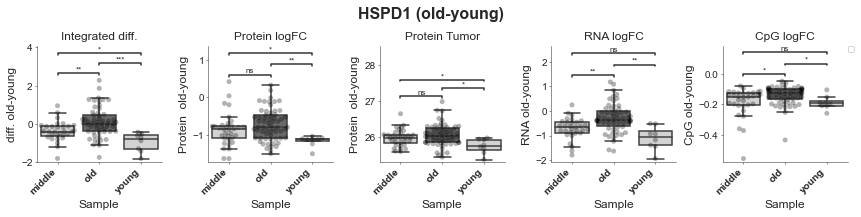

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.410e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.388e-02 U_stat=8.400e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.849e-02 U_stat=5.000e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.111e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.422e-02 U_stat=1.040e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.036e-01 U_stat=7.600e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=9.030e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.665e-02 U_stat=1.120e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.870e-02 U_stat=4.900e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000007062-PROM1/pathology/renal+cancer/KIRC


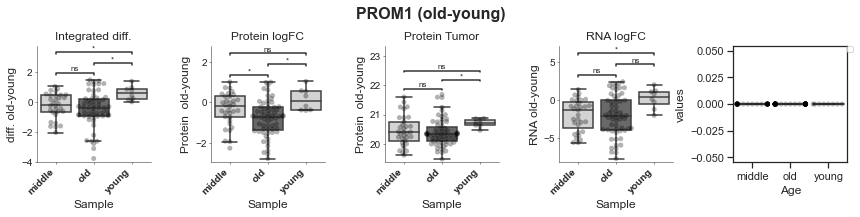

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.701e-05 U_stat=1.305e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.898e-02 U_stat=8.900e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.100e+02
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.367e-05 U_stat=1.610e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.171e-02 U_stat=1.090e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.227e-04 U_stat=1.489e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.118e-01 U_stat=1.670e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.482e-01 U_stat=1.730e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.447e-04 U_stat=1.357e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.732e-02 U_stat=9.100e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.080e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.957e-01 U_stat=7.580e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.780e+02


No handles with labels found to put in legend.


middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.140e+02
https://www.proteinatlas.org/ENSG00000187955-COL14A1/pathology/renal+cancer/KIRC


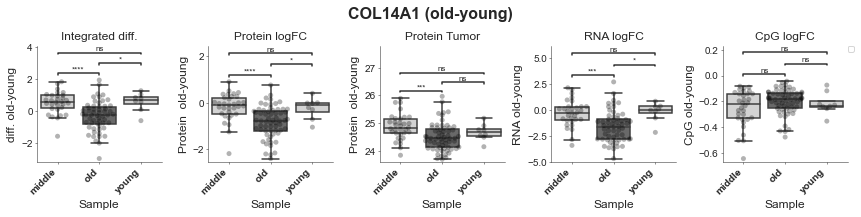

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.133e-02 U_stat=1.090e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.364e-03 U_stat=6.300e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.185e-01 U_stat=6.200e+01
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.106e-02 U_stat=1.395e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.152e-03 U_stat=7.000e+01
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.892e-

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.997e-01 U_stat=1.234e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.422e-02 U_stat=1.040e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.318e-01 U_stat=8.300e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.711e-02 U_stat=1.153e+03
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.333e-02 U_stat=1.070e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.417e-01 U_stat=8.500e+01


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

middle v.s. old: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=8.710e+02
old v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=2.880e+02
middle v.s. young: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.000e+00 U_stat=1.420e+02


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000160307-S100B/pathology/renal+cancer/KIRC


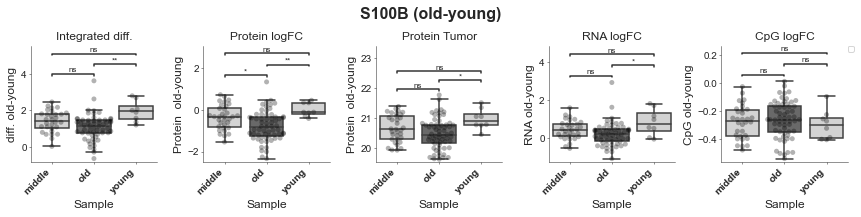

--------------------------------------------------------------------------------
                                     TMDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                      MDS	                                      
--------------------------------------------------------------------------------
----------------------------

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.743e-02 U_stat=1.292e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.912e-03 U_stat=1.372e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.385e-04 U_stat=1.316e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.218e-01 U_stat=9.490e+02
https://www.proteinatlas.org/ENSG00000021826-CPS1/pathology/renal+cancer/KIRC


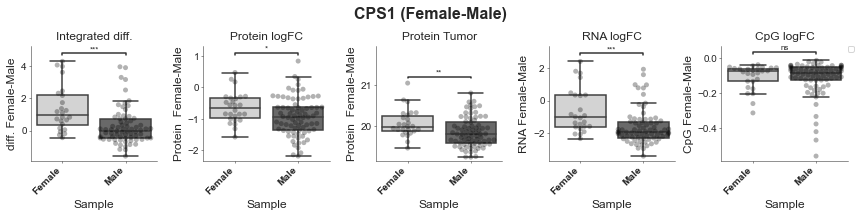

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.656e-05 U_stat=1.325e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.246e-03 U_stat=1.404e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.018e-02 U_stat=1.340e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.656e-03 U_stat=1.215e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.558e-01 U_stat=8.440e+02
https://www.proteinatlas.org/ENSG00000172940-SLC22A13/pathology/renal+cancer/KIRC


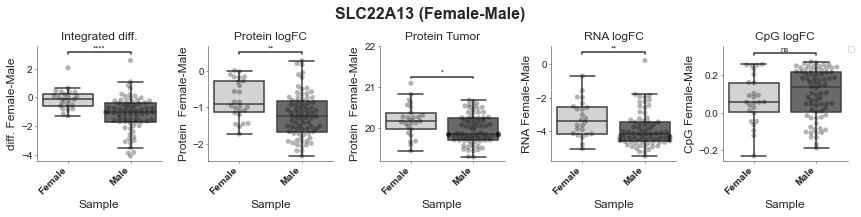

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.405e-04 U_stat=1.264e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.291e-02 U_stat=1.329e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.738e-03 U_stat=1.342e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.789e-05 U_stat=1.353e+03
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000103647-CORO2B/pathology/renal+cancer/KIRC


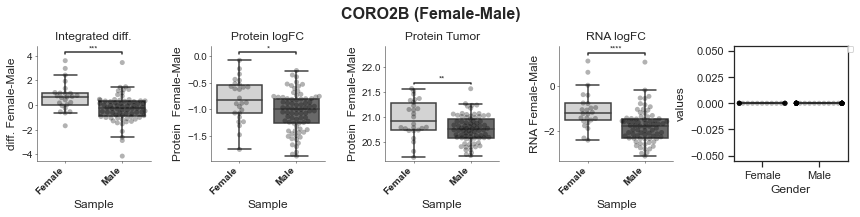

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.793e-04 U_stat=1.228e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.841e-02 U_stat=1.312e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.060e-03 U_stat=1.380e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.309e-03 U_stat=1.241e+03
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000135540-NHSL1/pathology/renal+cancer/KIRC


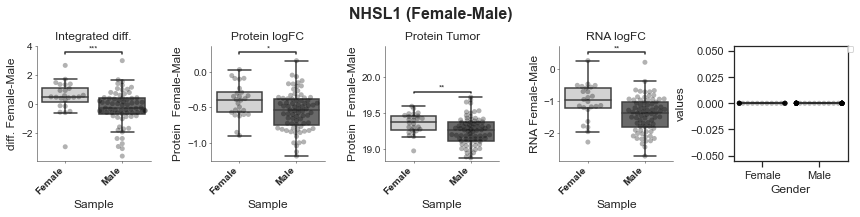

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=5.151e-04 U_stat=1.241e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.152e-03 U_stat=1.350e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.142e-03 U_stat=1.430e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.163e-03 U_stat=1.265e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=6.627e-01 U_stat=1.018e+03
https://www.proteinatlas.org/ENSG00000107902-LHPP/pathology/renal+cancer/KIRC


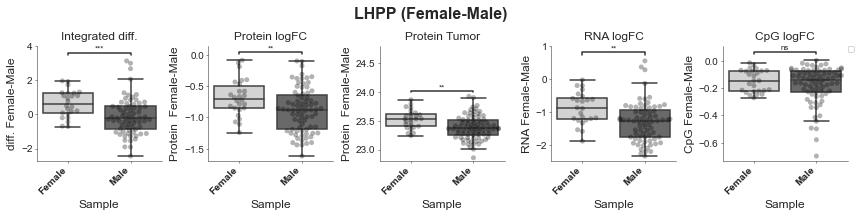

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     TMDS	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.246e-04 U_stat=1

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.058e-01 U_stat=1.111e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.138e-02 U_stat=1.239e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.824e-04 U_stat=1.294e+03
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

CpG
https://www.proteinatlas.org/ENSG00000198121-LPAR1/pathology/renal+cancer/KIRC


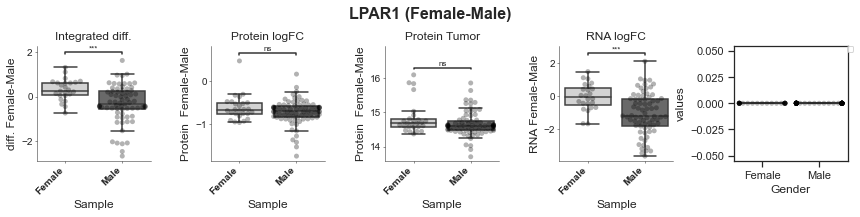

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.661e-06 U_stat=1.382e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=8.253e-04 U_stat=1.442e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.487e-02 U_stat=1.297e+03
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

RNA
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.177e-14 U_stat=0.000e+00


No handles with labels found to put in legend.


https://www.proteinatlas.org/ENSG00000226941-0/pathology/renal+cancer/KIRC


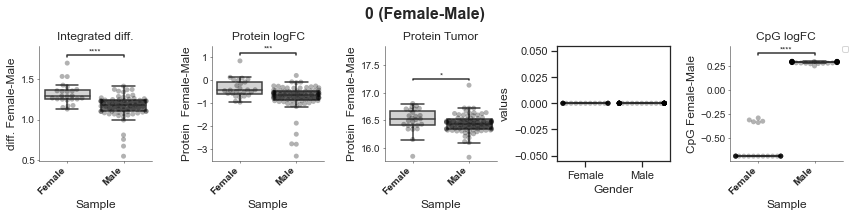

--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     TMDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                   Bottom 5	                                    
--------------------------------------------------------------------------------
----------------------------

No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.304e-01 U_stat=1.013e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.524e-01 U_stat=1.124e+03


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=7.825e-01 U_stat=8.425e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.516e-09 U_stat=1.714e+03
https://www.proteinatlas.org/ENSG00000130829-DUSP9/pathology/renal+cancer/KIRC


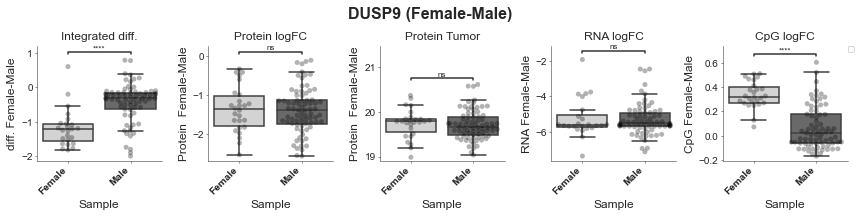

p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=3.600e-05 U_stat=3.630e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=9.546e-01 U_stat=9.930e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=2.145e-01 U_stat=8.370e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.094e-01 U_stat=6.840e+02


No handles with labels found to put in legend.


p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

Female v.s. Male: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=4.309e-05 U_stat=1.483e+03
https://www.proteinatlas.org/ENSG00000130988-RGN/pathology/renal+cancer/KIRC


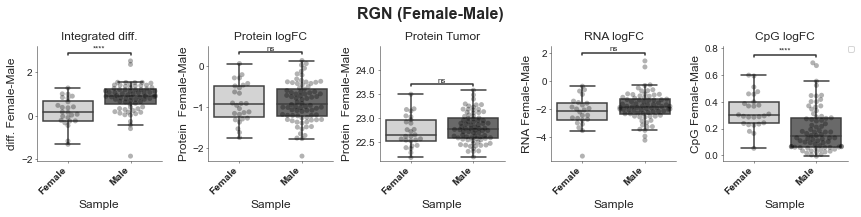

In [43]:
# Lastly, Christina wanted the top ones done for each gene in the top/bottom 5 for each cluster.
# For each cluste pick the n largest and smallest and do teh above plots
rcm_labels = ["MDE", "TPDE", "TPDS", "TMDS", "TMDE", "MDS"]
from sciutil import SciUtil
u = SciUtil()
n = 5
comparisons = ['Late-Early', 'Stage IV-Stage I', 'old-young', 'Female-Male']
labels = ['Stage','Tumor Stage', 'Age', 'Gender']
for c_i, comparison in enumerate(comparisons):
    
    for r in rcm_labels:
        u.dp([r])
        r_df = vae_rcm_df[vae_rcm_df['Regulation_Grouping_2'] == r]
        # Filter to just significant
        vae_change = f'Integrated diff ({comparison})'
        vae_p = f'Integrated padj ({comparison})'
        cond1 = comparison.split('-')[0]
        cond0 = comparison.split('-')[1]

        r_df = r_df[r_df[vae_p] <= 0.05]

        top_df = r_df[r_df[vae_change] > 0]
        bot_df = r_df[r_df[vae_change] < 0]

        top_df = top_df.nlargest(n, vae_change)

        bot_df = bot_df.nsmallest(n, vae_change) 
        # For each of the IDs pop it through
        u.warn_p(['Top 5'])
        for ensembl_id in top_df.index.values:
            gene_name = ens_to_gene[ensembl_id] # Easier to use the gene name for display
            # ALso print the URL so that I can quickly check the ones that look good in protein atlas
    #         newfilename = f'{gene_name.replace(" ", "")}-{ensembl_id}.tsv'
    #         if newfilename not in filenames:
    #             os.system(f'curl https://www.proteinatlas.org/{ensembl_id}.tsv > {output_dir}{newfilename}')
            plot_gene_logfcs(ensembl_id, cond0, cond1, x=labels[c_i])
        u.warn_p(['Bottom 5'])
        for ensembl_id in bot_df.index.values:
            gene_name = ens_to_gene[ensembl_id] # Easier to use the gene name for display
            # ALso print the URL so that I can quickly check the ones that look good in protein atlas
    #         newfilename = f'{gene_name.replace(" ", "")}-{ensembl_id}.tsv'
    #         if newfilename not in filenames:
    #             os.system(f'curl https://www.proteinatlas.org/{ensembl_id}.tsv > {output_dir}{newfilename}')
            plot_gene_logfcs(ensembl_id, cond0, cond1, x=labels[c_i])

In [60]:
# Lastly, Christina wanted the top ones done for each gene in the top/bottom 5 for each cluster.
# For each cluste pick the n largest and smallest and do teh above plots
rcm_labels = ["MDE", "TPDE", "TPDS", "TMDS", "TMDE", "MDS"]
from sciutil import SciUtil
u = SciUtil()
n = 5
comparisons = ['PBRM1-BAP1']
labels = ['Mutation','Tumor Stage', 'Age', 'Gender']
for c_i, comparison in enumerate(comparisons):
    
    for r in rcm_labels:
        u.dp([r])
        r_df = vae_rcm_df[vae_rcm_df['Regulation_Grouping_2'] == r]
        # Filter to just significant
        vae_change = f'Integrated diff ({comparison})'
        vae_p = f'Integrated padj ({comparison})'
        cond1 = comparison.split('-')[0]
        cond0 = comparison.split('-')[1]

        r_df = r_df[r_df[vae_p] <= 0.05]

        top_df = r_df[r_df[vae_change] > 0]
        bot_df = r_df[r_df[vae_change] < 0]

        top_df = top_df.nlargest(n, vae_change)

        bot_df = bot_df.nsmallest(n, vae_change) 
        # For each of the IDs pop it through
        u.warn_p(['Top 5'])
        for ensembl_id in top_df.index.values:
            gene_name = ens_to_gene[ensembl_id] # Easier to use the gene name for display
            # ALso print the URL so that I can quickly check the ones that look good in protein atlas
    #         newfilename = f'{gene_name.replace(" ", "")}-{ensembl_id}.tsv'
    #         if newfilename not in filenames:
    #             os.system(f'curl https://www.proteinatlas.org/{ensembl_id}.tsv > {output_dir}{newfilename}')
            plot_gene_logfcs(ensembl_id, cond0, cond1, x=labels[c_i])
        u.warn_p(['Bottom 5'])
        for ensembl_id in bot_df.index.values:
            gene_name = ens_to_gene[ensembl_id] # Easier to use the gene name for display
            # ALso print the URL so that I can quickly check the ones that look good in protein atlas
    #         newfilename = f'{gene_name.replace(" ", "")}-{ensembl_id}.tsv'
    #         if newfilename not in filenames:
    #             os.system(f'curl https://www.proteinatlas.org/{ensembl_id}.tsv > {output_dir}{newfilename}')
            plot_gene_logfcs(ensembl_id, cond0, cond1, x=labels[c_i])

--------------------------------------------------------------------------------
                                      MDE	                                      
--------------------------------------------------------------------------------
--------------------------------------------------------------------------------
                                     Top 5	                                     
--------------------------------------------------------------------------------
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with Bonferroni correction, P_val=1.049e-04 U_stat=3.740e+02
Integrated
p-value annotation legend:
ns: 5.00e-02 < p <= 1.00e+00
*: 1.00e-02 < p <= 5.00e-02
**: 1.00e-03 < p <= 1.00e-02
***: 1.00e-04 < p <= 1.00e-03
****: p <= 1.00e-04

BAP1 v.s. PBRM1: Mann-Whitney-Wilcoxon test two-sided with B

KeyError: (0.0, 0.0, '0', '.15', 'center_baseline', 'right', 5657004972618380219, None, None, 72.0, <weakref at 0x7fccee5e7e58; to 'RendererAgg' at 0x7fcdda5df2b0>, 1.2)

KeyError: (0.0, 0.0, '0', '.15', 'center_baseline', 'right', 5657004972618380219, None, None, 72.0, <weakref at 0x7fccee5e7e58; to 'RendererAgg' at 0x7fcdda5df2b0>, 1.2)

<Figure size 864x216 with 5 Axes>

## Perform GSEA using fGSEA

We need to save in the correct format and the re-read all in and save as a summary file (since it otherwise takes too long to look at every file).


```

conds = c('Early-Late', 'Random0-Random1',  'Stage1-Stage4', 'Stage1-Stage3', 'VHL-VHL&PBRM1', 'VHL-VHL&TTN', 'young-old', 'Male-Female', 'middle-old',  'Random0.1-Random1.1', 'Random0.2-Random1.2', 'Random0.3-Random1.3', 'Random0.4-Random1.4')

for (cases_conds in conds) {
  for (r in reg_grps) {
    sircleFileName <- paste0('../data/S050_CCRCC_Clark_Cell2019/sircle/all_patients/all_cpgs/Integration/output_data/GSEA/', r, '-IntegrationModel-stats-',cases_conds ,'-.csv')
    # https://bmcbioinformatics.biomedcentral.com/articles/10.1186/1471-2105-11-587
    vis_df <- read.csv(sircleFileName)
    
    # Run GSEA on the consistently changed genes between late and early stage using the t-stat as the rank
    GSEA_results <- GSEASetupSircle(vis_df, paste0(cases_conds, " ", r), gene_name="hgnc_symbol", stat='diff',   GSEA_file_dir=GSEA_file_dir, output_dir='../data/S050_CCRCC_Clark_Cell2019/sircle/all_patients/all_cpgs/Integration/output_data/GSEA/', pathway_list=pathway_list)
  }

}
```

https://www.nature.com/articles/s41581-020-00359-2/figures/6

In [44]:
gsea_dir = '../figures/sircle/all_patients/all_cpgs/mean/'
for f in tqdm(stats_files):
    if 'MEAN' in f:
        df = pd.read_csv(f'{stats_vae_dir}{f}', index_col=0)
        df.set_index('id', inplace=True)
        #stats_summary.append(sumarise_stats_df(f, df, meta_rcm_df, cond0, cond1, save_gsea=save_df))
        # Map gene names and move folder
        df_merged = df.join(meta_rcm_df, how='left')
        df_merged.to_csv(f'{gsea_dir}{f}')

100%|██████████| 8/8 [00:00<00:00, 124737.67it/s]


In [45]:
df_merged

,external_gene_name,Regulation_Grouping_2,Integrated padj (Female-Male),Integrated pval (Female-Male),Integrated diff (Female-Male),mannwhitneyu stat (Female-Male),Integrated mean (Male),Integrated mean (Female),Protein-LogFC mean (Female-Male),RNA-LogFC mean (Female-Male),CpG-LogFC mean (Female-Male),hgnc_symbol,entrezgene_id,Locus,logFC_rna,padj_rna,CpG_Beta_diff,padj_meth,logFC_protein,padj_protein
id,,,,,,,,,,,,,,,,,,,,
ENSG00000000005,TNMD,TPDS_TMDE,0.463720,0.353015,0.105651,796.0,0.005949,0.111601,0.000000,0.120487,-0.152069,TNMD,64102.0,cg16822540,-1.224928,2.276478e-09,-0.322769,1.575338e-36,0.000000,1.000000e+00
ENSG00000003096,KLHL13,TPDS_TMDE,0.277733,0.044203,0.064674,643.0,1.317376,1.382050,0.012591,-0.042001,-0.030489,KLHL13,90293.0,cg03910337,-1.995114,2.057495e-98,-0.073619,3.973276e-25,-0.334346,1.876890e-26
ENSG00000004939,SLC4A1,TPDS_TMDE,0.490023,0.446542,0.036928,824.0,1.190013,1.226941,0.187120,0.268597,-0.008190,SLC4A1,6521.0,cg04433322,-5.779428,1.247209e-104,-0.129298,5.495075e-25,1.368127,1.082974e-31
ENSG00000005001,PRSS22,TPDS_TMDE,0.480126,0.409130,-0.010285,813.0,-0.714380,-0.724666,0.000000,-0.087841,0.013911,PRSS22,64063.0,cg06186790,-5.086436,2.461352e-64,-0.168764,2.222989e-31,0.000000,1.000000e+00
ENSG00000006071,ABCC8,TPDS_TMDE,0.229710,0.022821,0.281661,609.0,-0.344780,-0.063119,0.000000,0.219165,0.014691,ABCC8,6833.0,cg14051368,-1.755468,4.809127e-24,-0.133794,8.156031e-34,0.000000,1.000000e+00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000273045,C2orf15,MDS_TMDE,0.331574,0.128906,0.066497,709.0,1.225407,1.291904,0.025489,-0.130750,0.046389,C2orf15,150590.0,cg15972984,-1.226874,3.586381e-52,0.207537,3.707639e-28,-0.323777,7.543116e-06
ENSG00000273274,ZBTB8B,MDS_TMDE,0.038484,0.000249,0.424306,438.0,-0.188952,0.235354,0.000000,0.112859,-0.068068,ZBTB8B,728116.0,cg09768093,-2.136408,1.666584e-42,0.102212,2.249444e-25,0.000000,1.000000e+00
ENSG00000273328,0,MDS_TMDE,0.351935,0.180148,-0.078364,734.0,-0.171588,-0.249953,0.000000,-0.060877,0.045955,0,NaN,cg26124860,-1.779769,6.813126e-31,0.184453,4.101061e-31,0.000000,1.000000e+00


In [29]:
import os
from sciutil import SciUtil
u = SciUtil()
gsea_dir = f'{stats_base_dir}output_data/Integrated_fGSEA_4/'
rcm_labels = ["MDS", "MDS_TMDE", "MDE", "MDE_TMDS", "TMDE", "TMDS", "TPDE", "TPDE_TMDS",  "TPDS", "TPDS_TMDE"]
files = os.listdir(gsea_dir)
# Read through each one and print out each of the various
# Read through each one and print out each of the various
comparisons = ['PBRM1-BAP1', 'Stage IV-Stage I', 'old-young']
comp_map = {'mutation': 'PBRM1-BAP1', 'S4-S1': 'Stage IV-Stage I', 'age': 'old-young'}
for comp in comparisons:
    with open(f'{gsea_dir}{comp}_sig_consolidated_metabolic_GSEA.tsv', 'w+') as fout:
        fout.write(f'Comparison\tRegulation_Grouping_2\tPathway\t fGSEA NES\t fGSEA padj\t fGSEA pval \t fGSEA size\n')
        for f in files:
            if comp == 'Stage IV-Stage I':
                f_name = f.replace('Stage_IV-Stage_I', 'Stage IV-Stage I')
            else:
                f_name = f
            f_name = '_'.join(f_name.split('_')[1:])
            if 'MetabolicPathways.csv' in f_name and comp == f_name.split('_')[0]:
                f_s = f_name.split('_')
                if f_s[1] in rcm_labels:
                    if f_s[2] == 'GSEA':
                        reg_label = f_s[1]
                    else:
                        reg_label = f_s[1] + '&' + f_s[2]
                    gsea = pd.read_csv(f'{gsea_dir}{f}')
                    sig_gsea = gsea[gsea['padj'] < 0.25]
                    # Make sure the size is > 3
                    sig_gsea = sig_gsea[sig_gsea['size'] > 3]
                    sig_gsea = sig_gsea.sort_values(by='NES')
                    for i, g in enumerate(sig_gsea['pathway'].values):
                        fout.write(f'{comp}\t{reg_label}\t{g}\t{sig_gsea["NES"].values[i]}\t{sig_gsea["padj"].values[i]}\t{sig_gsea["pval"].values[i]}\t{sig_gsea["size"].values[i]}\n')


In [30]:
for comp in comparisons:
    with open(f'{gsea_dir}{comp}_consolidated_metabolic_GSEA.tsv', 'w+') as fout:
        fout.write(f'Comparison\tRegulation_Grouping_2\tPathway\t fGSEA NES\t fGSEA padj\t fGSEA pval \t fGSEA size\n')
        for f in files:
            if comp == 'Stage IV-Stage I':
                f_name = f.replace('Stage_IV-Stage_I', 'Stage IV-Stage I')
            else:
                f_name = f
            f_name = '_'.join(f_name.split('_')[1:])
            if 'MetabolicPathways.csv' in f_name and comp == f_name.split('_')[0]:
                f_s = f_name.split('_')
                if f_s[1] in rcm_labels:
                    if f_s[2] == 'GSEA':
                        reg_label = f_s[1]
                    else:
                        reg_label = f_s[1] + '&' + f_s[2]
                    gsea = pd.read_csv(f'{gsea_dir}{f}')
                    sig_gsea = gsea
                    # Make sure the size is > 3
                    sig_gsea = sig_gsea.sort_values(by='NES')
                    for i, g in enumerate(sig_gsea['pathway'].values):
                        fout.write(f'{comp}\t{reg_label}\t{g}\t{sig_gsea["NES"].values[i]}\t{sig_gsea["padj"].values[i]}\t{sig_gsea["pval"].values[i]}\t{sig_gsea["size"].values[i]}\n')


In [31]:
for comp in comparisons:
    with open(f'{gsea_dir}{comp}_consolidated_pathways_GSEA.tsv', 'w+') as fout:
        fout.write(f'Comparison\tRegulation_Grouping_2\tPathway\t fGSEA NES\t fGSEA padj\t fGSEA pval \t fGSEA size\n')
        for f in files:
            if comp == 'Stage IV-Stage I':
                f_name = f.replace('Stage_IV-Stage_I', 'Stage IV-Stage I')
            else:
                f_name = f
            f_name = '_'.join(f_name.split('_')[1:])
            if '_Pathways.csv' in f_name and comp == f_name.split('_')[0]:
                f_s = f_name.split('_')
                if f_s[1] in rcm_labels:
                    if f_s[2] == 'GSEA':
                        reg_label = f_s[1]
                    else:
                        reg_label = f_s[1] + '&' + f_s[2]
                    gsea = pd.read_csv(f'{gsea_dir}{f}')
                    sig_gsea = gsea
                    # Make sure the size is > 3
                    sig_gsea = sig_gsea.sort_values(by='NES')
                    for i, g in enumerate(sig_gsea['pathway'].values):
                        fout.write(f'{comp}\t{reg_label}\t{g}\t{sig_gsea["NES"].values[i]}\t{sig_gsea["padj"].values[i]}\t{sig_gsea["pval"].values[i]}\t{sig_gsea["size"].values[i]}\n')


In [32]:
for comp in comparisons:
    with open(f'{gsea_dir}{comp}_sig_consolidated_pathways_GSEA.tsv', 'w+') as fout:
        fout.write(f'Comparison\tRegulation_Grouping_2\tPathway\t fGSEA NES\t fGSEA padj\t fGSEA pval \t fGSEA size\n')
        for f in files:
            if comp == 'Stage IV-Stage I':
                f_name = f.replace('Stage_IV-Stage_I', 'Stage IV-Stage I')
            else:
                f_name = f
            f_name = '_'.join(f_name.split('_')[1:])
            if '_Pathways.csv' in f_name and comp == f_name.split('_')[0]:
                f_s = f_name.split('_')
                if f_s[1] in rcm_labels:
                    if f_s[2] == 'GSEA':
                        reg_label = f_s[1]
                    else:
                        reg_label = f_s[1] + '&' + f_s[2]
                    gsea = pd.read_csv(f'{gsea_dir}{f}')
                    sig_gsea = gsea[gsea['padj'] < 0.25]
                    # Make sure the size is > 3
                    sig_gsea = sig_gsea[sig_gsea['size'] > 3]
                    sig_gsea = sig_gsea.sort_values(by='NES')
                    for i, g in enumerate(sig_gsea['pathway'].values):
                        fout.write(f'{comp}\t{reg_label}\t{g}\t{sig_gsea["NES"].values[i]}\t{sig_gsea["padj"].values[i]}\t{sig_gsea["pval"].values[i]}\t{sig_gsea["size"].values[i]}\n')


In [21]:
gsea

,pathway,pval,padj,ES,NES,nMoreExtreme,size,leadingEdge
0,KEGG_PENTOSE_AND_GLUCURONATE_INTERCONVERSIONS,0.610665,0.949243,-0.699311,-0.930216,3114,1,NaN
1,KEGG_FRUCTOSE_AND_MANNOSE_METABOLISM,0.897954,0.996364,-0.409648,-0.649987,3818,2,NaN
2,KEGG_ASCORBATE_AND_ALDARATE_METABOLISM,0.610665,0.949243,-0.699311,-0.930216,3114,1,NaN
3,KEGG_PRIMARY_BILE_ACID_BIOSYNTHESIS,0.975515,0.996364,0.511094,0.684275,4780,1,NaN
4,KEGG_STEROID_HORMONE_BIOSYNTHESIS,0.562715,0.949243,-0.489655,-0.898990,2130,3,NaN
...,...,...,...,...,...,...,...,...
818,HALLMARK_PEROXISOME,0.819186,0.989257,-0.458652,-0.727742,3483,2,NaN
819,HALLMARK_ALLOGRAFT_REJECTION,0.006805,0.700050,0.455394,1.537888,64,66,NaN
820,HALLMARK_SPERMATOGENESIS,0.569050,0.949243,-0.332958,-0.897318,1503,8,NaN
821,HALLMARK_KRAS_SIGNALING_UP,0.426945,0.949243,0.349740,1.046250,3748,29,NaN


## Validation and supplemental figures.

We want to do some validation and QC plots for each of the comparisons.

1. Correlation heatmap with VAE results and the raw data.   (across all clusters)
2. Correlation scatterplot of the VAE compared with the main logFC. (for specific clusters)
3. boxplots for the top an dbottmo 5 genes within each cluster (coloured by the patient features).  



In [50]:
vae_rcm_df


,external_gene_name,entrezgene_id,Locus,hgnc_symbol,logFC_rna,padj_rna,CpG_Beta_diff,padj_meth,logFC_protein,padj_protein,...,Protein-LogFC mean (old-young),RNA-LogFC mean (old-young),CpG-LogFC mean (old-young),Integrated padj (Female-Male),Integrated diff (Female-Male),Integrated mean (Male),Integrated mean (Female),Protein-LogFC mean (Female-Male),RNA-LogFC mean (Female-Male),CpG-LogFC mean (Female-Male)
ensembl_gene_id,,,,,,,,,,,,,,,,,,,,,
ENSG00000000005,TNMD,64102.0,cg16822540,TNMD,-1.224928,2.276478e-09,-0.322769,1.575338e-36,0.000000,1.000000e+00,...,0.000000,-0.558462,-0.133026,0.463720,0.105651,0.005949,0.111601,0.000000,0.120487,-0.152069
ENSG00000000938,FGR,2268.0,0,FGR,1.984350,1.620127e-98,0.000000,1.000000e+00,0.326527,5.511046e-14,...,0.045891,-0.317557,0.000000,0.470723,-0.028158,0.901313,0.873154,0.061025,-0.179993,0.000000
ENSG00000001167,NFYA,4800.0,cg16660580,NFYA,-0.228845,7.971423e-07,-0.026388,1.277784e-19,0.524762,2.431365e-17,...,-0.202162,-0.054657,-0.003458,0.318549,0.230209,-0.742055,-0.511846,0.026823,0.139717,0.003183
ENSG00000001617,SEMA3F,6405.0,0,SEMA3F,1.317463,3.471530e-76,0.000000,1.000000e+00,0.187468,1.256642e-05,...,-0.020589,-0.115469,0.000000,0.188800,0.111518,0.779073,0.890591,0.072812,-0.003989,0.000000
ENSG00000001626,CFTR,1080.0,cg09626894,CFTR,-1.105423,7.692399e-11,0.186895,1.498899e-47,0.611619,1.886151e-14,...,-0.251037,-0.246357,0.141536,0.374305,0.140784,-0.938233,-0.797450,-0.029347,0.379939,0.010262
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ENSG00000278154,0,3903.0,cg22545168,0,0.000000,1.000000e+00,-0.249119,1.139732e-63,1.104333,6.161029e-65,...,-0.235663,0.000000,-0.026416,0.479839,0.002119,-0.359678,-0.357559,0.024274,0.000000,0.018196
ENSG00000278183,0,4363.0,cg04730825,0,0.000000,1.000000e+00,0.074314,8.973349e-20,0.646886,8.156383e-53,...,-0.088021,0.000000,-0.061919,0.470547,0.017177,-0.402991,-0.385814,0.018908,0.000000,-0.002520
ENSG00000279514,0,219428.0,cg22665383,0,0.000000,1.000000e+00,-0.145442,2.446651e-27,-1.377957,4.902472e-44,...,0.547749,0.000000,0.005716,0.475971,0.070811,0.977070,1.047880,0.229402,0.000000,0.047040


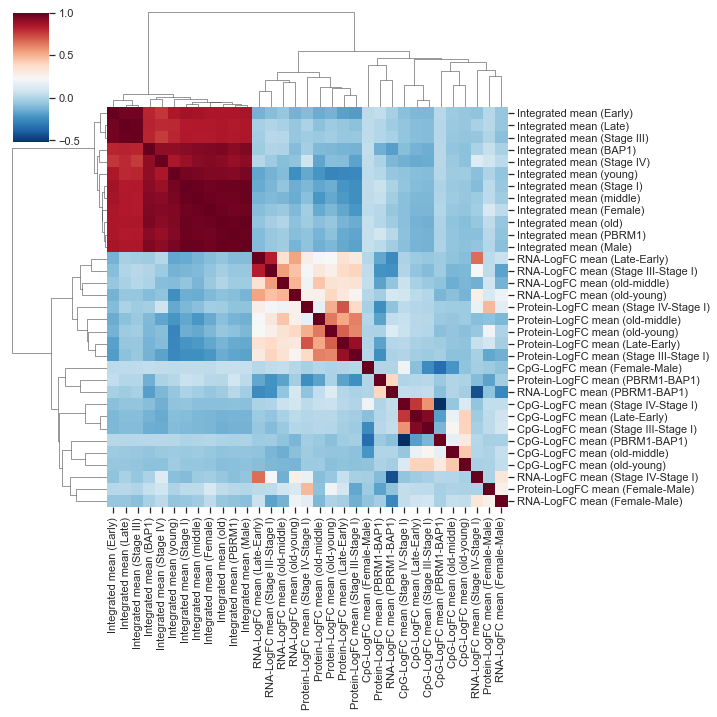

In [51]:
diff_df = vae_rcm_df[[c for c in vae_rcm_df if 'mean' in c]]
corr = diff_df.corr()
sns.clustermap(corr, 
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values, cmap='RdBu_r', row_cluster=True, col_cluster=True)


## Consolidate ORA

In [42]:
ora_dir = '../manuscript/data/RCM ORA results/'
files = os.listdir(ora_dir)
files[2]

'ClusterGoSummary_TMDS_RCM_P0.5-R1.0-M0.1.csv'

In [43]:
ora_df = pd.DataFrame()
for f in files:
    if 'ClusterGoSummary' in f:
        f_s = f.split('_')
        if f_s[1] in rcm_labels:
            if f_s[2] == 'RCM':
                reg_label = f_s[1]
            else:
                reg_label = f_s[1] + '&' + f_s[2]
            ora = pd.read_csv(f'{ora_dir}{f}')
            ora['Regulation_Grouping_2'] = reg_label
            ora_df = ora_df.append(ora)
            print(ora)

    ONTOLOGY          ID                                        Description  \
0         BP  GO:0007600                                 sensory perception   
1         BP  GO:0034765          regulation of ion transmembrane transport   
2         BP  GO:0035725                 sodium ion transmembrane transport   
3         BP  GO:0034762              regulation of transmembrane transport   
4         BP  GO:0006813                            potassium ion transport   
..       ...         ...                                                ...   
124       MF  GO:0005326  neurotransmitter transmembrane transporter act...   
125       MF  GO:0016411            acylglycerol O-acyltransferase activity   
126       MF  GO:0033293                        monocarboxylic acid binding   
127       MF  GO:0030414                       peptidase inhibitor activity   
128       MF  GO:0015020                   glucuronosyltransferase activity   

    GeneRatio    BgRatio        pvalue  p.adjust   

In [45]:
ora_df.to_csv(f'{ora_dir}RCM_ora.csv')